In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import os
import numpy as np
import scanpy as sc
import PyWGCNA
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import ranksums
import re

In [2]:
def stack_triangle(df, col):
    df = pd.DataFrame(
        df.where(
            np.tri(
                df.shape[0],
                dtype=bool,
                k=-1
            ),
            np.nan
        ).stack(dropna=True), columns=[col] 
    )
    
    return df


In [3]:
# Define colors
ncolor = '#00728eff'
tcolor = '#ab3502ff'

# Coevolution - Tumor

In [4]:
mutations = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/tumor/mutations_df.csv')

In [16]:
# Function that generates and saves the ROC curve
def generate_roc_curve(
    data,
    target_col,
    feature_col,
):
    # ROC curve using all gene pairs
    fpr, tpr, thr = roc_curve(data[target_col], data[feature_col])
    auroc = roc_auc_score(data[target_col], data[feature_col])
    
    return fpr, tpr, thr, auroc

In [39]:
all_pairs = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/tumor/All Cancers/fisher_unfiltered.csv').set_index(['gene1', 'gene2'])

In [40]:
max_lor = all_pairs.loc[all_pairs.log2_odds_ratio <  np.inf, 'log2_odds_ratio'].max() + 1
min_lor = all_pairs.loc[all_pairs.log2_odds_ratio > -np.inf, 'log2_odds_ratio'].min() - 1

all_pairs.loc[all_pairs.log2_odds_ratio ==  np.inf, 'log2_odds_ratio'] = max_lor
all_pairs.loc[all_pairs.log2_odds_ratio == -np.inf, 'log2_odds_ratio'] = min_lor

all_pairs['-log10pval'] = -np.log10(all_pairs['pval'])

In [42]:
# Diff complex interactions
fpr, tpr, thr, auroc = generate_roc_curve(
    data=all_pairs,
    target_col="interaction",
    feature_col="-log10pval",
)

print('auroc')

auroc


In [43]:
auroc

0.5297258508280704

In [44]:
all_pairs

interaction  log2_odds_ratio          pval      pval_adj  \
gene1     gene2                                                                 
BAT2D1    HPSE_CCDS        False        14.145932  2.745261e-33  1.898051e-27   
HPSE_CCDS CDC2L2           False        14.145932  2.745261e-33  1.898051e-27   
FRG1B     CDC2L2           False        14.145932  2.339629e-33  1.898051e-27   
BAT2D1    FRG1B            False        14.145932  2.339629e-33  1.898051e-27   
MRPL30    CDC2L2           False        14.145932  2.339629e-33  1.898051e-27   
...                          ...              ...           ...           ...   
PHF19     SRBD1            False        -4.006841  1.000000e+00  1.000000e+00   
NTRK3     KIAA0319L        False        -4.006841  1.000000e+00  1.000000e+00   
          PTPN13           False        -4.006841  1.000000e+00  1.000000e+00   
          TMEM63A          False        -4.006841  1.000000e+00  1.000000e+00   
SLX4      OTUD4            False        -4.006841  1.000000e+00  1.000000e+00   

                     -log10pval  
gene1     gene2                  
BAT2D1    HPSE_CCDS   32.561416  
HPSE_CCDS CDC2L2      32.561416  
FRG1B     CDC2L2      32.630853  
BAT2D1    FRG1B       32.630853  
MRPL30    CDC2L2      32.630853  
...                         ...  
PHF19     SRBD1       -0.000000  
NTRK3     KIAA0319L   -0.000000  
          PTPN13      -0.000000  
          TMEM63A     -0.000000  
SLX4      OTUD4       -0.000000  

[8296701 rows x 5 columns]

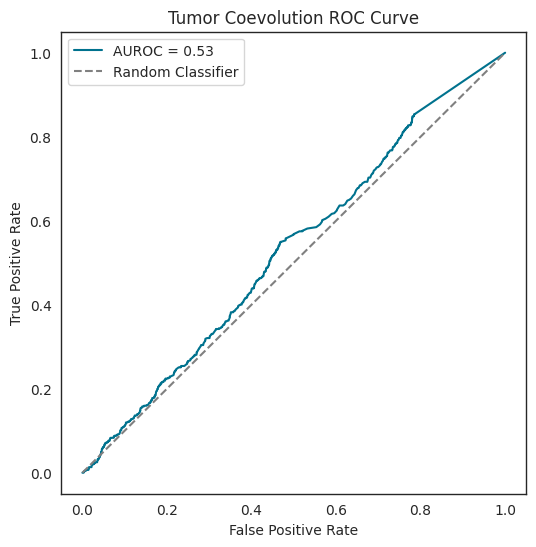

In [45]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f'AUROC = {auroc:.2f}', color=ncolor)
plt.plot([0, 1], [0, 1], linestyle='--', label='Random Classifier', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Tumor Coevolution ROC Curve')
plt.legend(loc='upper left')
#plt.grid(True)
plt.show()


In [80]:
tissue = 'All Cancers'
mutation_type='Patient'

In [85]:
df_complete = pd.read_csv('/projects/bioinformatics/DB/CancerTracer/intra_heterogeneity_data.txt', sep='\t')
df_complete = df_complete.set_index('Sample')
df_complete = df_complete.replace({'-': ''})

# Remove wrongly formatted row
df_complete = df_complete[~df_complete.index.isin(['p075_p3'])]

In [81]:
coev = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/coevolution/tumor/{tissue}/{mutation_type}/jaccard.csv', index_col=0)
gene_counts = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/coevolution/tumor/{tissue}/{mutation_type}/gene_counts.csv', index_col=0)
gene_counts = gene_counts.rename(columns={'genes': 'All'})

In [82]:
path = '/home/lnemati/pathway_crosstalk/results/coevolution/tumor/All Cancers'

for mutation_type in ['Trunk', 'Branch', 'Private']:
    gene_counts[mutation_type] = pd.read_csv(os.path.join(path, mutation_type, 'gene_counts.csv'), index_col=0)['genes']
    
gene_counts = gene_counts.fillna(0)

In [83]:
path = '/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv'

interactions = pd.read_csv(path)

# Extract genes for complex A and B for each row
complex_a_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(1, row['num_interactors_a'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
complex_b_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(row['num_interactors_a'] + 1, row['num_interactors_a'] + row['num_interactors_b'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
interactions_all_genes = complex_a_genes + complex_b_genes

# make all_interacting_genes a list containing all unique genes in the interactions
all_interacting_genes = list(set().union(*interactions_all_genes))
print("Number of interacting genes: ", len(all_interacting_genes))

Number of interacting genes:  1576


In [84]:
gene_counts['interactor'] = False
gene_counts.loc[gene_counts.index.isin(all_interacting_genes), 'interactor'] = True

In [10]:
from itertools import combinations, product

# Function that generates and saves the ROC curve
def generate_roc_curve(
    data,
    target_col,
    feature_col,
):
    # ROC curve using all gene pairs
    fpr, tpr, thr = roc_curve(data[target_col], data[feature_col])
    auroc = roc_auc_score(data[target_col], data[feature_col])
    
    return fpr, tpr, thr, auroc

def update_diff_complex(
    coev,
    genes_series_a,
    genes_series_b
):
    for genes_a, genes_b in zip(genes_series_a, genes_series_b):
        for pair in product(genes_a, genes_b):
            gene_a, gene_b = pair
            if pair in coev.index:
                coev.loc[pair, "interaction"] = 1
            elif (gene_b, gene_a) in coev.index:
                coev.loc[(gene_b, gene_a), "interaction"] = 1
    return

print("Reading interactions.csv")
# read interactions.csv

path = '/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv'

interactions = pd.read_csv(path)

# Extract genes for complex A and B for each row
complex_a_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(1, row['num_interactors_a'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
complex_b_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(row['num_interactors_a'] + 1, row['num_interactors_a'] + row['num_interactors_b'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
interactions_all_genes = complex_a_genes + complex_b_genes

# make all_interacting_genes a list containing all unique genes in the interactions
all_interacting_genes = list(set().union(*interactions_all_genes))
print("Number of interacting genes: ", len(all_interacting_genes))

# ----- ROC all gene pairs -----

print("Generating ROC curves")

print("coev has shape: ", coev.shape)

# flatten TOM matrix, remove diagonal and duplicated values
print("Flattening coev matrix")
coev = pd.DataFrame(
    coev.where(
        np.tri(
            coev.shape[0],
            dtype=bool,
            k=-1
        ),
        np.nan
    ).stack(dropna=True), columns=["coev"]
)
print("coev has now shape: ", coev.shape)

coev['interaction'] = 0

update_diff_complex(coev, complex_a_genes, complex_b_genes)

print("Total number of interacting pairs: ", coev["interaction"].sum())

# Diff complex interactions
fpr, tpr, thr, auroc = generate_roc_curve(
    data=coev,
    target_col="interaction",
    feature_col="coev",
)

print('auroc:', auroc)

# ------ Rank Sum Test VS All -------
#print("Performing rank sum test")
#
## Perform rank sum test: do interacting pairs have higher TOM than other pairs?
#U_all, p_all = ranksums(
#    coev.loc[coev['interaction'] == True, "coev"],
#    coev.loc[coev['interaction'] == False, "coev"],
#    alternative="greater"
#)
#
#print('U:', U_all)
#print('p:', p_all)

Reading interactions.csv
Number of interacting genes:  1576
Generating ROC curves
coev has shape:  (20155, 20155)
Flattening coev matrix
coev has now shape:  (203101935, 1)
Total number of interacting pairs:  3433
auroc: 0.5881786390268736


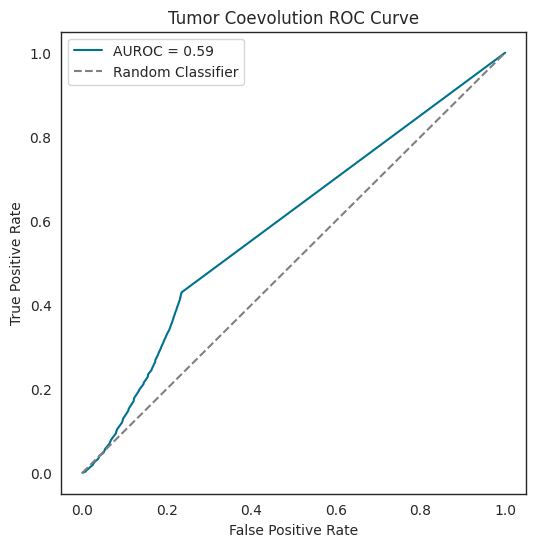

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f'AUROC = {auroc:.2f}', color=ncolor)
plt.plot([0, 1], [0, 1], linestyle='--', label='Random Classifier', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Tumor Coevolution ROC Curve')
plt.legend(loc='upper left')
#plt.grid(True)
plt.show()


In [23]:
'orig' + pd.Series(range(1, 10)).astype(str).values

array(['orig1', 'orig2', 'orig3', 'orig4', 'orig5', 'orig6', 'orig7',
       'orig8', 'orig9'], dtype=object)

In [12]:
coev[coev['interaction'] == 1].sort_values(by = 'coev', ascending=False)[:20]

,,coev,interaction
RXFP4,INSL3,0.500000,1
NAPEPLD,CNR2,0.400000,1
MICA,KLRK1,0.333333,1
JAM3,JAM2,0.300000,1
IL1RN,IL1R2,0.285714,1
GIPR,GIP,0.250000,1
PLA2G2A,FFAR4,0.250000,1
WNT5A,RYK,0.250000,1
WNT9B,FZD5,0.250000,1
WNT3A,FZD5,0.250000,1


In [13]:
tpr[tpr < 1].max()

0.4296533644043111

In [42]:
tcoev_int = coev[coev.interaction == 1]

In [46]:
tcoev_int.to_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_tumor_coev_all.csv')

In [86]:
cols = ['Trunk', 'Branch', 'Private']

fracs = gene_counts[cols]

tot = df_complete.shape[0]

for col in cols:
    fracs[col] = gene_counts[col] / tot

In [98]:
gene_counts

,All,Trunk,Branch,Private,interactor
TP53,397,292.0,86.0,108.0,False
TTN,221,154.0,86.0,257.0,False
EGFR,158,104.0,29.0,57.0,True
MUC16,131,85.0,53.0,111.0,False
PTEN,116,50.0,29.0,50.0,False
...,...,...,...,...,...
C17orf108,1,0.0,0.0,1.0,False
C6orf204,1,0.0,1.0,0.0,False
TEX19,1,0.0,0.0,1.0,False
ALDH3B1,1,0.0,0.0,1.0,False


In [87]:
fracs

,Trunk,Branch,Private
TP53,0.253472,0.074653,0.093750
TTN,0.133681,0.074653,0.223090
EGFR,0.090278,0.025174,0.049479
MUC16,0.073785,0.046007,0.096354
PTEN,0.043403,0.025174,0.043403
...,...,...,...
C17orf108,0.000000,0.000000,0.000868
C6orf204,0.000000,0.000868,0.000000
TEX19,0.000000,0.000000,0.000868
ALDH3B1,0.000000,0.000000,0.000868


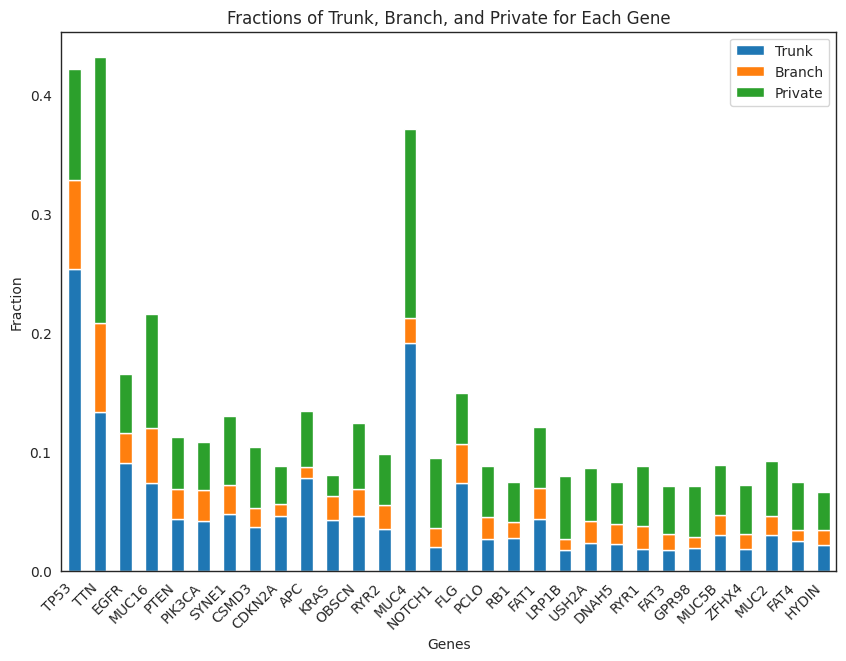

In [93]:
# Create a stacked bar plot
ax = fracs[:30].plot(kind='bar', stacked=True, figsize=(10, 7))

# Set labels and title
ax.set_xlabel('Genes')
ax.set_ylabel('Fraction')
ax.set_title('Fractions of Trunk, Branch, and Private for Each Gene')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.show()

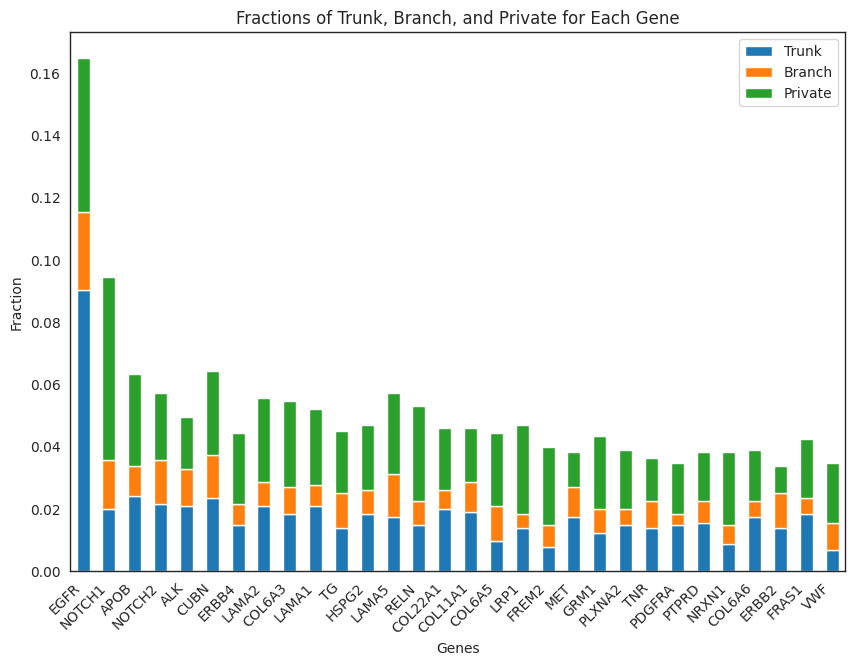

In [94]:
interactors = gene_counts[gene_counts['interactor']].index

# Create a stacked bar plot
ax = fracs.loc[interactors][0:30].plot(kind='bar', stacked=True, figsize=(10, 7))

# Set labels and title
ax.set_xlabel('Genes')
ax.set_ylabel('Fraction')
ax.set_title('Fractions of Trunk, Branch, and Private for Each Gene')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.show()

In [90]:
mutated = gene_counts[gene_counts['All'] > 10].index

In [99]:
df_frac

,Trunk,Branch,Private
TP53,0.253472,0.074653,0.093750
MUC4,0.190972,0.021701,0.158854
TTN,0.133681,0.074653,0.223090
EGFR,0.090278,0.025174,0.049479
APC,0.078125,0.008681,0.047743
...,...,...,...
CDC7,0.000000,0.001736,0.009549
NBPF1,0.000000,0.006944,0.006944
PANK3,0.000000,0.001736,0.009549
NPHP3,0.000000,0.000868,0.009549


In [101]:
df_frac = fracs.loc[mutated].sort_values(by='Trunk', ascending=False)
df_frac.loc[df_frac.index.intersection(interactors)][:20]

,Trunk,Branch,Private
EGFR,0.090278,0.025174,0.049479
APOB,0.024306,0.009549,0.029514
CUBN,0.023438,0.013889,0.026910
NOTCH2,0.021701,0.013889,0.021701
LAMA2,0.020833,0.007812,0.026910
ALK,0.020833,0.012153,0.016493
LAMA1,0.020833,0.006944,0.024306
COL22A1,0.019965,0.006076,0.019965
NOTCH1,0.019965,0.015625,0.059028
COL11A1,0.019097,0.009549,0.017361


In [92]:
df_frac = fracs.loc[mutated].sort_values(by='Private', ascending=False)
df_frac.loc[df_frac.index.intersection(interactors)][:20]

,Trunk,Branch,Private
NOTCH1,0.019965,0.015625,0.059028
EGFR,0.090278,0.025174,0.049479
RELN,0.014757,0.007812,0.030382
APOB,0.024306,0.009549,0.029514
LRP1,0.013889,0.004340,0.028646
COL6A3,0.018229,0.008681,0.027778
LAMA2,0.020833,0.007812,0.026910
CUBN,0.023438,0.013889,0.026910
LAMA5,0.017361,0.013889,0.026042
FREM2,0.007812,0.006944,0.025174


# Coevolution - Normal

In [4]:
from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import ranksums
from itertools import combinations, product

# Function that generates and saves the ROC curve
def generate_roc_curve(
    data,
    target_col,
    feature_col,
    name=None,
):
    # ROC curve using all gene pairs
    fpr, tpr, _ = roc_curve(data[target_col], data[feature_col])
    auroc = roc_auc_score(data[target_col], data[feature_col])
    
    return fpr, tpr, auroc

def update_diff_complex(
    all_pairs,
    genes_series_a,
    genes_series_b
):
    for genes_a, genes_b in zip(genes_series_a, genes_series_b):
        for pair in product(genes_a, genes_b):
            gene_a, gene_b = pair
            if pair in all_pairs.index:
                all_pairs.loc[pair, "interaction"] = 1
            elif (gene_b, gene_a) in all_pairs.index:
                all_pairs.loc[(gene_b, gene_a), "interaction"] = 1
    return

print("Reading interactions.csv")
# read interactions.csv 
interactions = pd.read_csv('/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv')
coev = pd.read_csv('/home/lnemati/resources/coevolution/jaccard_genes.csv.gz', index_col=0)

# Extract genes for complex A and B for each row
complex_a_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(1, row['num_interactors_a'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
complex_b_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(row['num_interactors_a'] + 1, row['num_interactors_a'] + row['num_interactors_b'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
interactions_all_genes = complex_a_genes + complex_b_genes

# make all_interacting_genes a list containing all unique genes in the interactions
all_interacting_genes = list(set().union(*interactions_all_genes))
print("Number of interacting genes: ", len(all_interacting_genes))

# ----- ROC all gene pairs -----

print("Generating ROC curves")

print("coev has shape: ", coev.shape)
print(coev.head())

# flatten TOM matrix, remove diagonal and duplicated values
print("Flattening coev matrix")
all_pairs = pd.DataFrame(
    coev.where(
        np.tri(
            coev.shape[0],
            dtype=bool,
            k=-1
        ),
        np.nan
    ).stack(dropna=True), columns=["coev"]
)
print("all_pairs has now shape: ", all_pairs.shape)

all_pairs['interaction'] = 0

update_diff_complex(all_pairs, complex_a_genes, complex_b_genes)

print("Total number of interacting pairs: ", all_pairs["interaction"].sum())
# find nans in all_pairs
print("Number of nans in all_pairs: ", all_pairs.isna().sum())

# Diff complex interactions
fpr, tpr, auroc = generate_roc_curve(
    data=all_pairs,
    target_col="interaction",
    feature_col="coev",
    name='Coevoulution'
)

print('auroc:', auroc)

# ------ Rank Sum Test VS All -------
#print("Performing rank sum test")
#
## Perform rank sum test: do interacting pairs have higher TOM than other pairs?
#U_all, p_all = ranksums(
#    all_pairs.loc[all_pairs['interaction'] == True, "coev"],
#    all_pairs.loc[all_pairs['interaction'] == False, "coev"],
#    alternative="greater"
#)

Reading interactions.csv
Number of interacting genes:  1576
Generating ROC curves
coev has shape:  (17756, 17756)
             A1BG       A2M     A2ML1   A3GALT2    A4GALT     A4GNT      AAAS  \
A1BG     1.000000  0.439024  0.428571  0.392523  0.314286  0.371622  0.215139   
A2M      0.439024  1.000000  0.524823  0.345912  0.473373  0.549133  0.345455   
A2ML1    0.428571  0.524823  1.000000  0.280822  0.298246  0.331492  0.265683   
A3GALT2  0.392523  0.345912  0.280822  1.000000  0.255682  0.276596  0.330739   
A4GALT   0.314286  0.473373  0.298246  0.255682  1.000000  0.608187  0.391144   

             AACS     AADAC   AADACL2  ...    ZWILCH     ZWINT      ZXDA  \
A1BG     0.068331  0.086124  0.213542  ...  0.314286  0.722222  0.404255   
A2M      0.127086  0.168919  0.231405  ...  0.520619  0.524194  0.448529   
A2ML1    0.085459  0.105618  0.168103  ...  0.326733  0.396552  0.278195   
A3GALT2  0.114024  0.163507  0.194690  ...  0.491620  0.463636  0.280303   
A4GALT   0.121673  

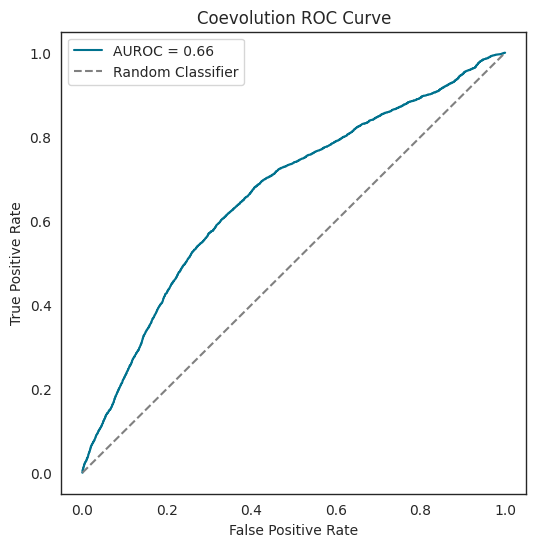

In [5]:
plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f'AUROC = {auroc:.2f}', color=ncolor)
plt.plot([0, 1], [0, 1], linestyle='--', label='Random Classifier', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Coevolution ROC Curve')
plt.legend(loc='upper left')
#plt.grid(True)
plt.show()


In [8]:
ncoev_int = all_pairs[all_pairs.interaction == 1]

In [9]:
ncoev_int

coev  interaction
ADIPOR1 ADIPOQ  0.194296            1
ADIPOR2 ADIPOQ  0.208487            1
ADORA1  ACP3    0.291429            1
        ADA     0.123382            1
        ADA2    0.316754            1
...                  ...          ...
WNT9B   SFRP4   0.575581            1
        SFRP5   0.560440            1
        WIF1    0.524887            1
XCR1    XCL1    0.478873            1
        XCL2    0.485915            1

[3467 rows x 2 columns]

In [10]:
ncoev_int.to_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_normal_coev.csv')

In [29]:
ncoev_int = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_normal_coev.csv')
tcoev_int = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_tumor_coev_all.csv')

ncoev_int = ncoev_int.set_index(['Unnamed: 0', 'Unnamed: 1']).drop(columns='interaction')
tcoev_int = tcoev_int.set_index(['Unnamed: 0', 'Unnamed: 1']).drop(columns='interaction')

common_pairs = tcoev_int.index.intersection(ncoev_int.index)

ncoev_int = ncoev_int.loc[common_pairs]
tcoev_int = tcoev_int.loc[common_pairs]

In [34]:
from scipy.stats import spearmanr
spearmanr(ncoev_int.coev, tcoev_int.coev)

SignificanceResult(statistic=-0.0018571881162175968, pvalue=0.9285297752167221)

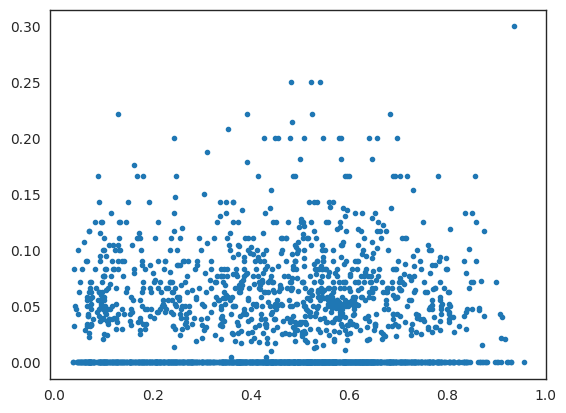

In [36]:
plt.plot(ncoev_int.coev, tcoev_int.coev, marker='.', linestyle=' ')

In [38]:
tcoev_int.idxmax()

coev    (JAM3, JAM2)
dtype: object

In [8]:
ncorr = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/coexpression_correlation_normal.csv.gz', index_col=0)
tcorr = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/coexpression_correlation_tumor.csv.gz', index_col=0)

In [4]:
norm = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/avg_coexpression_normal.csv.gz', index_col=0)
norm = tri_vals(norm)

In [5]:
tumo = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/avg_coexpression_tumor.csv.gz', index_col=0)
tumo = tri_vals(tumo)

In [7]:
def tri_vals(df):
    # Convert DataFrame to NumPy array
    arr = df.to_numpy()
    
    # Get the indices for the upper triangle excluding the diagonal
    triu_indices = np.triu_indices(arr.shape[0], k=1)
    
    # Extract the upper triangle values using the indices
    upper_triangle_vals = arr[triu_indices]
    
    return upper_triangle_vals

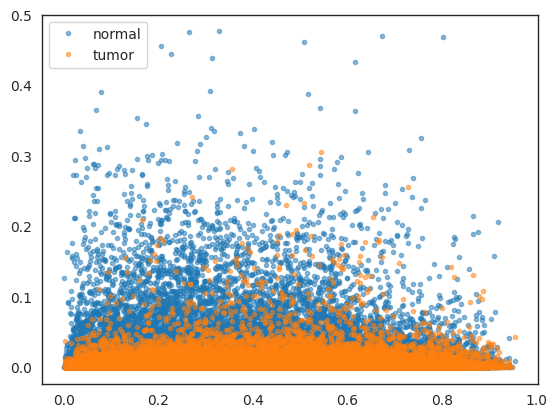

In [30]:
subset = 100
plt.plot(coev[::subset], norm[::subset], label='normal', linestyle=" ", marker='.', alpha=0.5)
plt.plot(coev[::subset], tumo[::subset], label='tumor', linestyle=" ", marker='.', alpha=0.5)
plt.legend()

In [37]:
from scipy.stats import spearmanr
from scipy.stats import pearsonr

In [43]:
subset = 100

In [44]:
spearmanr(norm[::subset], tumo[::subset], nan_policy='omit')

SignificanceResult(statistic=0.35415773680445267, pvalue=0.0)

In [45]:
spearmanr(coev[::subset], norm[::subset], nan_policy='omit')

SignificanceResult(statistic=0.117068279621558, pvalue=0.0)

In [46]:
spearmanr(coev[::subset], tumo[::subset], nan_policy='omit')

SignificanceResult(statistic=0.08840442631874691, pvalue=0.0)

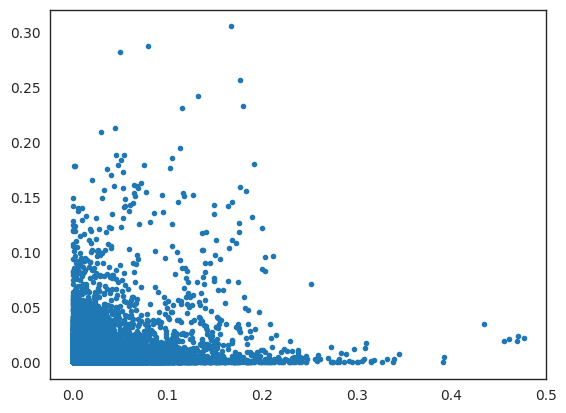

In [31]:
plt.plot(norm[::subset], tumo[::subset], label='normal', linestyle=" ", marker='.')

# Hub Genes

In [91]:
import pandas as pd

In [92]:
df = pd.read_csv('/home/lnemati/pathway_crosstalk/results/hub_genes.csv', index_col=0)
df.head(3)

,global_hub_tumor,global_hub_normal,interactor
IL16,0.84375,0.021277,1
CSF2RB,0.84375,0.021277,1
TNFAIP8L2,0.87500,0.063830,0


In [99]:
df.sort_values(by='global_hub_tumor', ascending=False)[:5]

,global_hub_tumor,global_hub_normal,interactor
NCKAP1L,0.93750,0.191489,0
SASH3,0.93750,0.255319,0
CYTH4,0.90625,0.148936,0
WAS,0.90625,0.276596,0
MYO1F,0.90625,0.191489,0


In [101]:
df.query('global_hub_tumor > 0.9')

,global_hub_tumor,global_hub_normal,interactor
CD37,0.90625,0.148936,0
CYTH4,0.90625,0.148936,0
NCKAP1L,0.93750,0.191489,0
IL10RA,0.90625,0.170213,1
MYO1F,0.90625,0.191489,0
LAIR1,0.90625,0.212766,1
SASH3,0.93750,0.255319,0
WAS,0.90625,0.276596,0


In [103]:
df.query('global_hub_tumor == 0.').interactor.value_counts()

0    5522
1     371
Name: interactor, dtype: int64

In [104]:
df.query('global_hub_normal == 0.').interactor.value_counts()

0    1499
1     157
Name: interactor, dtype: int64

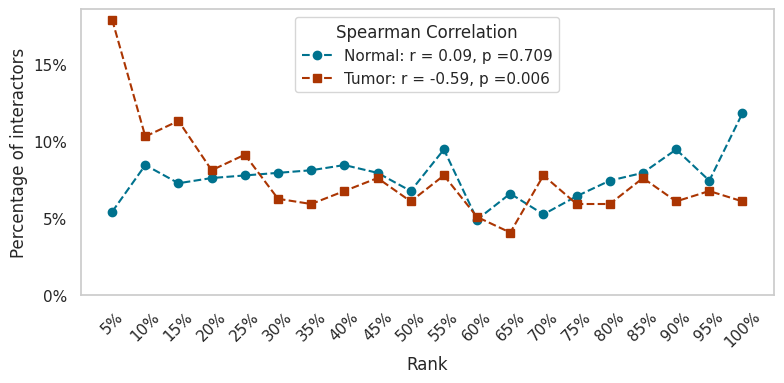

In [129]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

def plot_interactor_frequency(
    df,
    n_intervals,
    color,
    marker,
    label=None,
    ax=None
):
    interval_length = len(df) // n_intervals

    interactor_frequencies = []

    for i in range(n_intervals):
        interval_df = df.iloc[i*interval_length:(i+1)*interval_length]
        frequency = interval_df['interactor'].sum()
        percentage = (frequency / interval_length) * 100  # Calculate percentage
        interactor_frequencies.append(percentage)
        
    correlation, p_value = spearmanr(range(n_intervals), interactor_frequencies)

    if ax is None:
        ax = plt.gca()  # Get current axes if ax is not provided
    
    ax.plot(
        range(n_intervals),
        interactor_frequencies,
        color=color,
        marker=marker,
        linestyle='--',
        label=label+f': r = {correlation:.2f}, p ={p_value:.3f}',
    )
    ax.set_xlabel('Rank')
    ax.set_ylabel('Percentage of interactors')
    ax.set_xticks(range(n_intervals))
    ax.set_xticklabels([f'{100*(i+1)/n_intervals:.0f}%' for i in range(n_intervals)], rotation=45)
    ax.set_yticks([i for i in range(0, 16, 5)])
    ax.set_yticklabels([f'{i}%' for i in range(0, 16, 5)])  # Adding % sign to yticks
    ax.grid(False)
    
    plt.tight_layout()

# Example usage
fig, ax = plt.subplots(1, 1, figsize=(8, 4))

df['sum'] = df['global_hub_tumor'] + df['global_hub_normal']
df['diff'] = df['global_hub_tumor'] - df['global_hub_normal']

n = 20
plot_interactor_frequency(df.sort_values(by='global_hub_normal', ascending=False), n, ncolor, 'o', label='Normal', ax=ax)
plot_interactor_frequency(df.sort_values(by='global_hub_tumor', ascending=False), n, tcolor, 's', label='Tumor', ax=ax)

# Legend at the top and centered
ax.legend(title=f'Spearman Correlation', loc='upper center')

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/hubs/rank.pdf')

plt.title('')
plt.tight_layout()
plt.show()


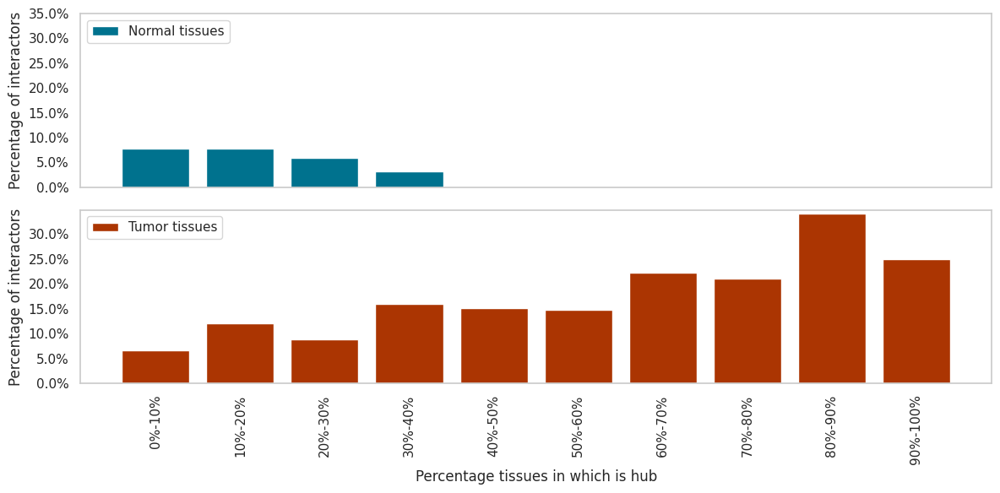

In [130]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter, MultipleLocator

def plot_bin_histogram(df, num_bins):
    # Define the bin edges
    bin_edges = [i * (1/num_bins) for i in range(num_bins + 1)]  # bins from 0 to 1 divided into num_bins

    # Create labels for the bins
    bin_labels = [f'{i:.0%}-{i + (1/num_bins):.0%}' for i in bin_edges[:-1]]

    # Cut the global_hub_tumor column into bins
    df['tumor_bin'] = pd.cut(df['global_hub_tumor'], bins=bin_edges, labels=bin_labels, right=False)

    # Cut the global_hub_normal column into bins
    df['normal_bin'] = pd.cut(df['global_hub_normal'], bins=bin_edges, labels=bin_labels, right=False)

    # Group by the tumor bins and calculate the fraction of interactors in each bin
    tumor_bin_stats = df.groupby('tumor_bin')['interactor'].mean()

    # Group by the normal bins and calculate the fraction of interactors in each bin
    normal_bin_stats = df.groupby('normal_bin')['interactor'].mean()

    # Fill in missing bins with 0 values
    tumor_bin_stats = tumor_bin_stats.reindex(bin_labels, fill_value=0)
    normal_bin_stats = normal_bin_stats.reindex(bin_labels, fill_value=0)

    # Create subplots with shared x-axis
    fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
    fig.subplots_adjust(hspace=0.0)

    # Plot for global_hub_normal
    axs[0].bar(normal_bin_stats.index, normal_bin_stats, color=ncolor, label='Normal tissues')
    axs[0].set_ylabel('Percentage of interactors')
    axs[0].yaxis.set_major_formatter(PercentFormatter(xmax=1))
    axs[0].yaxis.set_major_locator(MultipleLocator(0.05))
    axs[0].set_ylim(0, 0.350)  # Set y-axis limit
    axs[0].grid(False)
    axs[0].legend()

    # Plot for global_hub_tumor
    axs[1].bar(tumor_bin_stats.index, tumor_bin_stats, color=tcolor, label='Tumor tissues')
    axs[1].set_xlabel('Percentage tissues in which is hub')
    axs[1].set_ylabel('Percentage of interactors')
    axs[1].yaxis.set_major_formatter(PercentFormatter(xmax=1))
    axs[1].yaxis.set_major_locator(MultipleLocator(0.05))
    axs[1].set_ylim(0, 0.349)  # Set y-axis limit
    axs[1].grid(False)
    axs[1].legend()

    # Rotate x-labels by 90 degrees
    plt.setp(axs[1].xaxis.get_majorticklabels(), rotation=90)
    plt.tight_layout()
    
    plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/hubs/histogram_hubs.pdf')
    
    plt.show()

# Example usage:
plot_bin_histogram(df, num_bins=10)  # Change num_bins to the desired number of bins


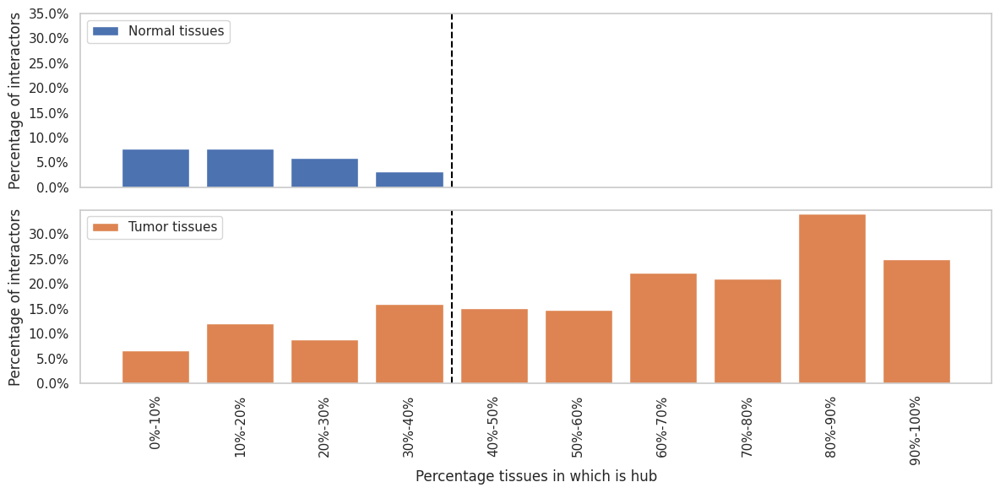

In [131]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter, MultipleLocator

def plot_bin_histogram(df, num_bins):
    # Define the bin edges
    bin_edges = [i * (1/num_bins) for i in range(num_bins + 1)]  # bins from 0 to 1 divided into num_bins

    # Create labels for the bins
    bin_labels = [f'{i:.0%}-{i + (1/num_bins):.0%}' for i in bin_edges[:-1]]

    # Cut the global_hub_tumor column into bins
    df['tumor_bin'] = pd.cut(df['global_hub_tumor'], bins=bin_edges, labels=bin_labels, right=False)

    # Cut the global_hub_normal column into bins
    df['normal_bin'] = pd.cut(df['global_hub_normal'], bins=bin_edges, labels=bin_labels, right=False)

    # Group by the tumor bins and calculate the fraction of interactors in each bin
    tumor_bin_stats = df.groupby('tumor_bin')['interactor'].mean()

    # Group by the normal bins and calculate the fraction of interactors in each bin
    normal_bin_stats = df.groupby('normal_bin')['interactor'].mean()

    # Fill in missing bins with 0 values
    tumor_bin_stats = tumor_bin_stats.reindex(bin_labels, fill_value=0)
    normal_bin_stats = normal_bin_stats.reindex(bin_labels, fill_value=0)

    # Create subplots with shared x-axis
    fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
    fig.subplots_adjust(hspace=0.0)

    # Plot for global_hub_normal
    axs[0].bar(normal_bin_stats.index, normal_bin_stats, color='C0', label='Normal tissues')
    axs[0].set_ylabel('Percentage of interactors')
    axs[0].yaxis.set_major_formatter(PercentFormatter(xmax=1))
    axs[0].yaxis.set_major_locator(MultipleLocator(0.05))
    axs[0].set_ylim(0, 0.350)  # Set y-axis limit
    axs[0].grid(False)
    axs[0].legend()

    # Add vertical dashed black line between 30-40 and 40-50 bins
    axs[0].axvline(x=3.5, color='black', linestyle='--')

    # Plot for global_hub_tumor
    axs[1].bar(tumor_bin_stats.index, tumor_bin_stats, color='C1', label='Tumor tissues')
    axs[1].set_xlabel('Percentage tissues in which is hub')
    axs[1].set_ylabel('Percentage of interactors')
    axs[1].yaxis.set_major_formatter(PercentFormatter(xmax=1))
    axs[1].yaxis.set_major_locator(MultipleLocator(0.05))
    axs[1].set_ylim(0, 0.349)  # Set y-axis limit
    axs[1].grid(False)
    axs[1].legend()

    # Add vertical dashed black line between 30-40 and 40-50 bins
    axs[1].axvline(x=3.5, color='black', linestyle='--')

    # Rotate x-labels by 90 degrees
    plt.setp(axs[1].xaxis.get_majorticklabels(), rotation=90)
    plt.tight_layout()

    
    plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/hubs/histogram_hubs_vertical_line.pdf')


    plt.show()

# Example usage:
plot_bin_histogram(df, num_bins=10)  # Change num_bins to the desired number of bins


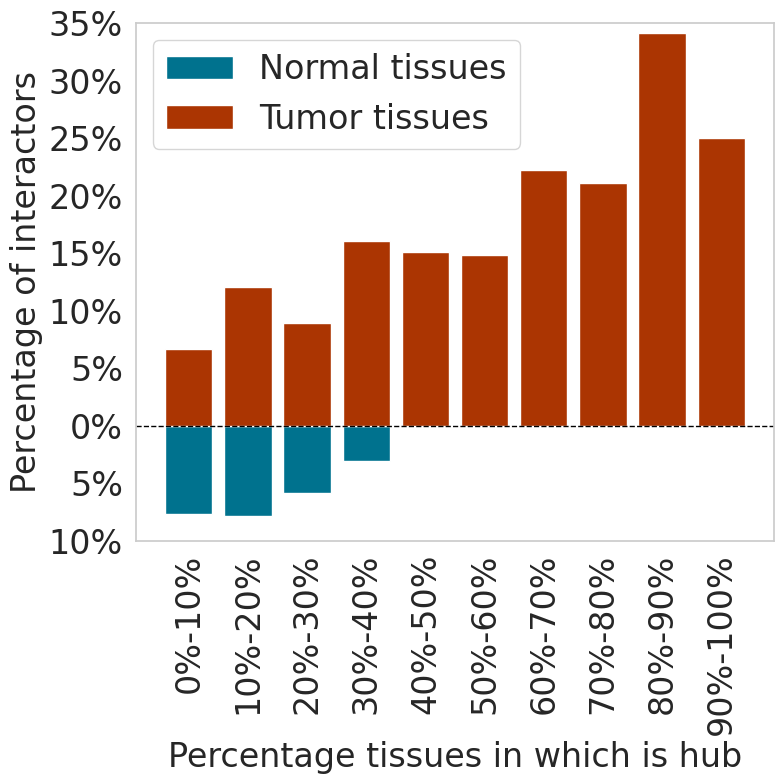

In [132]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter, MultipleLocator

def plot_diverging_histogram(df, num_bins, ncolor, tcolor):
    fs = 24 # Font size
    
    # Define the bin edges
    bin_edges = [i * (1/num_bins) for i in range(num_bins + 1)]  # bins from 0 to 1 divided into num_bins

    # Create labels for the bins
    bin_labels = [f'{i:.0%}-{i + (1/num_bins):.0%}' for i in bin_edges[:-1]]

    # Cut the global_hub_tumor column into bins
    df['tumor_bin'] = pd.cut(df['global_hub_tumor'], bins=bin_edges, labels=bin_labels, right=False)

    # Cut the global_hub_normal column into bins
    df['normal_bin'] = pd.cut(df['global_hub_normal'], bins=bin_edges, labels=bin_labels, right=False)

    # Group by the tumor bins and calculate the fraction of interactors in each bin
    tumor_bin_stats = df.groupby('tumor_bin')['interactor'].mean()

    # Group by the normal bins and calculate the fraction of interactors in each bin
    normal_bin_stats = df.groupby('normal_bin')['interactor'].mean()

    # Fill in missing bins with 0 values
    tumor_bin_stats = tumor_bin_stats.reindex(bin_labels, fill_value=0)
    normal_bin_stats = normal_bin_stats.reindex(bin_labels, fill_value=0)

    # Create a diverging bar plot
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot for global_hub_normal (downwards)
    ax.bar(bin_labels, -normal_bin_stats, color=ncolor, label='Normal tissues')

    # Plot for global_hub_tumor (upwards)
    ax.bar(bin_labels, tumor_bin_stats, color=tcolor, label='Tumor tissues')

    # Add a horizontal line at y=0
    ax.axhline(0, color='black', linewidth=1, linestyle='--')

    ax.set_ylabel('Percentage of interactors', fontsize=fs)
    ax.set_xlabel('Percentage tissues in which is hub', fontsize=fs)
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1))
    ax.yaxis.set_major_locator(MultipleLocator(0.05))
    ax.set_ylim(-0.1, 0.35)  # Set y-axis limit
    ax.grid(False)
    ax.legend(fontsize=fs)

    # Rotate x-labels by 90 degrees
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=90, fontsize=fs)
    plt.setp(ax.yaxis.get_majorticklabels(), fontsize=fs)

    # Modify y-tick labels to be positive
    y_ticks = ax.get_yticks()
    ax.set_yticklabels([f'{abs(round(tick*100))}%' for tick in y_ticks])

    plt.tight_layout()

    plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/hubs/histogram_hubs.pdf')
    
    plt.show()

# Example usage
plot_diverging_histogram(df, num_bins=10, ncolor=ncolor, tcolor=tcolor)  # Change num_bins to the desired number of bins


# Compare

In [16]:
from scipy.stats import false_discovery_control
from scipy import stats

In [17]:
df = pd.read_csv('/home/lnemati/pathway_crosstalk/results/compare_results.csv', index_col=0)

In [18]:
df['interactions_ranksum_p_adj'] = stats.false_discovery_control(df['interactions_ranksum_p'], method='bh')

In [19]:
df.query('interactions_ranksum_p_adj > 0.05')

,condition,n_samples,n_genes,n_modules,avg_module_size,avg_degree,avg_intramodular_degree,tot_interactions,n_interactions_same_module,interactions_auroc,interactions_ranksum_U,interactions_ranksum_p,interactions_ranksum_p_adj
name,,,,,,,,,,,,,
whole_blood,normal,313,11273,11,1024.818182,1.235881,0.809675,591,210,0.492735,-0.646555,0.741040,0.741040
uveal_melanoma,tumor,76,12694,10,1269.400000,6.410942,5.217802,965,292,0.505755,0.633522,0.263197,0.266571


In [20]:
#auroc_a = df['interactions_auroc']
#auroc_t = df.query('condition == "tumor"')['interactions_auroc']
#auroc_n = df.query('condition == "normal"')['interactions_auroc']
#
#print(auroc_a.mean(), '+/-', sem(auroc_a))
#print(auroc_n.mean(), '+/-', sem(auroc_n))
#print(auroc_t.mean(), '+/-', sem(auroc_t))
#
#ua = df['interactions_ranksum_U']
#ut = df.query('condition == "tumor"')['interactions_ranksum_U']
#un = df.query('condition == "normal"')['interactions_ranksum_U']
#
#print(ua.mean(), '+/-', sem(ua))
#print(un.mean(), '+/-', sem(un))
#print(ut.mean(), '+/-', sem(ut))

In [21]:
df['-log10_ranksum_p_adj'] = -np.log10(df['interactions_ranksum_p_adj'])

In [22]:
df.drop(columns='interactions_ranksum_p', inplace=True)
df.drop(columns='interactions_ranksum_p_adj', inplace=True)

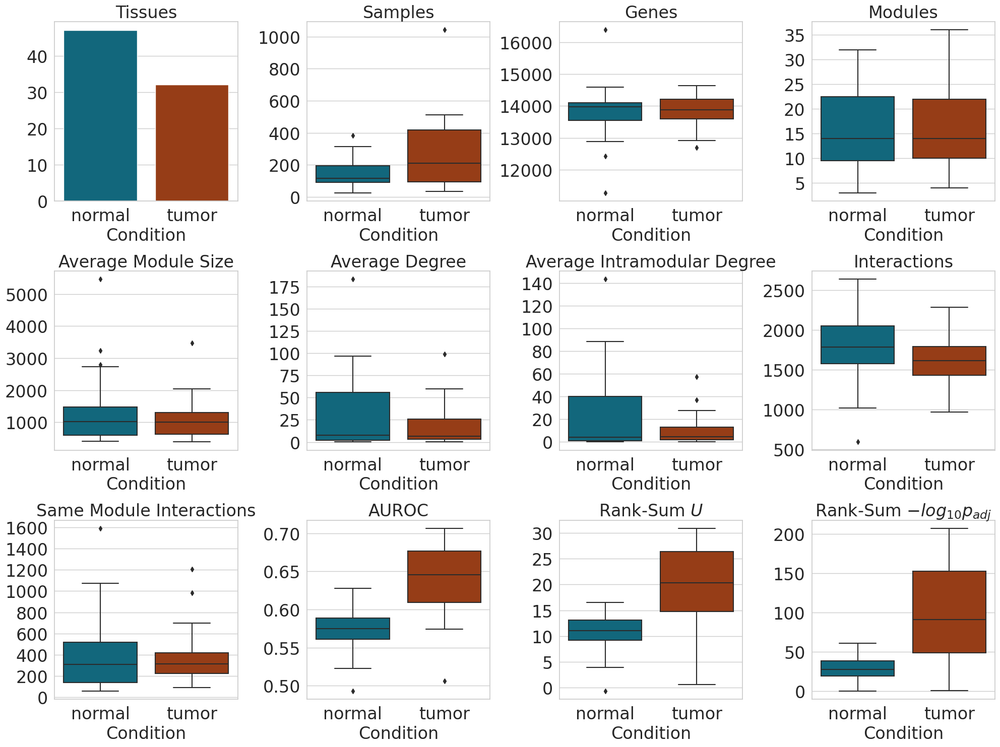

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
sns.set(style="whitegrid")

# Define font size
fs = 24

# Plot boxplots for each column
plt.figure(figsize=(20, 15))  # Adjusted figure size for better spacing

plt.subplot(3, 4, 1)
sns.countplot(x='condition', data=df, palette=[ncolor, tcolor])
plt.title('Tissues', fontsize=fs)
plt.xlabel('Condition', fontsize=fs)
plt.ylabel('', fontsize=fs)
plt.xticks(fontsize=fs)
plt.yticks(fontsize=fs)

# Title dictionary for subplots
title_dict = {
    'n_samples': 'Samples',
    'n_genes': 'Genes',
    'n_modules': 'Modules',
    'avg_module_size': 'Average Module Size',
    'avg_degree': 'Average Degree',
    'avg_intramodular_degree': 'Average Intramodular Degree',
    'tot_interactions': 'Interactions',
    'n_interactions_same_module': 'Same Module Interactions',
    'interactions_auroc': 'AUROC',
    'interactions_ranksum_U': 'Rank-Sum $U$',
    '-log10_ranksum_p_adj': 'Rank-Sum $-log_{10}{p_{adj}}$',
}

for i, column in enumerate(df.columns[1:]):  # Exclude 'condition' column
    plt.subplot(3, 4, i+2)
    sns.boxplot(x='condition', y=column, data=df, palette=[ncolor, tcolor])
    plt.title(title_dict[column], fontsize=fs)
    plt.xlabel('Condition', fontsize=fs)
    plt.ylabel('', fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_all.pdf')

# Show the plot
plt.show()


In [24]:
df[df['-log10_ranksum_p_adj'] < -np.log10(0.05)]

,condition,n_samples,n_genes,n_modules,avg_module_size,avg_degree,avg_intramodular_degree,tot_interactions,n_interactions_same_module,interactions_auroc,interactions_ranksum_U,-log10_ranksum_p_adj
name,,,,,,,,,,,,
whole_blood,normal,313,11273,11,1024.818182,1.235881,0.809675,591,210,0.492735,-0.646555,0.130158
uveal_melanoma,tumor,76,12694,10,1269.400000,6.410942,5.217802,965,292,0.505755,0.633522,0.574187


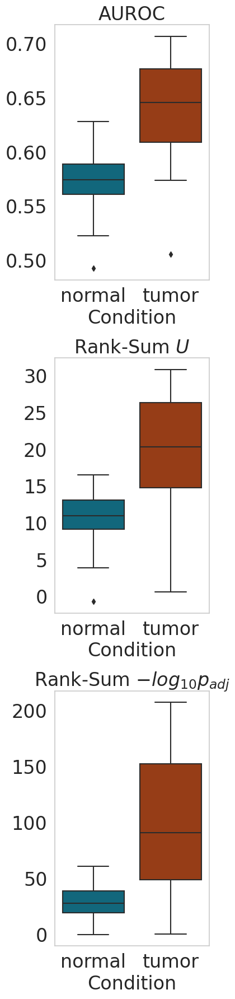

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
sns.set_style("whitegrid", {'axes.grid': False})

# Define font size
fs = 24

# Plot boxplots for each column
plt.figure(figsize=(4, 18))  # Adjust the figure size to accommodate smaller vertical subplots

title_dict = {
    'interactions_auroc': 'AUROC',
    'interactions_ranksum_U': 'Rank-Sum $U$',
    '-log10_ranksum_p_adj': 'Rank-Sum $-log_{10}{p_{adj}}$',
}

for i, column in enumerate(['interactions_auroc', 'interactions_ranksum_U', '-log10_ranksum_p_adj']):
    plt.subplot(3, 1, i + 1)  # Change the subplot to vertical arrangement
    sns.boxplot(x='condition', y=column, data=df, palette=[ncolor, tcolor])
    plt.title(title_dict[column], fontsize=fs)
    plt.xlabel('Condition', fontsize=fs)
    plt.ylabel('', fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_ranksums_auroc.pdf')

# Show the plot
plt.show()


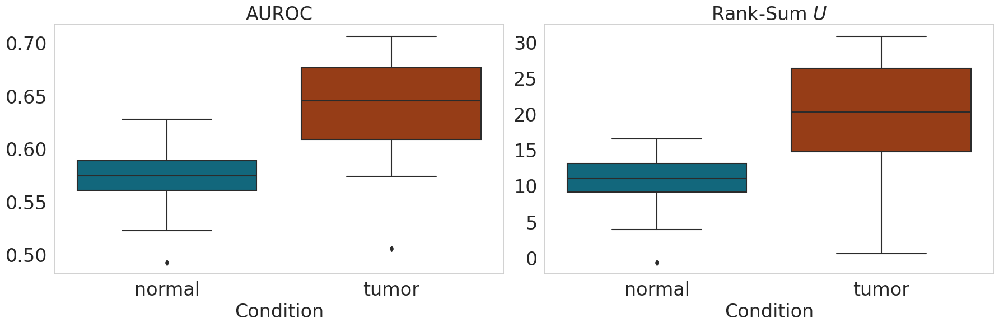

In [26]:
# Set the style
sns.set_style("whitegrid", {'axes.grid': False})

# Define font size
fs = 24

# Plot boxplots for each column
plt.figure(figsize=(18, 6))  # Adjust the figure size to accommodate horizontal subplots

title_dict = {
    'interactions_auroc': 'AUROC',
    'interactions_ranksum_U': 'Rank-Sum $U$',
    '-log10_ranksum_p_adj': 'Rank-Sum $-log_{10}{p_{adj}}$',
}

for i, column in enumerate(['interactions_auroc', 'interactions_ranksum_U']):
    plt.subplot(1, 2, i + 1)  # Change the subplot to horizontal arrangement
    sns.boxplot(x='condition', y=column, data=df, palette=[ncolor, tcolor])
    plt.title(title_dict[column], fontsize=fs)
    plt.xlabel('Condition', fontsize=fs)
    plt.ylabel('', fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_ranksums_auroc_horizontal.pdf')

# Show the plot
plt.show()


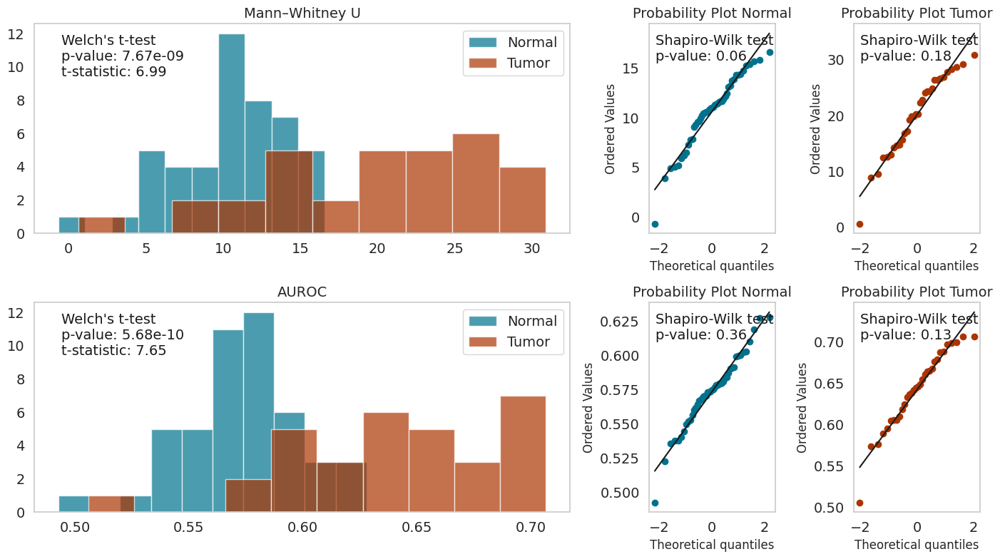

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

# Define font size
fs = 14

# Data Preparation
col_ranksum = 'interactions_ranksum_U'
col_auroc = 'interactions_auroc'

normal_data_ranksum = df.loc[df.condition == 'normal', col_ranksum]
tumor_data_ranksum = df.loc[df.condition == 'tumor', col_ranksum]

normal_data_auroc = df.loc[df.condition == 'normal', col_auroc]
tumor_data_auroc = df.loc[df.condition == 'tumor', col_auroc]

# Normality checks
_, p1_ranksum = stats.shapiro(normal_data_ranksum)
_, p2_ranksum = stats.shapiro(tumor_data_ranksum)

_, p1_auroc = stats.shapiro(normal_data_auroc)
_, p2_auroc = stats.shapiro(tumor_data_auroc)

# Perform Welch's t-test
t_statistic_ranksum, welch_p_value_ranksum = stats.ttest_ind(tumor_data_ranksum, normal_data_ranksum, equal_var=False, alternative='greater')
t_statistic_auroc, welch_p_value_auroc = stats.ttest_ind(tumor_data_auroc, normal_data_auroc, equal_var=False, alternative='greater')

# Homogeneity of variances (Levene's test)
_, levene_p_auroc = stats.levene(normal_data_auroc, tumor_data_auroc)

# Create the figure and the layout
fig = plt.figure(figsize=(14, 8))
axs = fig.subplot_mosaic(
    """
    AAABC
    DDDEF
    """
)

# Plot histograms for Ranksum U
axs['A'].hist(normal_data_ranksum, bins=10, alpha=0.7, color=ncolor, label='Normal')
axs['A'].hist(tumor_data_ranksum, bins=10, alpha=0.7, color=tcolor, label='Tumor')
axs['A'].set_title('Mann–Whitney U', fontsize=fs)
axs['A'].legend(fontsize=fs)
axs['A'].text(0.05, 0.95, f"Welch's t-test\np-value: {welch_p_value_ranksum:.2e}\nt-statistic: {t_statistic_ranksum:.2f}", ha='left', va='top', transform=axs['A'].transAxes, fontsize=fs, color='k')
axs['A'].tick_params(axis='both', labelsize=fs)

# Q-Q plots for Normal Ranksum U
stats.probplot(normal_data_ranksum, dist="norm", plot=axs['B'])
axs['B'].get_lines()[0].set_color(ncolor)
axs['B'].set_title('Probability Plot Normal', fontsize=fs)
axs['B'].get_lines()[1].set_color('k')
axs['B'].text(0.05, 0.95, f"Shapiro-Wilk test\np-value: {p1_ranksum:.2f}", ha='left', va='top', transform=axs['B'].transAxes, fontsize=fs, color='k')
axs['B'].tick_params(axis='both', labelsize=fs)

# Q-Q plots for Tumor Ranksum U
stats.probplot(tumor_data_ranksum, dist="norm", plot=axs['C'])
axs['C'].set_title('Probability Plot Tumor', fontsize=fs)
axs['C'].get_lines()[0].set_color(tcolor)
axs['C'].get_lines()[1].set_color('k')
axs['C'].text(0.05, 0.95, f"Shapiro-Wilk test\np-value: {p2_ranksum:.2f}", ha='left', va='top', transform=axs['C'].transAxes, fontsize=fs, color='k')
axs['C'].tick_params(axis='both', labelsize=fs)

# Plot histograms for AUROC
axs['D'].hist(normal_data_auroc, bins=10, alpha=0.7, color=ncolor, label='Normal')
axs['D'].hist(tumor_data_auroc, bins=10, alpha=0.7, color=tcolor, label='Tumor')
axs['D'].set_title('AUROC', fontsize=fs)
axs['D'].legend(fontsize=fs)
axs['D'].text(0.05, 0.95, f"Welch's t-test\np-value: {welch_p_value_auroc:.2e}\nt-statistic: {t_statistic_auroc:.2f}", ha='left', va='top', transform=axs['D'].transAxes, fontsize=fs, color='k')
axs['D'].tick_params(axis='both', labelsize=fs)

# Q-Q plots for Normal AUROC
stats.probplot(normal_data_auroc, dist="norm", plot=axs['E'])
axs['E'].get_lines()[0].set_color(ncolor)
axs['E'].set_title('Probability Plot Normal', fontsize=fs)
axs['E'].get_lines()[1].set_color('k')
axs['E'].text(0.05, 0.95, f"Shapiro-Wilk test\np-value: {p1_auroc:.2f}", ha='left', va='top', transform=axs['E'].transAxes, fontsize=fs, color='k')
axs['E'].tick_params(axis='both', labelsize=fs)

# Q-Q plots for Tumor AUROC
stats.probplot(tumor_data_auroc, dist="norm", plot=axs['F'])
axs['F'].set_title('Probability Plot Tumor', fontsize=fs)
axs['F'].get_lines()[0].set_color(tcolor)
axs['F'].get_lines()[1].set_color('k')
axs['F'].text(0.05, 0.95, f"Shapiro-Wilk test\np-value: {p2_auroc:.2f}", ha='left', va='top', transform=axs['F'].transAxes, fontsize=fs, color='k')
axs['F'].tick_params(axis='both', labelsize=fs)

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_tumor_vs_normal.pdf')

# Show the plot
plt.show()


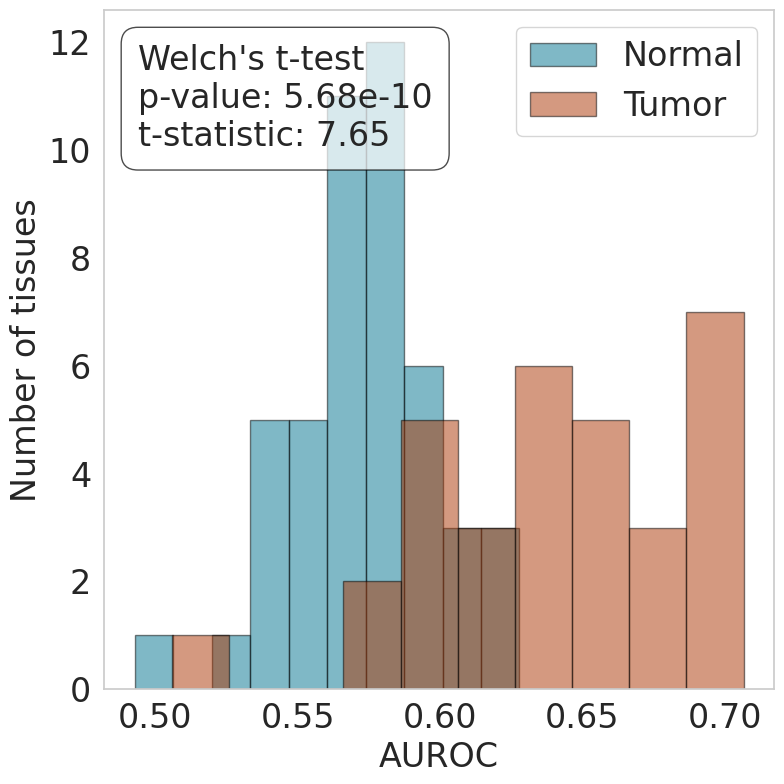

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

# Define font size
fs = 24

# Data Preparation for AUROC
col = 'interactions_auroc'
normal_data = df.loc[df.condition == 'normal', col]
tumor_data = df.loc[df.condition == 'tumor', col]

# Normality checks
_, p1 = stats.shapiro(normal_data)
_, p2 = stats.shapiro(tumor_data)

# Perform Welch's t-test
t_statistic, welch_p_value = stats.ttest_ind(tumor_data, normal_data, equal_var=False, alternative='greater')

# Homogeneity of variances (Levene's test)
_, levene_p = stats.levene(normal_data, tumor_data)

# Create the figure
fig, ax = plt.subplots(figsize=(8, 8))

# Plot histograms for AUROC with outlines
ax.hist(normal_data, bins=10, alpha=0.5, color=ncolor, edgecolor='black', label='Normal')
ax.hist(tumor_data, bins=10, alpha=0.5, color=tcolor, edgecolor='black', label='Tumor')
ax.set_xlabel('AUROC', fontsize=fs)
ax.set_ylabel('Number of tissues', fontsize=fs)
ax.legend(fontsize=fs)
ax.tick_params(axis='both', labelsize=fs)

# Add text box for Welch's t-test results with transparency
textstr = f"Welch's t-test\np-value: {welch_p_value:.2e}\nt-statistic: {t_statistic:.2f}"
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black', alpha=0.7)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=fs, verticalalignment='top', bbox=props)

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_auroc_histogram.pdf')

# Show the plot
plt.show()


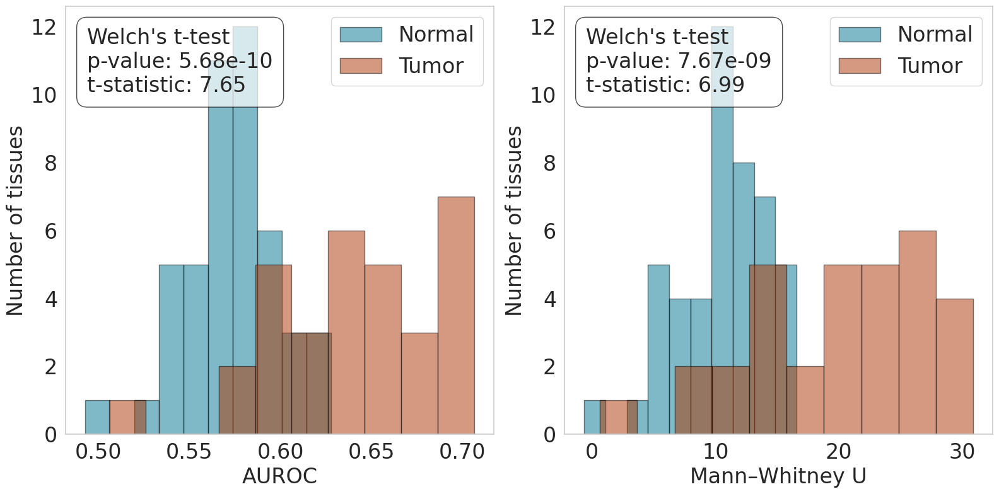

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

def plot_side_by_side_histograms(df, column1, column2, condition_col='condition', condition1='normal', condition2='tumor', 
                                 xlabel1='AUROC', xlabel2='Mann–Whitney U', ylabel='Number of tissues', fs=24, ncolor='blue', tcolor='red', 
                                 output_path=None):
    # Data Preparation
    normal_data1 = df.loc[df[condition_col] == condition1, column1]
    tumor_data1 = df.loc[df[condition_col] == condition2, column1]
    normal_data2 = df.loc[df[condition_col] == condition1, column2]
    tumor_data2 = df.loc[df[condition_col] == condition2, column2]

    # Perform Welch's t-test for both columns
    t_statistic1, welch_p_value1 = stats.ttest_ind(tumor_data1, normal_data1, equal_var=False, alternative='greater')
    t_statistic2, welch_p_value2 = stats.ttest_ind(tumor_data2, normal_data2, equal_var=False, alternative='greater')

    # Homogeneity of variances (Levene's test) for both columns
    _, levene_p1 = stats.levene(normal_data1, tumor_data1)
    _, levene_p2 = stats.levene(normal_data2, tumor_data2)

    # Create the figure
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    # Plot histograms for the first column
    ax1.hist(normal_data1, bins=10, alpha=0.5, color=ncolor, edgecolor='black', label=condition1.capitalize())
    ax1.hist(tumor_data1, bins=10, alpha=0.5, color=tcolor, edgecolor='black', label=condition2.capitalize())
    ax1.set_xlabel(xlabel1, fontsize=fs)
    ax1.set_ylabel(ylabel, fontsize=fs)
    ax1.legend(fontsize=fs)
    ax1.tick_params(axis='both', labelsize=fs)

    # Add text box for Welch's t-test results with transparency
    textstr1 = f"Welch's t-test\np-value: {welch_p_value1:.2e}\nt-statistic: {t_statistic1:.2f}"
    props1 = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black', alpha=0.7)
    ax1.text(0.05, 0.95, textstr1, transform=ax1.transAxes, fontsize=fs, verticalalignment='top', bbox=props1)

    # Plot histograms for the second column
    ax2.hist(normal_data2, bins=10, alpha=0.5, color=ncolor, edgecolor='black', label=condition1.capitalize())
    ax2.hist(tumor_data2, bins=10, alpha=0.5, color=tcolor, edgecolor='black', label=condition2.capitalize())
    ax2.set_xlabel(xlabel2, fontsize=fs)
    ax2.set_ylabel(ylabel, fontsize=fs)
    ax2.legend(fontsize=fs)
    ax2.tick_params(axis='both', labelsize=fs)

    # Add text box for Welch's t-test results with transparency
    textstr2 = f"Welch's t-test\np-value: {welch_p_value2:.2e}\nt-statistic: {t_statistic2:.2f}"
    props2 = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black', alpha=0.7)
    ax2.text(0.05, 0.95, textstr2, transform=ax2.transAxes, fontsize=fs, verticalalignment='top', bbox=props2)

    plt.tight_layout()

    # Save the figure
    if not outputpath is None:
        plt.savefig(output_path)

    # Show the plot
    plt.show()

# Example usage:
plot_side_by_side_histograms(
    df,
    'interactions_auroc',
    'interactions_ranksum_U',
    condition1='normal',
    condition2='tumor',
    xlabel1='AUROC',
    xlabel2='Mann–Whitney U',
    ylabel='Number of tissues',
    ncolor=ncolor,
    tcolor=tcolor,
    output_path='/home/lnemati/pathway_crosstalk/results/figures/comparison/side_by_side_histogram_plot.pdf'
)


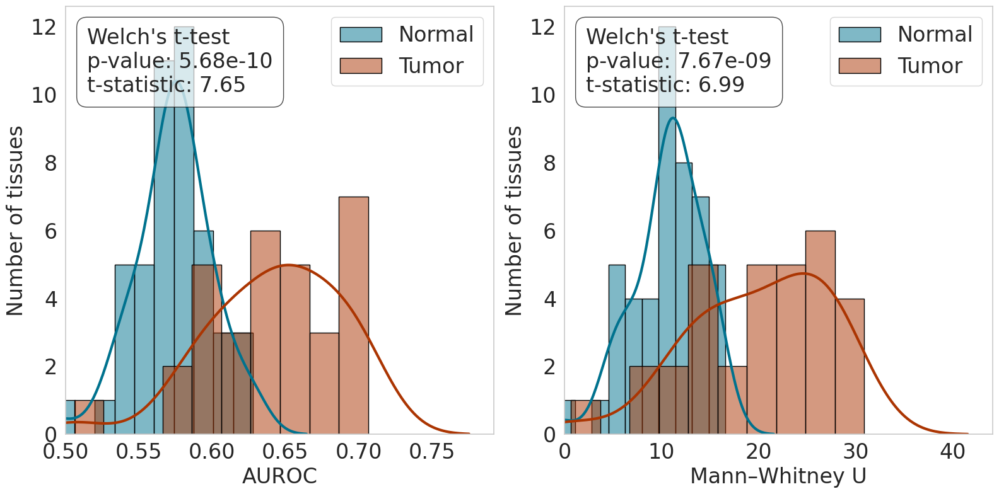

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns

def plot_side_by_side_histograms(df, column1, column2, condition_col='condition', condition1='normal', condition2='tumor', nbins=10, 
                                 xlabel1='AUROC', xlabel2='Mann–Whitney U', ylabel='Number of tissues', fs=24, ncolor='blue', tcolor='red', 
                                 output_path='side_by_side_histogram_plot.pdf'):
    # Data Preparation
    normal_data1 = df.loc[df[condition_col] == condition1, column1]
    tumor_data1 = df.loc[df[condition_col] == condition2, column1]
    normal_data2 = df.loc[df[condition_col] == condition1, column2]
    tumor_data2 = df.loc[df[condition_col] == condition2, column2]

    # Perform Welch's t-test for both columns
    t_statistic1, welch_p_value1 = stats.ttest_ind(tumor_data1, normal_data1, equal_var=False, alternative='greater')
    t_statistic2, welch_p_value2 = stats.ttest_ind(tumor_data2, normal_data2, equal_var=False, alternative='greater')

    # Create the figure
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    lw = 3
    cut = 3
    alpha=0.5
    
    # Plot histograms and KDEs for the first column
    sns.histplot(
        normal_data1,
        bins=nbins,
        kde=True,
        color=ncolor,
        edgecolor='black',
        label=condition1.capitalize(),
        alpha=alpha,
        kde_kws={'cut': cut},
        line_kws={'linewidth': lw, 'color': ncolor},
        ax=ax1,
    )
    sns.histplot(
        tumor_data1,
        bins=nbins,
        kde=True,
        color=tcolor,
        edgecolor='black',
        label=condition2.capitalize(),
        alpha=alpha,
        kde_kws={'cut': cut},
        line_kws={'linewidth': lw, 'color': tcolor},
        ax=ax1,
    )
    ax1.set_xlabel(xlabel1, fontsize=fs)
    ax1.set_ylabel(ylabel, fontsize=fs)
    ax1.legend(fontsize=fs)
    ax1.tick_params(axis='both', labelsize=fs)
    ax1.set_xlim([0.5, ax1.get_xlim()[1]])

    # Add text box for Welch's t-test results with transparency
    textstr1 = f"Welch's t-test\np-value: {welch_p_value1:.2e}\nt-statistic: {t_statistic1:.2f}"
    props1 = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black', alpha=0.7)
    ax1.text(0.05, 0.95, textstr1, transform=ax1.transAxes, fontsize=fs, verticalalignment='top', bbox=props1)

    # Plot histograms and KDEs for the second column
    sns.histplot(
        normal_data2,
        bins=nbins,
        kde=True,
        color=ncolor,
        edgecolor='black',
        label=condition1.capitalize(),
        alpha=alpha,
        kde_kws={'cut': cut},
        line_kws={'linewidth': lw, 'color': ncolor},
        ax=ax2
    )
    sns.histplot(
        tumor_data2,
        bins=nbins,
        kde=True,
        color=tcolor,
        edgecolor='black',
        label=condition2.capitalize(),
        alpha=alpha,
        kde_kws={'cut': cut},
        line_kws={'linewidth': lw, 'color': tcolor},
        ax=ax2
    )
    ax2.set_xlabel(xlabel2, fontsize=fs)
    ax2.set_ylabel(ylabel, fontsize=fs)
    ax2.legend(fontsize=fs)
    ax2.tick_params(axis='both', labelsize=fs)
    ax2.set_xlim([0., ax2.get_xlim()[1]])


    # Add text box for Welch's t-test results with transparency
    textstr2 = f"Welch's t-test\np-value: {welch_p_value2:.2e}\nt-statistic: {t_statistic2:.2f}"
    props2 = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black', alpha=0.7)
    ax2.text(0.05, 0.95, textstr2, transform=ax2.transAxes, fontsize=fs, verticalalignment='top', bbox=props2)

    plt.tight_layout()

    # Save the figure
    plt.savefig(output_path)

    # Show the plot
    plt.show()

# Example usage:
plot_side_by_side_histograms(
    df,
    'interactions_auroc',
    'interactions_ranksum_U',
    condition1='normal',
    condition2='tumor',
    nbins=10,
    xlabel1='AUROC',
    xlabel2='Mann–Whitney U',
    ylabel='Number of tissues',
    ncolor=ncolor,
    tcolor=tcolor,
    output_path='/home/lnemati/pathway_crosstalk/results/figures/comparison/side_by_side_histogram_plot.pdf'
)

# Interactions Network

In [76]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/interactions_network/interactions_network_filtered.csv')

In [77]:
network['normal_j'] = network['normal_intersection'] / network['normal_union']
network['tumor_j'] = network['tumor_intersection'] / network['tumor_union']

In [78]:
network['-tumor_intersection'] = -network['tumor_intersection']
network['-normal_intersection'] = -network['normal_intersection']

network['-tumor_j'] = -network['tumor_j']
network['-normal_j'] = -network['normal_j']

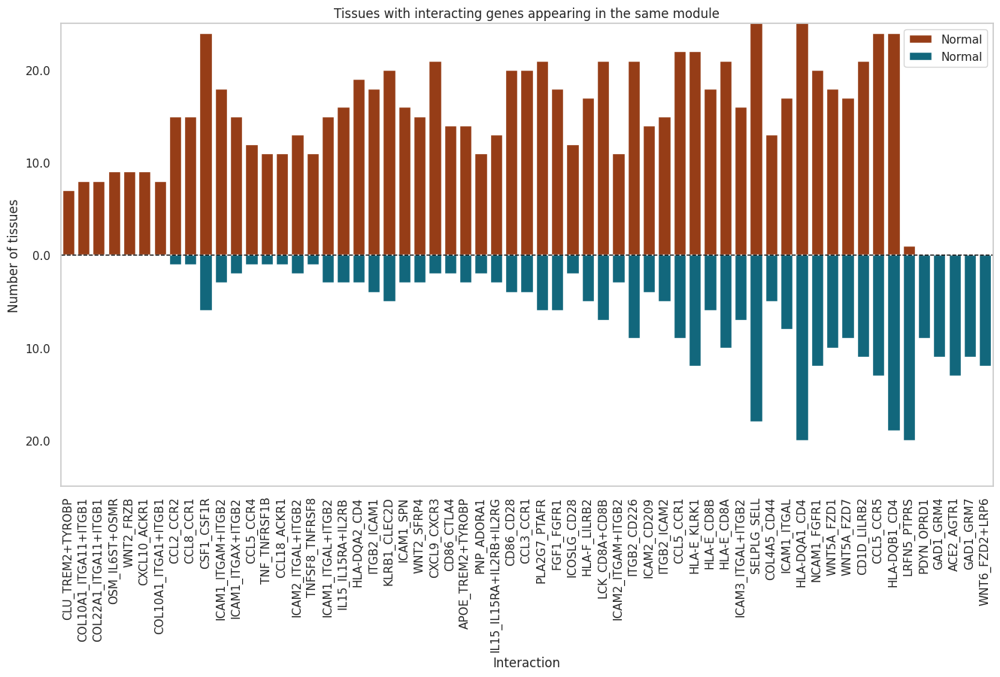

In [88]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

sns.barplot(ax=ax, x='interaction', y='tumor_intersection', data=network, color=tcolor, alpha=1, label='Normal')
sns.barplot(ax=ax, x='interaction', y='-normal_intersection', data=network, color=ncolor, alpha=1, label='Normal')

ax.axhline(0, color='black', linewidth=1, linestyle='--')

# Adding labels and title for subplot 2
ax.set_xlabel('Interaction')
ax.set_ylabel('')
ax.set_title('Tissues with interacting genes appearing in the same module')
ax.set_ylim(-25, 25)
ax.set_ylabel('Number of tissues')
ax.legend()
ax.tick_params(axis='x', rotation=90)

# Change negative y-axis ticks to positive and display only the first decimal place
ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

plt.show()

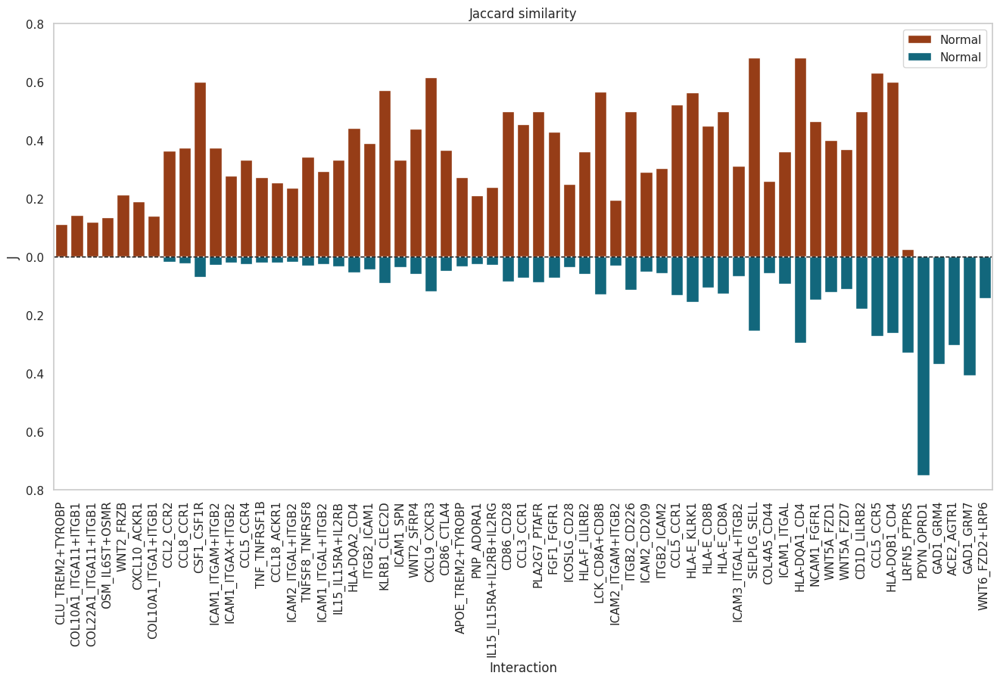

In [95]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

sns.barplot(ax=ax, x='interaction', y='tumor_j', data=network, color=tcolor, alpha=1, label='Normal')
sns.barplot(ax=ax, x='interaction', y='-normal_j', data=network, color=ncolor, alpha=1, label='Normal')

ax.axhline(0, color='black', linewidth=1, linestyle='--')

# Adding labels and title for subplot 2
ax.set_xlabel('Interaction')
ax.set_ylabel('J')
ax.set_title('Jaccard similarity')
ax.set_ylim(-0.8, 0.8)
ax.legend()
ax.tick_params(axis='x', rotation=90)

# Change negative y-axis ticks to positive and display only the first decimal place
ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

# Plot for df1
sns.barplot(ax=axes[0], x='interaction', y='j_modules_tumor', data=df1, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[0], x='interaction', y='j_modules_normal', data=df1, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 1
axes[0].set_xlabel('Interaction')
axes[0].set_ylabel('Jaccard Similarity')
axes[0].set_title('Top Coexpressed in Tumor')
axes[0].set_ylim(-0.8, 0.8)
axes[0].legend()
axes[0].tick_params(axis='x', rotation=90)

# Plot for df2
sns.barplot(ax=axes[1], x='interaction', y='j_modules_tumor', data=df2, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[1], x='interaction', y='j_modules_normal', data=df2, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 2
axes[1].set_xlabel('Interaction')
axes[1].set_ylabel('')
axes[1].set_title('Top Coexpressed in Normal')
axes[1].set_ylim(-0.8, 0.8)
axes[1].legend()
axes[1].tick_params(axis='x', rotation=90)

# Remove padding between subplots
fig.subplots_adjust(wspace=0.0, hspace=0)

# Change negative y-axis ticks to positive and display only the first decimal place
for ax in axes:
    ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

# Show plot
plt.show()


In [47]:
network.head()

,interaction,num_interactors_a,num_interactors_b,interactor1,interactor2,interactor3,interactor4,interactor5,interactor6,interactor7,log2_odds_ratio,pval,tumor_intersection,normal_intersection,tumor_union,normal_union,keep,pval_adj
0,CLU_TREM2+TYROBP,1,2,CLU,TREM2,TYROBP,NaN,NaN,NaN,NaN,inf,0.000965,7,0,62,100,1,0.036476
1,COL10A1_ITGA11+ITGB1,1,2,COL10A1,ITGA11,ITGB1,NaN,NaN,NaN,NaN,inf,0.000423,8,0,56,86,1,0.020792
2,COL22A1_ITGA11+ITGB1,1,2,COL22A1,ITGA11,ITGB1,NaN,NaN,NaN,NaN,inf,0.000454,8,0,66,101,1,0.021752
3,OSM_IL6ST+OSMR,1,2,OSM,IL6ST,OSMR,NaN,NaN,NaN,NaN,inf,0.000293,9,0,66,91,1,0.017331
4,WNT2_FRZB,1,1,WNT2,FRZB,NaN,NaN,NaN,NaN,NaN,inf,0.000258,9,0,42,57,1,0.015767


In [8]:
n = 30

df1 = network.head(n)
df2 = network.tail(n)
df1['modules_tumor'] = -df1['j_modules_tumor']
df2['j_modules_tumor'] = -df2['j_modules_tumor']

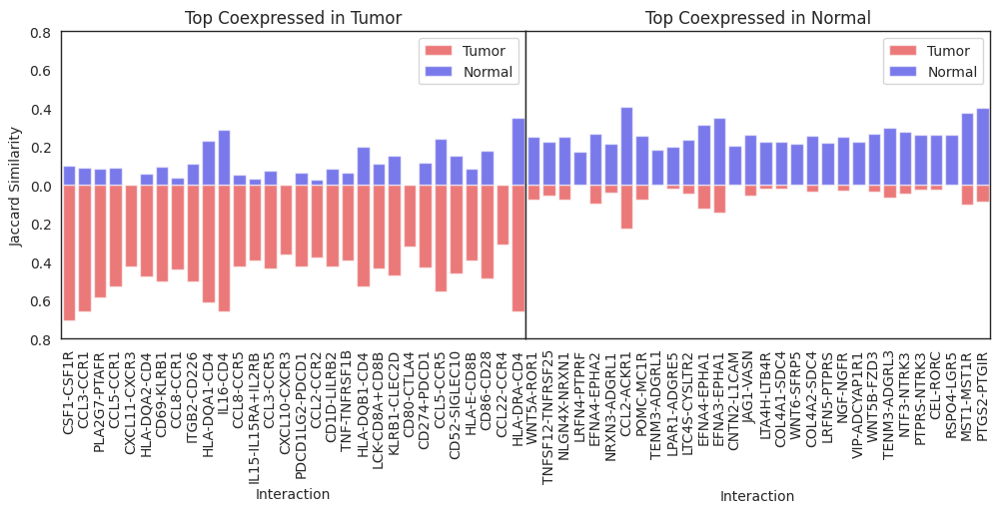

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

# Plot for df1
sns.barplot(ax=axes[0], x='interaction', y='j_modules_tumor', data=df1, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[0], x='interaction', y='j_modules_normal', data=df1, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 1
axes[0].set_xlabel('Interaction')
axes[0].set_ylabel('Jaccard Similarity')
axes[0].set_title('Top Coexpressed in Tumor')
axes[0].set_ylim(-0.8, 0.8)
axes[0].legend()
axes[0].tick_params(axis='x', rotation=90)

# Plot for df2
sns.barplot(ax=axes[1], x='interaction', y='j_modules_tumor', data=df2, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[1], x='interaction', y='j_modules_normal', data=df2, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 2
axes[1].set_xlabel('Interaction')
axes[1].set_ylabel('')
axes[1].set_title('Top Coexpressed in Normal')
axes[1].set_ylim(-0.8, 0.8)
axes[1].legend()
axes[1].tick_params(axis='x', rotation=90)

# Remove padding between subplots
fig.subplots_adjust(wspace=0.0, hspace=0)

# Change negative y-axis ticks to positive and display only the first decimal place
for ax in axes:
    ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

# Show plot
plt.show()


In [2]:
t_same = pd.read_csv('/home/lnemati/pathway_crosstalk/results/t_same_n_diff.csv')
n_same = pd.read_csv('/home/lnemati/pathway_crosstalk/results/n_same_t_diff.csv')

In [8]:
t = t_same.set_index('interaction')['total']
n = n_same.set_index('interaction')['total']

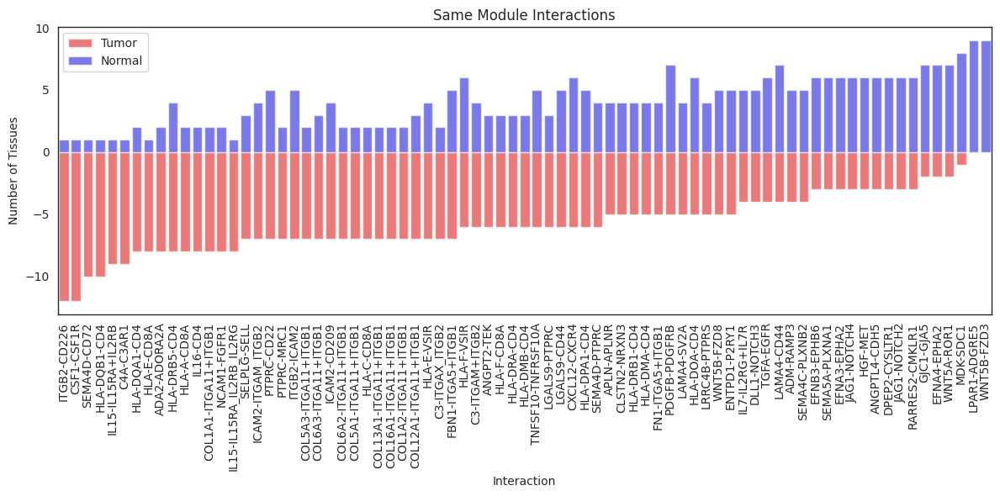

In [48]:
# Concatenate the series into a DataFrame
df = pd.concat([t, n], axis=1)
df.columns = ['t', 'n']

df['sum'] = df['t'] + df['n']
df = df[(df['sum'] >= 9)]
#df.sort_values(by=['sum', 't'], ascending=[False, False], inplace=True)
df.sort_values(by='t', ascending=False, inplace=True)
df['t'] = -df['t']

# Reset index to make 'interaction' a regular column
df.reset_index(inplace=True)

# Plotting parameters
plt.figure(figsize=(12, 6))

# Create the diverging bar plot using seaborn, with x and y switched
sns.barplot(x='interaction', y='t', data=df, color='red', alpha=0.6, label='Tumor')
sns.barplot(x='interaction', y='n', data=df, color='blue', alpha=0.6, label='Normal')

# Adding labels and title
plt.xlabel('Interaction')
plt.ylabel('Number of Tissues')
plt.title('Same Module Interactions')

# Adding legend
plt.legend()

# Rotate the labels on the x-axis
plt.xticks(rotation=90)

plt.tight_layout()

# Show plot
plt.show()


# Pathway Network

In [3]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_filtered.csv')
all_pathways = list(set(network['pathway1']).union(set(network['pathway2'])))

In [4]:
network.head()

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,inf,0.005746,0.000000,15,0,28,13
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856,0.000710,0.095238,19,1,23,11
2,RUNX1 and FOXP3 control the development of reg...,Interleukin receptor SHC signaling,4.321928,0.006920,0.057143,20,1,30,11
3,RUNX1 and FOXP3 control the development of reg...,Interleukin-15 signaling,3.797956,0.029849,0.000000,17,1,28,10
4,Interleukin-15 signaling,Interleukin receptor SHC signaling,3.767554,0.002717,0.242424,22,3,29,16


In [5]:
# Replace 'inf' values with the maximum value
max_value = network.log2_odds_ratio.replace([float('inf'), float('-inf')], float('nan')).max().max()
min_value = network.log2_odds_ratio.replace([float('inf'), float('-inf')], float('nan')).min().min()

network['log2_odds_ratio'] = network['log2_odds_ratio'].replace(float('inf'), max_value)
network['log2_odds_ratio'] = network['log2_odds_ratio'].replace(float('-inf'), min_value)

In [252]:
network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_no_inf.csv')

In [6]:
roots = pd.read_csv('/home/lnemati/resources/reactome/ReactomeRootPathways.csv')
roots.set_index('pathway', inplace=True)

In [7]:
# Get id-name mapping
ids = pd.read_csv('/home/lnemati/resources/reactome/ReactomeIDs.tsv', sep='\t', names=['name', 'id'])
ids2names = ids.set_index('id')
names2ids = ids.set_index('name')

In [8]:
# Subset
ids = names2ids.loc[all_pathways, 'id'].values
roots = roots.loc[ids]

In [9]:
names = ids2names.loc[roots['root']].name
roots['root'] = names.values

In [10]:
names = ids2names.loc[roots.index].name
roots.index = names.values

In [11]:
roots.loc[network.pathway1]['root']

TNF receptor superfamily (TNFSF) members mediating non-canonical NF-kB pathway                        Immune System
TNFs bind their physiological receptors                                                               Immune System
RUNX1 and FOXP3 control the development of regulatory T lymphocytes (Tregs)         Gene expression (Transcription)
RUNX1 and FOXP3 control the development of regulatory T lymphocytes (Tregs)         Gene expression (Transcription)
Interleukin-15 signaling                                                                              Immune System
                                                                                                ...                
HSF1 activation                                                                       Cellular responses to stimuli
HSF1 activation                                                                       Cellular responses to stimuli
Purinergic signaling in leishmaniasis infection                         

In [12]:
roots.root.value_counts()

Immune System                           35
Disease                                 30
Signal Transduction                     24
Metabolism of proteins                  15
Developmental Biology                   15
Extracellular matrix organization       10
Metabolism                               8
Vesicle-mediated transport               7
Neuronal System                          7
Hemostasis                               7
Gene expression (Transcription)          7
Cellular responses to stimuli            4
Muscle contraction                       1
Cell-Cell communication                  1
Circadian Clock                          1
Organelle biogenesis and maintenance     1
Name: root, dtype: int64

In [13]:
multiple_roots = roots.index.value_counts()[roots.index.value_counts() > 1].index
roots.loc[multiple_roots, 'root'] = 'Multiple root pathways'

In [14]:
roots.loc[network.pathway1]['root'].values.shape

(788,)

In [15]:
for idx, row in network.iterrows():
    if roots.loc[row.pathway1].shape[0] == 1:
        network.at[idx, 'root1'] = roots.loc[row.pathway1]['root']
    else:
        network.at[idx, 'root1'] = 'Multiple roots'
        
    if roots.loc[row.pathway2].shape[0] == 1:
        network.at[idx, 'root2'] = roots.loc[row.pathway2]['root']
    else:
        network.at[idx, 'root2'] = 'Multiple roots'

network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_no_inf.csv', index=False)

In [16]:
roots.index.name = 'pathway'
network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_no_inf.csv', index=False)

In [17]:
roots = roots.reset_index().drop_duplicates().set_index('pathway')
roots.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_roots.csv')

In [18]:
network['root2'].unique()

array(['Developmental Biology', 'Immune System', 'Signal Transduction',
       'Extracellular matrix organization', 'Metabolism of proteins',
       'Hemostasis', 'Disease', 'Metabolism',
       'Gene expression (Transcription)', 'Circadian Clock',
       'Multiple roots', 'Cellular responses to stimuli',
       'Vesicle-mediated transport', 'Neuronal System',
       'Organelle biogenesis and maintenance'], dtype=object)

<Axes: >

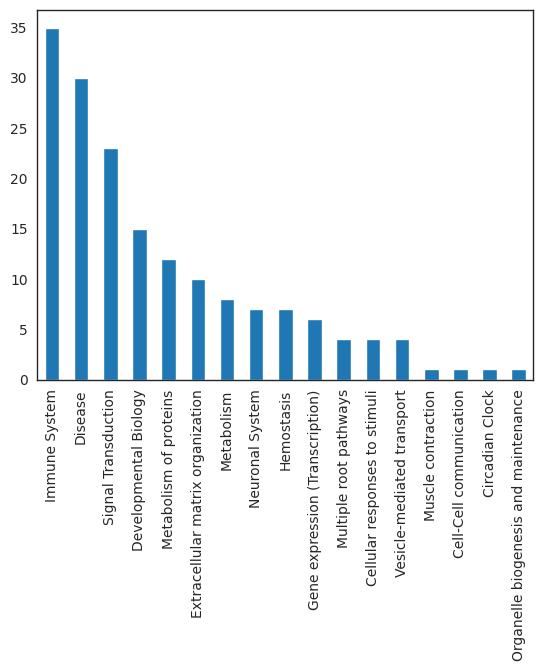

In [19]:
roots['root'].value_counts().plot(kind='bar')

In [20]:
subset = roots[roots['root'] == 'Neuronal System']
subset

,root
pathway,
Long-term potentiation,Neuronal System
"Unblocking of NMDA receptors, glutamate binding and activation",Neuronal System
Negative regulation of NMDA receptor-mediated neuronal transmission,Neuronal System
Acetylcholine Neurotransmitter Release Cycle,Neuronal System
Assembly and cell surface presentation of NMDA receptors,Neuronal System
Dopamine Neurotransmitter Release Cycle,Neuronal System
Neurexins and neuroligins,Neuronal System


In [21]:
roots.loc['COPII-mediated vesicle transport']

root    Multiple root pathways
Name: COPII-mediated vesicle transport, dtype: object

In [22]:
roots.loc['Generation of second messenger molecules']

root    Immune System
Name: Generation of second messenger molecules, dtype: object

In [23]:
pw = 'Molecules associated with elastic fibres'
network[(network.pathway1 == pw) | (network.pathway2 == pw)]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union,root1,root2
26,Molecules associated with elastic fibres,GPVI-mediated activation cascade,-2.104337,3.338581e-02,0.000000,10,11,53,22,Extracellular matrix organization,Hemostasis
83,Molecules associated with elastic fibres,Interleukin-4 and Interleukin-13 signaling,-2.513728,3.989666e-03,0.020548,16,17,59,25,Extracellular matrix organization,Immune System
84,Regulation of Complement cascade,Molecules associated with elastic fibres,-2.515174,6.481228e-03,0.006098,12,14,61,24,Immune System,Extracellular matrix organization
93,MyD88 deficiency (TLR2/4),Molecules associated with elastic fibres,-2.584963,7.819658e-03,0.000000,8,12,52,23,Disease,Extracellular matrix organization
96,Molecules associated with elastic fibres,Immunoregulatory interactions between a Lympho...,-2.612443,3.975008e-03,0.003861,13,15,66,25,Extracellular matrix organization,Immune System
144,Molecules associated with elastic fibres,Cross-presentation of particulate exogenous an...,-2.893085,5.132524e-03,0.046512,7,12,46,21,Extracellular matrix organization,Immune System
167,RAC1 GTPase cycle,Molecules associated with elastic fibres,-3.004446,1.550336e-03,0.004545,9,13,59,22,Signal Transduction,Extracellular matrix organization
178,Other interleukin signaling,Molecules associated with elastic fibres,-3.104337,3.323185e-02,0.000000,2,6,45,21,Immune System,Extracellular matrix organization
197,Neutrophil degranulation,Molecules associated with elastic fibres,-3.228624,1.961075e-04,0.001946,11,16,69,25,Immune System,Extracellular matrix organization
202,Molecules associated with elastic fibres,IRAK4 deficiency (TLR2/4),-3.232661,1.435879e-03,0.000000,6,12,53,22,Extracellular matrix organization,Disease


In [24]:
pw = 'TNF receptor superfamily (TNFSF) members mediating non-canonical NF-kB pathway'
network[(network.pathway1 == pw) | (network.pathway2 == pw)]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union,root1,root2
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,5.569856,0.005746,0.000000,15,0,28,13,Immune System,Developmental Biology
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856,0.000710,0.095238,19,1,23,11,Immune System,Immune System


In [25]:
pw = 'Other semaphorin interactions'
network[(network.pathway1 == pw) | (network.pathway2 == pw)]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union,root1,root2
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,5.569856,0.005746,0.000000,15,0,28,13,Immune System,Developmental Biology
45,Other semaphorin interactions,Collagen chain trimerization,-2.263034,0.048000,0.000000,7,7,55,17,Developmental Biology,Extracellular matrix organization
303,Regulation of expression of SLITs and ROBOs,Other semaphorin interactions,-3.967820,0.003141,0.000000,2,7,78,24,Developmental Biology,Developmental Biology
304,Other semaphorin interactions,Cargo concentration in the ER,-3.974005,0.036986,0.000000,1,5,23,12,Developmental Biology,Multiple roots
329,Other semaphorin interactions,Neurophilin interactions with VEGF and VEGFR,-4.129283,0.014875,0.000000,2,5,30,9,Developmental Biology,Signal Transduction
358,Other semaphorin interactions,Modulation by Mtb of host immune system,-4.380822,0.019859,0.000000,1,5,26,11,Developmental Biology,Disease
379,RHO GTPases Activate Formins,Other semaphorin interactions,-4.515700,0.002158,0.006369,2,6,63,14,Signal Transduction,Developmental Biology
506,Other semaphorin interactions,Attenuation phase,-8.240314,0.011708,0.000000,0,6,24,17,Developmental Biology,Cellular responses to stimuli
567,Other semaphorin interactions,COPII-mediated vesicle transport,-8.240314,0.022860,0.000000,0,6,23,20,Developmental Biology,Multiple roots
715,Other semaphorin interactions,HSF1 activation,-8.240314,0.008341,0.000000,0,6,25,16,Developmental Biology,Cellular responses to stimuli


In [26]:
edgelist = network[['pathway1', 'pathway2', 'log2_odds_ratio']]
edgelist

,pathway1,pathway2,log2_odds_ratio
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,5.569856
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856
2,RUNX1 and FOXP3 control the development of reg...,Interleukin receptor SHC signaling,4.321928
3,RUNX1 and FOXP3 control the development of reg...,Interleukin-15 signaling,3.797956
4,Interleukin-15 signaling,Interleukin receptor SHC signaling,3.767554
...,...,...,...
780,HSF1 activation,Defective B3GALT6 causes EDSP2 and SEMDJL1,-8.240314
781,HSF1 activation,Defective B3GAT3 causes JDSSDHD,-8.240314
782,Purinergic signaling in leishmaniasis infection,Attenuation phase,-8.240314
783,Signaling by FGFR2 IIIa TM,Cross-presentation of particulate exogenous an...,-8.240314


In [27]:
# Gather all unique pathway names
all_pathways = list(set(edgelist['pathway1']).union(set(edgelist['pathway2'])))

# Create an empty DataFrame with pathways as both index and columns
adjacency_matrix = pd.DataFrame(0, index=all_pathways, columns=all_pathways)

# Iterate over each row in the DataFrame and update the adjacency matrix
for index, row in edgelist.iterrows():
    pathway1 = row['pathway1']
    pathway2 = row['pathway2']
    log2_odds_ratio = row['log2_odds_ratio']
    
    adjacency_matrix.loc[pathway1, pathway2] = log2_odds_ratio
    adjacency_matrix.loc[pathway2, pathway1] = log2_odds_ratio  # Assuming the graph is undirected
    
# Replace 'inf' values with 10 times the maximum value
max_value = adjacency_matrix.replace([float('inf'), float('-inf')], float('nan')).max().max()
adjacency_matrix = adjacency_matrix.replace(float('inf'), max_value)

# Replace '-inf' values with 10 times the minimum value
min_value = adjacency_matrix.replace([float('inf'), float('-inf')], float('nan')).min().min()
adjacency_matrix = adjacency_matrix.replace(float('-inf'), min_value)

In [51]:
degrees.value_counts()/adjacency_matrix.shape[0]

1     0.236686
2     0.106509
3     0.106509
4     0.076923
11    0.047337
7     0.047337
12    0.041420
8     0.035503
9     0.029586
5     0.029586
10    0.023669
16    0.017751
6     0.017751
28    0.011834
30    0.011834
25    0.011834
35    0.011834
15    0.011834
14    0.011834
21    0.011834
19    0.005917
18    0.005917
46    0.005917
23    0.005917
22    0.005917
58    0.005917
56    0.005917
70    0.005917
33    0.005917
40    0.005917
34    0.005917
48    0.005917
26    0.005917
32    0.005917
42    0.005917
13    0.005917
20    0.005917
dtype: float64

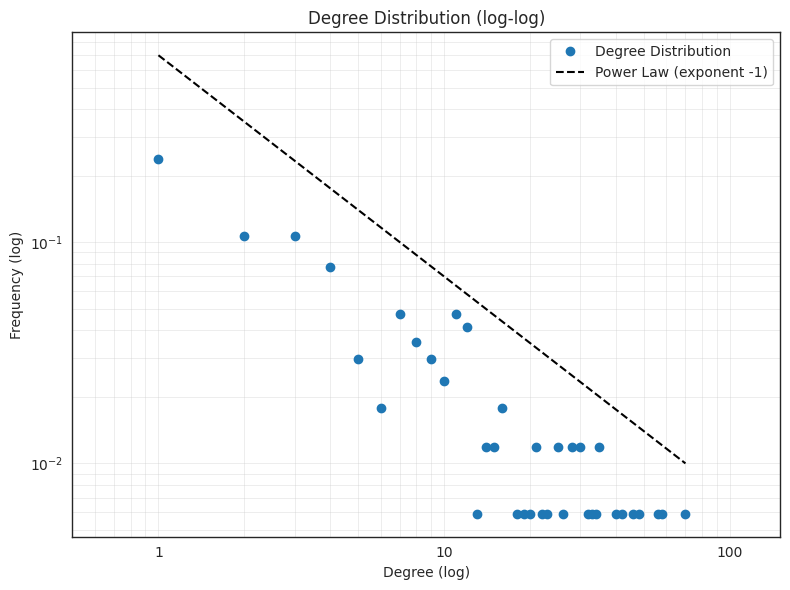

In [98]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter

# Assuming you already have the adjacency matrix stored in 'adjacency_matrix'

# Calculate the degrees
degrees = np.abs(adjacency_matrix != 0).sum(axis=1)

degree_counts = (degrees.value_counts() / adjacency_matrix.shape[0]).values
degree_idx = degrees.value_counts().index

# Plot on log-log scale
plt.figure(figsize=(8, 6))
plt.plot(degree_idx, degree_counts, linestyle=' ', marker='o', label='Degree Distribution')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Degree (log)')
plt.ylabel('Frequency (log)')
plt.xlim(0.5, 150)
plt.grid(which='both', linestyle='-', linewidth=0.5, alpha=0.5)
plt.gca().xaxis.set_major_formatter(ScalarFormatter())
plt.title('Degree Distribution (log-log)')

# Add a line for the theoretical power law with exponent -1
x_values = np.linspace(min(degree_idx), max(degree_idx), 100)
y_values = 0.7 * x_values ** (-1)  # Adjust the constant for visualization
plt.plot(x_values, y_values, color='k', linestyle='--', label='Power Law (exponent -1)')

plt.legend()
plt.tight_layout()

# Save the plot
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/pathways_network/degree_distribution.pdf')

plt.show()


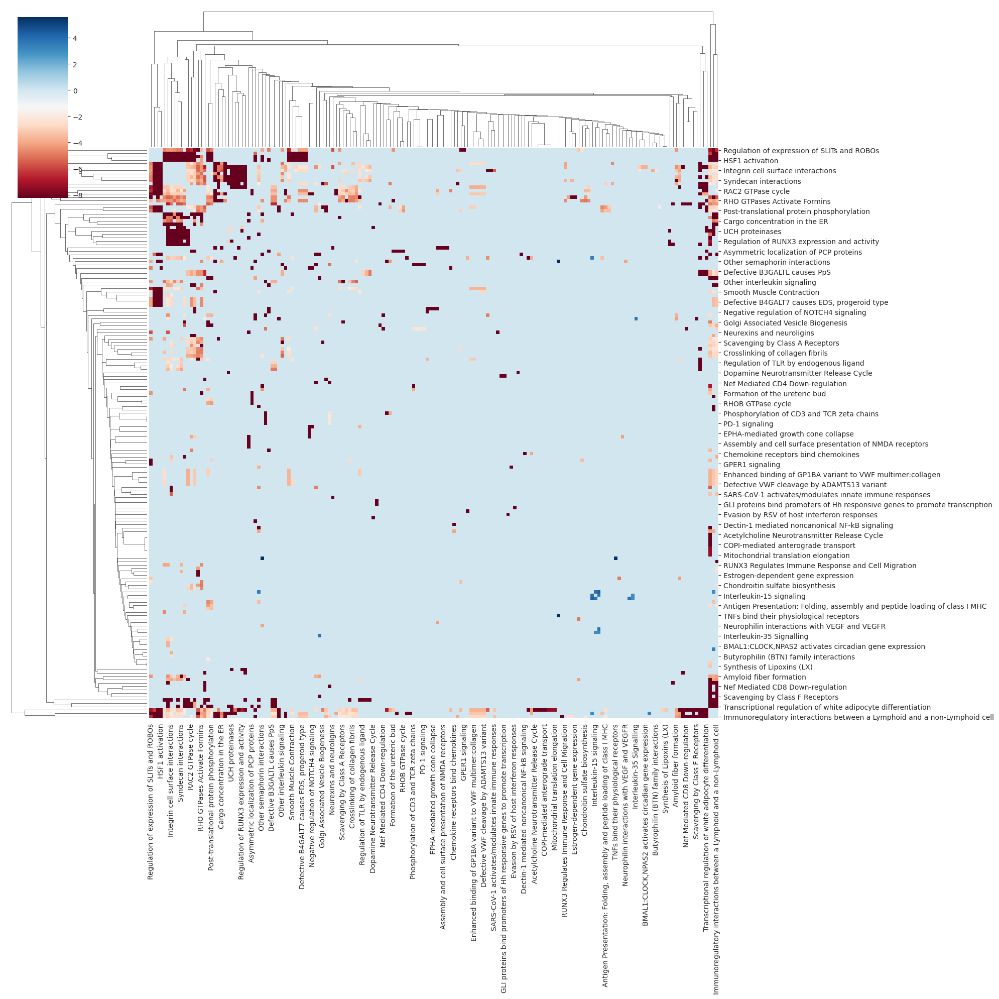

In [75]:
sns.clustermap(adjacency_matrix, figsize=(20,20), cmap='RdBu')

In [77]:
adjacency_matrix.index

Index(['Nef Mediated CD8 Down-regulation', 'Defective B3GALTL causes PpS',
       'STAT3 nuclear events downstream of ALK signaling',
       'SMAD2/SMAD3:SMAD4 heterotrimer regulates transcription',
       'Collagen degradation', 'GPVI-mediated activation cascade',
       'Tight junction interactions', 'Attenuation phase',
       'Golgi Associated Vesicle Biogenesis',
       'Interaction between L1 and Ankyrins',
       ...
       'Signaling by RAF1 mutants', 'Butyrophilin (BTN) family interactions',
       'Formation of the ureteric bud', 'CDC42 GTPase cycle',
       'Collagen chain trimerization', 'Mitochondrial translation elongation',
       'Recycling pathway of L1', 'Cytosolic tRNA aminoacylation',
       'Acetylcholine Neurotransmitter Release Cycle',
       'MET activates PTK2 signaling'],
      dtype='object', length=169)

# High level pathways

In [71]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_filtered.csv')

In [72]:
network[:20]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,inf,0.005746,0.000000,15,0,28,13
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856,0.000710,0.095238,19,1,23,11
2,RUNX1 and FOXP3 control the development of reg...,Interleukin receptor SHC signaling,4.321928,0.006920,0.057143,20,1,30,11
3,RUNX1 and FOXP3 control the development of reg...,Interleukin-15 signaling,3.797956,0.029849,0.000000,17,1,28,10
4,Interleukin-15 signaling,Interleukin receptor SHC signaling,3.767554,0.002717,0.242424,22,3,29,16
5,Interleukin-21 signaling,Interleukin receptor SHC signaling,3.748938,0.005479,0.088235,22,2,31,13
6,Interleukin-35 Signalling,DAP12 signaling,3.714246,0.025616,0.000000,14,1,30,16
7,RUNX1 and FOXP3 control the development of reg...,Interleukin-10 signaling,3.462707,0.004912,0.000000,21,2,41,23
8,Nuclear events stimulated by ALK signaling in ...,Interleukin-4 and Interleukin-13 signaling,3.378512,0.037013,0.027972,13,1,43,25
9,Interleukin-2 signaling,Interleukin-15 signaling,3.044394,0.014178,0.368421,21,4,28,15


In [73]:
(network['log2_odds_ratio'] > 0).value_counts()

False    773
True      12
Name: log2_odds_ratio, dtype: int64

In [74]:
adj = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_high_level_adjacency.csv', index_col=0)

In [75]:
ranked = stack_triangle(adj, 'n')

In [76]:
df = ranked.sort_values(by='n', ascending=False)
df = df[df['n'] > 0]
df.shape

(66, 1)

In [77]:
# Reset index to explode
exploded_df = df.reset_index()

# Rename columns
exploded_df.columns = ['Level 1', 'Level 2', 'n']

for elem in exploded_df['Level 1'] + '-' + exploded_df['Level 2'] + ': ' + exploded_df['n'].astype(int).astype(str):
    print(elem)

Immune System-Disease: 74
Immune System-Extracellular matrix organization: 62
Metabolism of proteins-Immune System: 47
Signal Transduction-Extracellular matrix organization: 44
Disease-Extracellular matrix organization: 35
Disease-Signal Transduction: 33
Signal Transduction-Developmental Biology: 33
Immune System-Signal Transduction: 31
Immune System-Developmental Biology: 30
Metabolism of proteins-Signal Transduction: 23
Metabolism of proteins-Extracellular matrix organization: 22
Extracellular matrix organization-Developmental Biology: 20
Vesicle-mediated transport-Immune System: 16
Gene expression (Transcription)-Immune System: 15
Cellular responses to stimuli-Immune System: 15
Cellular responses to stimuli-Extracellular matrix organization: 15
Metabolism of proteins-Developmental Biology: 14
Disease-Hemostasis: 14
Cellular responses to stimuli-Signal Transduction: 13
Extracellular matrix organization-Hemostasis: 13
Cellular responses to stimuli-Disease: 13
Immune System-Metabolism:

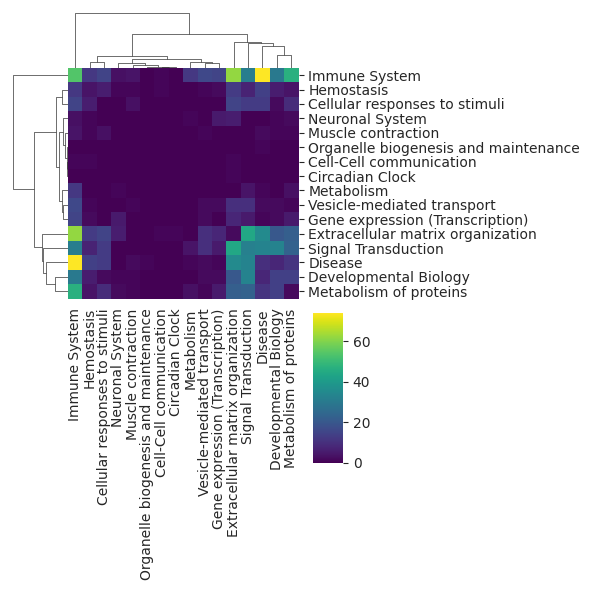

In [85]:
sns.clustermap(
    adj,
    cmap='viridis',
    figsize=(6,6),
    cbar_pos=(.53, .22, .05, .25)
)

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/pathways_network/high_lev_heathmap.pdf')

# Pathways Network (New)

In [51]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network.csv')

In [52]:
network = network.query('pathway2_modules_tumor >= 3')

#network = network.query(
#    'pathway1_modules_tumor >= 5 & ' + \
#    'pathway2_modules_tumor >= 5 & ' + \
#    'pathway1_modules_normal >= 5 & ' + \
#    'pathway2_modules_normal >= 5'
#)

network = network[network['j_genesets'] < 0.2]
network = network[np.abs(network['adj_diff']) > 0.05]
#
network.reset_index(drop=True, inplace=True)

In [53]:
#network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/pathways_network_filtered_small.csv')

In [61]:
network.head()

,pathway1,pathway2,adj_diff,j_genesets,j_modules_diff,intersection_tot,pathway1_modules_tot,pathway2_modules_tot,j_modules_tumor,j_modules_normal,pathway1_modules_tumor,pathway1_modules_normal,pathway2_modules_tumor,pathway2_modules_normal,intersection_tumor,intersection_normal,adj_tumor,adj_normal
0,Interleukin-21 Signaling R-HSA-9020958,FCGR Activation R-HSA-2029481,0.807692,0.000000,0.807692,21,25,40,0.807692,0.000000,23,2,24,16,21,0,0.807692,0.000000
1,TRAF6-mediated Induction Of TAK1 Complex Withi...,MAP3K8 (TPL2)-dependent MAPK1/3 Activation R-H...,0.791209,0.142857,0.923077,5,8,14,1.000000,0.076923,4,4,4,10,4,1,0.857143,0.065934
2,MAP3K8 (TPL2)-dependent MAPK1/3 Activation R-H...,IRAK2 Mediated Activation Of TAK1 Complex Upon...,0.786325,0.148148,0.923077,5,14,8,1.000000,0.076923,4,10,4,4,4,1,0.851852,0.065527
3,Interleukin-21 Signaling R-HSA-9020958,Classical Antibody-Mediated Complement Activat...,0.769231,0.000000,0.769231,20,25,45,0.769231,0.000000,23,2,23,22,20,0,0.769231,0.000000
4,Peptide Ligand-Binding Receptors R-HSA-375276,Interleukin-21 Signaling R-HSA-9020958,0.750000,0.000000,0.750000,18,22,25,0.750000,0.000000,19,3,23,2,18,0,0.750000,0.000000


In [60]:
26187 / network.shape[0]

0.08229393519435095

318213

In [57]:
str1 = 'gpcr'
str2 = 'tyrosine kinase'

network[
    (network['pathway1'].str.lower().str.contains(str1.lower()) & network['pathway2'].str.lower().str.contains(str2.lower())) |
    (network['pathway1'].str.lower().str.contains(str2.lower()) & network['pathway2'].str.lower().str.contains(str1.lower()))
]


,pathway1,pathway2,adj_diff,j_genesets,j_modules_diff,intersection_tot,pathway1_modules_tot,pathway2_modules_tot,j_modules_tumor,j_modules_normal,pathway1_modules_tumor,pathway1_modules_normal,pathway2_modules_tumor,pathway2_modules_normal,intersection_tumor,intersection_normal,adj_tumor,adj_normal
26122,Signaling By Receptor Tyrosine Kinases R-HSA-9...,GPCR Ligand Binding R-HSA-500792,0.209640,0.004211,0.210526,16,142,24,0.210526,0.000000,70,72,22,2,16,0,0.209640,0.000000
26187,Signaling By Receptor Tyrosine Kinases R-HSA-9...,Signaling By GPCR R-HSA-372790,0.209358,0.049601,0.220284,39,142,58,0.354430,0.134146,70,72,37,21,28,11,0.336850,0.127492
28420,Signaling By Receptor Tyrosine Kinases R-HSA-9...,GPCR Downstream Signaling R-HSA-388396,0.201596,0.052880,0.212851,36,142,55,0.333333,0.120482,70,72,34,21,26,10,0.315707,0.114111
131376,Signaling By Non-Receptor Tyrosine Kinases R-H...,GPCR Ligand Binding R-HSA-500792,0.073929,0.001965,0.074074,2,17,24,0.074074,0.000000,7,10,22,2,2,0,0.073929,0.000000
177271,Signaling By Non-Receptor Tyrosine Kinases R-H...,GPCR Downstream Signaling R-HSA-388396,0.050741,0.010542,0.051282,2,17,55,0.051282,0.000000,7,10,34,21,2,0,0.050741,0.000000


In [54]:
network['pathway1_modules_normal'].max()

27

In [11]:
t_network[t_network['intersection'] >= 10].sort_values(by='adj', ascending=False)

,pathway1,pathway2,j_genesets,j_modules,pathway1_modules,pathway2_modules,intersection,adj
253026,Immunoregulatory Interactions Between A Lympho...,Generation Of Second Messenger Molecules R-HSA...,0.026490,0.878049,41,36,36,0.854789
514084,Nuclear Envelope (NE) Reassembly R-HSA-2995410,Extension Of Telomeres R-HSA-180786,0.000000,0.846154,34,38,33,0.846154
1410031,Transcriptional Regulation By E2F6 R-HSA-8953750,Removal Of Flap Intermediate R-HSA-69166,0.000000,0.812500,31,27,26,0.812500
1409844,Transcriptional Regulation By E2F6 R-HSA-8953750,Processive Synthesis On Lagging Strand R-HSA-6...,0.000000,0.812500,31,27,26,0.812500
291205,Interleukin-21 Signaling R-HSA-9020958,FCGR Activation R-HSA-2029481,0.000000,0.807692,23,24,21,0.807692
...,...,...,...,...,...,...,...,...
418743,Mitotic G2-G2/M Phases R-HSA-453274,G2/M Transition R-HSA-69275,0.989130,1.000000,68,68,68,0.010870
1391208,Toll Like Receptor 7/8 (TLR7/8) Cascade R-HSA-...,MyD88 Dependent Cascade Initiated On Endosome ...,0.990291,0.961538,26,25,25,0.009335
1338360,TRAF6 Mediated Induction Of NFkB And MAP Kinas...,MyD88 Dependent Cascade Initiated On Endosome ...,0.990196,0.920000,23,25,23,0.009020
419983,Mitotic Metaphase And Anaphase R-HSA-2555396,Mitotic Anaphase R-HSA-68882,0.995708,1.000000,70,70,70,0.004292


# Module enrichment

In [12]:
# Pathways genesets Jaccard similarity
jg = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/pathways_genesets_jaccard.csv', index_col=0)

# Pathways tumor modules similarity 
tjm = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/tumor_modules_jaccard.csv', index_col=0)
tc = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/tumor_cooccurrences_counts.csv', index_col=0)
tc = tc.loc[tjm.index, tjm.columns]

# Pathways normal modules similarity 
njm = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/normal_modules_jaccard.csv', index_col=0)
nc = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/normal_cooccurrences_counts.csv', index_col=0)
nc = nc.loc[njm.index, njm.columns]


FileNotFoundError: [Errno 2] No such file or directory: '/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/pathways_genesets_jaccard.csv'

In [4]:
def stack_triangle(df, col):
    df = pd.DataFrame(
        df.where(
            np.tri(
                df.shape[0],
                dtype=bool,
                k=-1
            ),
            np.nan
        ).stack(dropna=True), columns=[col] 
    )
    
    return df

jg  = stack_triangle(jg,  'J')
tjm = stack_triangle(tjm, 'J')
tc  = stack_triangle(tc,  'C')
njm = stack_triangle(njm, 'J')
nc  = stack_triangle(nc,  'C')

[]

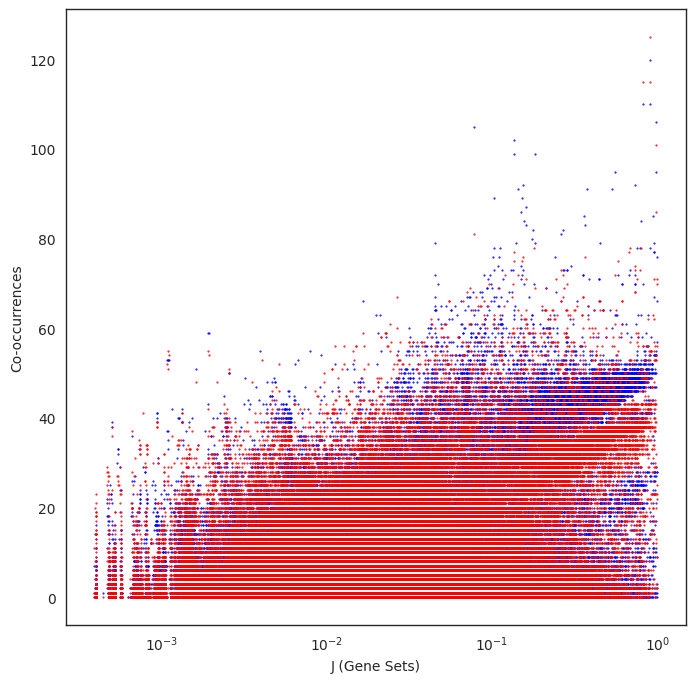

In [5]:
plt.figure(figsize=(8, 8))
plt.scatter(jg['J'], nc['C'], marker='.', color='blue', s=1, alpha=1)
plt.scatter(jg['J'], tc['C'], marker='.', color='red', s=1, alpha=1)
plt.xlabel('J (Gene Sets)')
plt.ylabel('Co-occurrences')
plt.xscale('log')
plt.plot()

[]

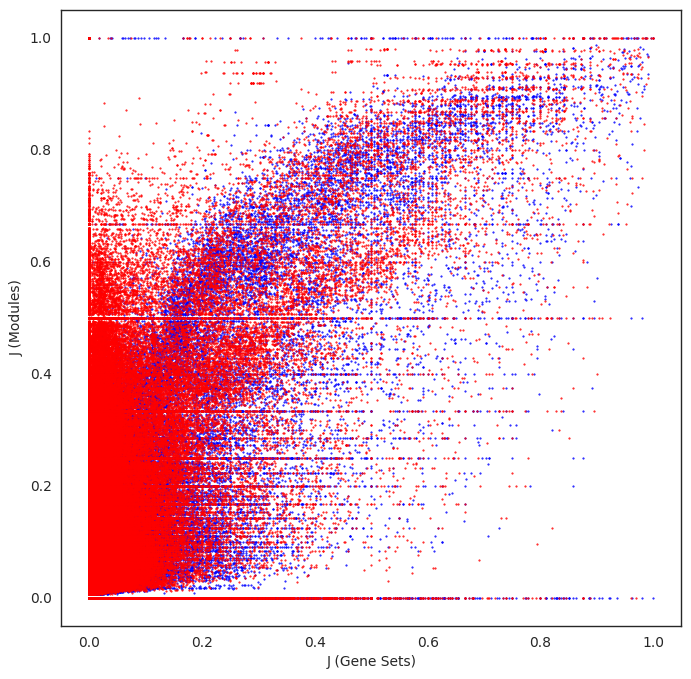

In [6]:
plt.figure(figsize=(8, 8))
plt.scatter(jg['J'], njm['J'], marker='.', color='blue', s=1, alpha=1)
plt.scatter(jg['J'], tjm['J'], marker='.', color='red', s=1, alpha=1)
plt.xlabel('J (Gene Sets)')
plt.ylabel('J (Modules)')
plt.plot()

In [7]:
df = (tjm['J'] - njm['J']).to_frame(name='diff_J_modules')
df.loc[jg.index, 'J_genesets'] = jg['J'] 
df.loc[jg.index, 'J_N_modules'] = njm.loc[jg.index, 'J']
df.loc[jg.index, 'J_T_modules'] = tjm.loc[jg.index, 'J']
df.loc[jg.index, 'N_counts'] = nc.loc[jg.index, 'C']
df.loc[jg.index, 'T_counts'] = tc.loc[jg.index, 'C'] 
df['sum_counts'] = df['T_counts'] + df['N_counts']
df = df.sort_values(by='diff_J_modules', ascending=False)

min_modules = 10
min_J_difference = 0.
max_J_genesets = 1.

df = df[(df['N_counts'] >= min_modules) & (df['T_counts'] >= min_modules)]
df = df[df['J_genesets'] <= max_J_genesets]
df = df[np.abs(df['diff_J_modules']) >= min_J_difference]

Text(0, 0.5, 'Modules')

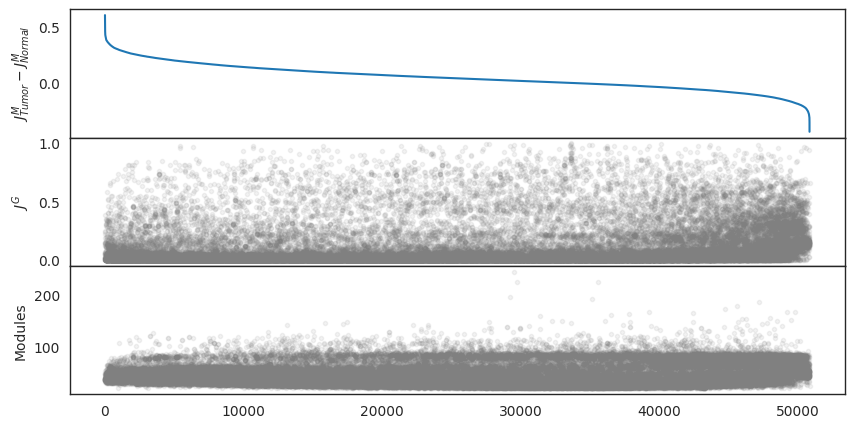

In [8]:
fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(10,5), sharex=True)
plt.subplots_adjust(hspace=0)
ax1.plot(df.diff_J_modules.values)
ax1.set_ylabel('$J_{Tumor}^M - J_{Normal}^M$')
ax2.plot(df.J_genesets.values, marker='.', alpha=0.1, linestyle=" ", color='gray')
ax2.set_ylabel('$J^G$')
ax3.plot(df.sum_counts.values, marker='.', alpha=0.1, linestyle=" ", color='gray')
ax3.set_ylabel('Modules')

In [9]:
df['adj'] = df['diff_J_modules']*(1-df['J_genesets'])
df.sort_values(by='adj', ascending=False, inplace=True)
df['rank'] = list(range(df.shape[0]))

In [10]:
#queries = ['Receptor Tyrosine Kinases']
queries = ['Signaling By GPCR']

masks = []

for i, query in enumerate(queries):
    mask0 = df.index.get_level_values(0).str.contains(query, case=False)
    mask1 = df.index.get_level_values(1).str.contains(query, case=False)
    masks.append(np.logical_or(mask0 , mask1))
    
mask = True * df.shape[0]

for elem in masks:
    print(sum(elem))
    mask = np.logical_and(mask , elem)
    print(sum(mask))
    print()

32
32



In [11]:
df.shape

(50855, 9)

In [2]:
def stack_triangle(df, col):
    df = pd.DataFrame(
        df.where(
            np.tri(
                df.shape[0],
                dtype=bool,
                k=-1
            ),
            np.nan
        ).stack(dropna=True), columns=[col] 
    )
    
    return df


In [12]:
df[mask]

,,diff_J_modules,J_genesets,J_N_modules,J_T_modules,N_counts,T_counts,sum_counts,adj,rank
Toll-like Receptor Cascades R-HSA-168898,Signaling By GPCR R-HSA-372790,0.359618,0.019162,0.177419,0.537037,11.0,27.0,38.0,0.352727,188
Cell Surface Interactions At Vascular Wall R-HSA-202733,Signaling By GPCR R-HSA-372790,0.345000,0.016049,0.275000,0.620000,11.0,30.0,41.0,0.339463,263
Innate Immune System R-HSA-168249,Signaling By GPCR R-HSA-372790,0.336103,0.046117,0.141509,0.477612,15.0,30.0,45.0,0.320603,443
"Platelet Activation, Signaling And Aggregation R-HSA-76002",Signaling By GPCR R-HSA-372790,0.352320,0.114657,0.254237,0.606557,15.0,35.0,50.0,0.311924,538
Immunoregulatory Interactions Between A Lymphoid And A non-Lymphoid Cell R-HSA-198933,Signaling By GPCR R-HSA-372790,0.307265,0.003708,0.288889,0.596154,13.0,30.0,43.0,0.306126,629
Cytokine Signaling In Immune System R-HSA-1280215,Signaling By GPCR R-HSA-372790,0.311357,0.046652,0.161616,0.472973,16.0,33.0,49.0,0.296832,785
Signaling By Interleukins R-HSA-449147,Signaling By GPCR R-HSA-372790,0.305870,0.047706,0.171053,0.476923,13.0,29.0,42.0,0.291278,879
Immune System R-HSA-168256,Signaling By GPCR R-HSA-372790,0.300000,0.042789,0.123077,0.423077,16.0,31.0,47.0,0.287163,981
Interferon Gamma Signaling R-HSA-877300,Signaling By GPCR R-HSA-372790,0.287722,0.007772,0.204082,0.491803,10.0,28.0,38.0,0.285485,1027
"Interleukin-3, Interleukin-5 And GM-CSF Signaling R-HSA-512988",Signaling By GPCR R-HSA-372790,0.273243,0.012431,0.277778,0.551020,10.0,26.0,36.0,0.269846,1382


[]

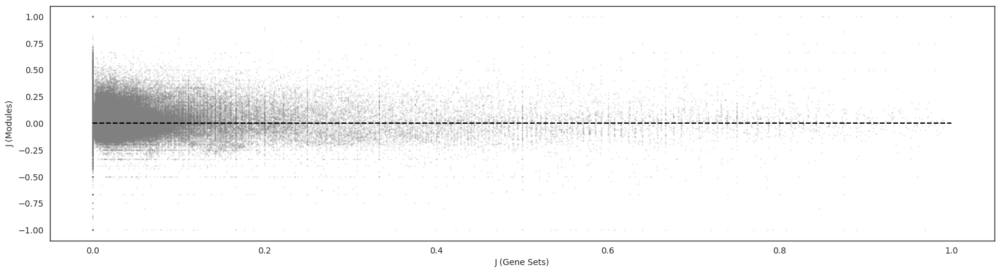

In [14]:
plt.figure(figsize=(20, 5))
plt.scatter(jg['J'], tjm['J'] - njm['J'], marker='.', color='gray', s=5, alpha=0.1)
plt.hlines(y=0, xmin=0, xmax=1, linestyle='--', color='k')
plt.xlabel('J (Gene Sets)')
plt.ylabel('J (Modules)')
plt.plot()

# Modules ranked by size

In [39]:
import os
import pandas as pd
from matplotlib.cm import get_cmap

cmap = get_cmap('tab20')

parent_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/"

# Initialize an empty list to store dataframes
t_df = []
n_df = []
i = 0
processed_normal_files = set()

for tissue in os.listdir(parent_dir):
    increase_i = False
    color = cmap(i)
    tissue_path = os.path.join(parent_dir, tissue, "tumor")
    
    for tumor_type in os.listdir(tissue_path):
        data = {}
        tumor_dir = os.path.join(tissue_path, tumor_type)
        module_info_path = os.path.join(tumor_dir, "module_info.csv")
        corresponding_normal_file = os.path.join(tumor_dir, "corresponding_normal_file.txt")
        
        # Check if both module_info.csv and corresponding_normal_file.txt exist
        if os.path.exists(module_info_path) and os.path.exists(corresponding_normal_file):
            try:
                with open(corresponding_normal_file, 'r') as normal_file:
                    normal_dir = os.path.dirname(normal_file.read().strip())
                
                # Read module_info.csv into a dataframe
                tumordata = pd.read_csv(module_info_path, index_col=0)
                tumordata["name"] = os.path.basename(tumor_dir)
                tumordata["color"] = [color] * tumordata.shape[0]
                
                # Also read normal file if it's new
                if normal_dir not in processed_normal_files:
                    normaldata = pd.read_csv(os.path.join(normal_dir, 'module_info.csv'), index_col=0)
                    normaldata["name"] = os.path.basename(os.path.dirname(normal_dir))
                    normaldata["color"] = [color] * normaldata.shape[0]

                    # Append the dataframe to the list and update the set
                    n_df.append(normaldata)
                    processed_normal_files.add(normal_dir)
                    increase_i = True

                # Append the tumor dataframe to the list
                t_df.append(tumordata)
                
            except Exception as e:
                print(f"Error processing {tumor_dir}: {e}")
    
    if increase_i:
        i += 1
                
# Concatenate all dataframes into a final dataframe
t_df = pd.concat(t_df)
n_df = pd.concat(n_df)


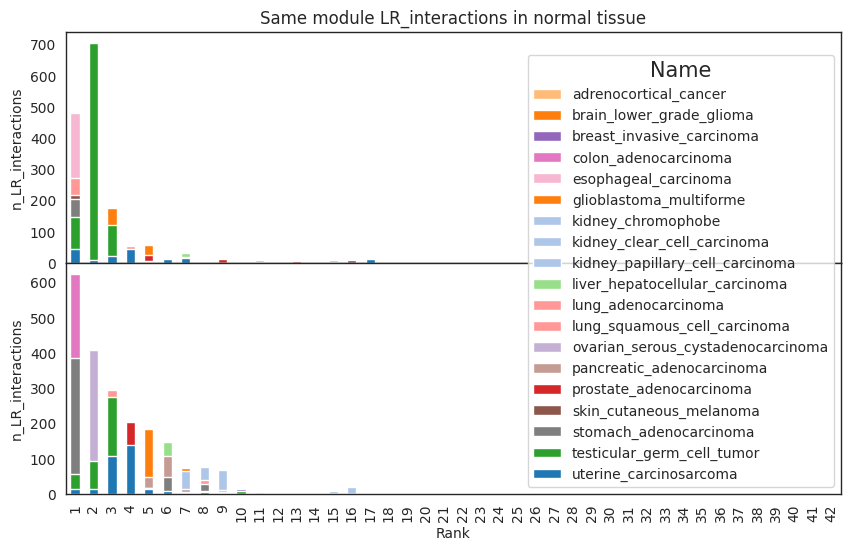

In [43]:
import matplotlib.pyplot as plt

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True)
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)

col_to_plot = "n_LR_interactions" 
#col_to_plot = "per10k_pairs_that_are_LR_interactions" 

# Plot for n_df
for i, (name, group) in enumerate(n_df.groupby('name')):
    color = group['color'].iloc[0]  # Get the color of the group
    group.plot(kind='bar', x='rank', y=col_to_plot, ax=axes[0], label=name, color=color, legend=False)

axes[0].set_title('Same module LR_interactions in normal tissue')
axes[0].set_xlabel('Rank')
axes[0].set_ylabel(col_to_plot)

# Plot for t_df
for i, (name, group) in enumerate(t_df.groupby('name')):
    color = group['color'].iloc[0]  # Get the color of the group
    group.plot(kind='bar', x='rank', y=col_to_plot, ax=axes[1], label=name, color=color)

#axes[1].set_title('Same module LR_interactions in tumor tissue')
axes[1].set_xlabel('Rank')
axes[1].set_ylabel(col_to_plot)
axes[1].legend(title='Name')

# Adjust layout
#plt.tight_layout()

# Show the plot
plt.show()


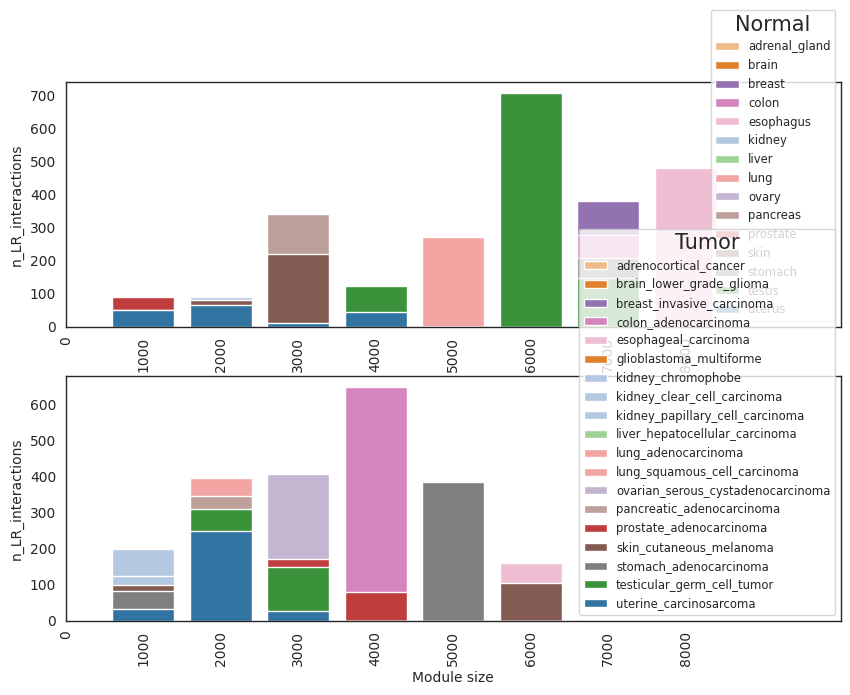

In [47]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 7), sharex=False)
#fig.subplots_adjust(hspace=0)

col_to_plot = "n_LR_interactions" 

# Define bins for different sizes
bin_width = 1000

size_bins = np.arange(
    0,
    max(max(n_df['size']), max(t_df['size'])) + bin_width,
    bin_width,
)  # Define your desired bin sizes here

# Function to assign size bins
def assign_size_bin(size):
    for i in range(len(size_bins) - 1):
        if size_bins[i] < size <= size_bins[i + 1]:
            return size_bins[i+1]
        
n_df['size_bin'] = n_df['size'].apply(assign_size_bin)
t_df['size_bin'] = t_df['size'].apply(assign_size_bin)

n_df_grouped = n_df.groupby(['name', 'size_bin']).agg({col_to_plot: 'sum'}).reset_index()
t_df_grouped = t_df.groupby(['name', 'size_bin']).agg({col_to_plot: 'sum'}).reset_index()

# Merge n_df_grouped with n_df to add corresponding colors
if 'color' not in n_df_grouped.columns:
    n_df_grouped = n_df_grouped.merge(n_df[['name', 'color']].drop_duplicates(), on='name', how='left')
if 'color' not in t_df_grouped.columns:
    # Merge t_df_grouped with t_df to add corresponding colors
    t_df_grouped = t_df_grouped.merge(t_df[['name', 'color']].drop_duplicates(), on='name', how='left')

# Ensure both grouped dataframes have entries for all bins
for name in n_df_grouped['name'].unique():
    for size_bin in size_bins:
        if not ((n_df_grouped['name'] == name) & (n_df_grouped['size_bin'] == size_bin)).any():
            n_df_grouped = n_df_grouped.append({'name': name, 'size_bin': size_bin, col_to_plot: 0}, ignore_index=True)

for name in t_df_grouped['name'].unique():
    for size_bin in size_bins:
        if not ((t_df_grouped['name'] == name) & (t_df_grouped['size_bin'] == size_bin)).any():
            t_df_grouped = t_df_grouped.append({'name': name, 'size_bin': size_bin, col_to_plot: 0}, ignore_index=True)
            
xlim = max(t_df_grouped.size_bin.nunique(), n_df_grouped.size_bin.nunique()) + 1

# Normal colors

# Extract unique names and corresponding colors
unique_names_n = n_df_grouped['name'].unique()
unique_colors_n = n_df_grouped['color'].unique()
# Create a dictionary mapping each unique name to its corresponding color
name_color_map_n = dict(zip(unique_names_n, unique_colors_n))
# Create a dictionary to store the first color assigned to each unique name
name_color_map_t = {}

# Tumor colors

# Iterate over each unique name in the DataFrame
for name in t_df_grouped['name'].unique():
    # Get the first color assigned to the current name
    first_color = t_df_grouped.loc[t_df_grouped['name'] == name, 'color'].iloc[0]
    # Add the name and its corresponding color to the dictionary
    name_color_map_t[name] = first_color

# Plot for n_df
sns.barplot(data=n_df_grouped, x='size_bin', y=col_to_plot, hue='name', palette=name_color_map_n, ax=axes[0], dodge=False)

axes[0].legend(title='Normal', fontsize='small')
axes[0].set_xlabel('Size Bin')
axes[0].set_ylabel(col_to_plot)

# Plot for t_df
sns.barplot(data=t_df_grouped, x='size_bin', y=col_to_plot, hue='name', palette=name_color_map_t, ax=axes[1], dodge=False)

axes[1].legend(title='Tumor', fontsize='small')
axes[1].set_xlabel('Module size')
axes[1].set_ylabel(col_to_plot)

axes[0].set_xlim(0, xlim)
axes[1].set_xlim(0, xlim)

# Rotate x-labels by 90 degrees
for ax in axes:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.set_xticks(ax.get_xticks())  # Set the x-axis ticks

# Show the plot
plt.show()


# LR pairs, normal vs tumor

In [78]:
parent_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/"

# Initialize an empty list to store dataframes
all_dataframes = []

for tissue in os.listdir(parent_dir):
    tissue_path = os.path.join(parent_dir, tissue, "tumor")
    
    for tumor_type in os.listdir(tissue_path):
        data = {}
        file_path = os.path.join(tissue_path, tumor_type, "comparison.txt")
                
        try:
            with open(file_path, 'r') as file:
                for line in file:
                    # Split each line based on the colon (:)
                    key, value = map(str.strip, line.split(': ', 1))
                    
                    # Store the key-value pair in the dictionary
                    data[key] = value
                
            data["Name"] = data['Tumor directory'].split("/")[-1]
            data = {k: [v] for k, v in data.items()}
            data = pd.DataFrame(data, index=data["Name"])
            
            # Append the dataframe to the list
            all_dataframes.append(data)
            
        except Exception as e:
            pass

# Concatenate all dataframes into a final dataframe
comp_df = pd.concat(all_dataframes)
comp_df.drop(columns=["Tumor directory", "Normal directory", "Name"], inplace=True)
comp_df = comp_df.apply(pd.to_numeric, errors='ignore')
comp_df.head()

,roc_auc_normal_vs_all,roc_auc_normal_vs_lr,normal_ranksums_U_vs_all,normal_ranksums_p_vs_all,normal_ranksums_U_vs_lr,normal_ranksums_p_vs_lr,roc_auc_tumor_vs_all,roc_auc_tumor_vs_lr,tumor_ranksums_U_vs_all,tumor_ranksums_p_vs_all,tumor_ranksums_U_vs_lr,tumor_ranksums_p_vs_lr,jaccard_all_lr_pairs,jaccard_same_module
uterine_carcinosarcoma,0.552611,0.564248,7.536312,2.417237e-14,9.192151,1.925321e-20,0.632918,0.577628,20.269727,1.189865e-91,11.824415,1.459643e-32,0.719438,0.074492
kidney_papillary_cell_carcinoma,0.591298,0.563029,13.462468,1.300408e-41,9.282488,8.278301e-21,0.606828,0.587191,15.122662,5.740281e-52,12.327964,3.202228e-35,0.729156,0.083135
kidney_chromophobe,0.591298,0.563029,13.462468,1.300408e-41,9.282488,8.278301e-21,0.578623,0.550660,10.897696,5.910628e-28,7.013075,1.165685e-12,0.727090,0.078431
kidney_clear_cell_carcinoma,0.591298,0.563029,13.462468,1.300408e-41,9.282488,8.278301e-21,0.603091,0.575860,15.814185,1.242014e-56,11.623189,1.570932e-31,0.719330,0.101626
brain_lower_grade_glioma,0.606592,0.565845,15.393427,9.058910e-54,9.497419,1.075788e-21,0.624685,0.594772,19.053427,3.076925e-81,14.465088,1.006736e-47,0.815867,0.105850


In [79]:
comp_df.columns

Index(['roc_auc_normal_vs_all', 'roc_auc_normal_vs_lr',
       'normal_ranksums_U_vs_all', 'normal_ranksums_p_vs_all',
       'normal_ranksums_U_vs_lr', 'normal_ranksums_p_vs_lr',
       'roc_auc_tumor_vs_all', 'roc_auc_tumor_vs_lr',
       'tumor_ranksums_U_vs_all', 'tumor_ranksums_p_vs_all',
       'tumor_ranksums_U_vs_lr', 'tumor_ranksums_p_vs_lr',
       'jaccard_all_lr_pairs', 'jaccard_same_module'],
      dtype='object')

In [80]:
def create_subplot(ax, data, kind, ylabel, legend_title=None, xtick_labels=None, palette=None):
    if kind == 'bar':
        data.plot(kind='bar', stacked=False, ax=ax, color=palette)
        if xtick_labels is not None:
            ax.set_xticklabels(xtick_labels)
    elif kind == 'boxplot':
        sns.boxplot(data=data, ax=ax, palette=palette)
        if xtick_labels is not None:
            ax.set_xticklabels([])  # Remove xticks for boxplot

    ax.set_ylabel(ylabel)

    if legend_title:
        ax.legend(loc="right", title=legend_title)

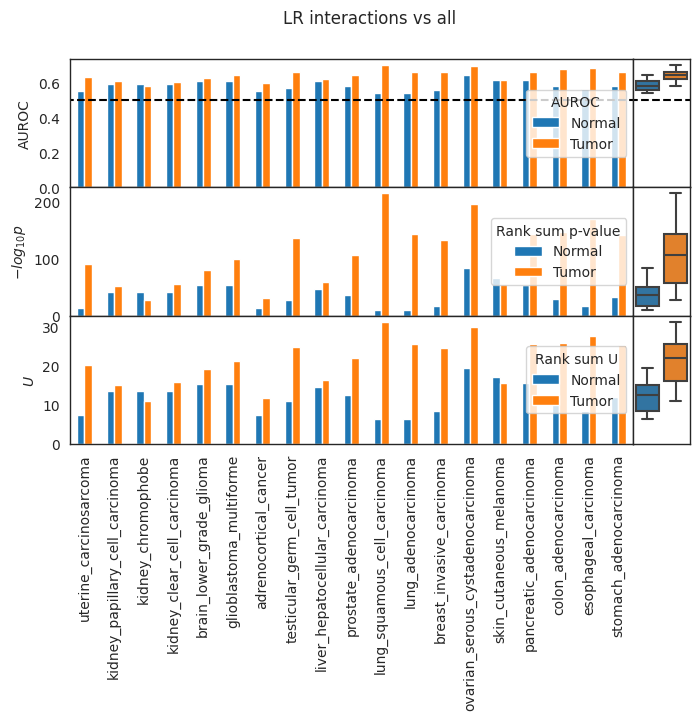

In [81]:
vs = "_vs_all"

fig, ax = plt.subplots(3, 2, figsize=(8, 5), sharex='col', sharey='row', gridspec_kw={'width_ratios': [1, 0.1]})
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)
plt.rcParams['legend.title_fontsize'] = 'medium'

fig.suptitle("LR interactions" + vs.replace("_", " "))

# Data and parameters
rename_auc = {"roc_auc_normal"+vs: "Normal", "roc_auc_tumor"+vs: "Tumor"}
bar_colors_auc = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]]))

rename_ranksum_p = {"normal_ranksums_p"+vs: "Normal", "tumor_ranksums_p"+vs: "Tumor"}
bar_colors_ranksum_p = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_ranksum_p)[["Normal", "Tumor"]]))

rename_ranksum_U = {"normal_ranksums_U"+vs: "Normal", "tumor_ranksums_U"+vs: "Tumor"}
bar_colors_ranksum_U = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_ranksum_U)[["Normal", "Tumor"]]))

#rename_jaccard = {"jaccard_all_lr_pairs": "LR pairs (all)", "jaccard_same_module": "LR pairs (same module)"}
#bar_colors_jaccard = sns.color_palette("Set2", n_colors=len(comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]]))

# Create subplots using the function
create_subplot(ax[0, 0], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'bar', 'AUROC', 'AUROC', palette=bar_colors_auc)
create_subplot(ax[0, 1], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'boxplot', 'AUROC', palette=bar_colors_auc)
ax[0, 0].hlines(y=0.5, xmin=-1, xmax=len(comp_df), color="k", linestyle="dashed", label="random")
ax[0, 1].hlines(y=0.5, xmin=-1, xmax=2, color="k", linestyle="dashed", label="random")

create_subplot(ax[1, 0], -np.log10(comp_df.rename(columns=rename_ranksum_p)[["Normal", "Tumor"]]), 'bar', r'$-log_{10}p$', 'Rank sum p-value', palette=bar_colors_ranksum_p)
create_subplot(ax[1, 1], -np.log10(comp_df.rename(columns=rename_ranksum_p)[["Normal", "Tumor"]]), 'boxplot', r'$-log_{10}p$', palette=bar_colors_ranksum_p)

create_subplot(ax[2, 0], comp_df.rename(columns=rename_ranksum_U)[["Normal", "Tumor"]], 'bar', r'$U$', 'Rank sum U', palette=bar_colors_ranksum_U)
create_subplot(ax[2, 1], comp_df.rename(columns=rename_ranksum_U)[["Normal", "Tumor"]], 'boxplot', r'$U$', palette=bar_colors_ranksum_U)

#create_subplot(ax[3, 0], comp_df.rename(columns=rename_jaccard)[['LR pairs (all)', 'LR pairs (same module)']], 'bar', 'J', 'Jaccard similarity', xtick_labels=comp_df.index, palette=bar_colors_jaccard)
#create_subplot(ax[3, 1], comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]], 'boxplot', 'J', palette=bar_colors_jaccard)

ax[-1, 1].set_xticks([])

plt.show()


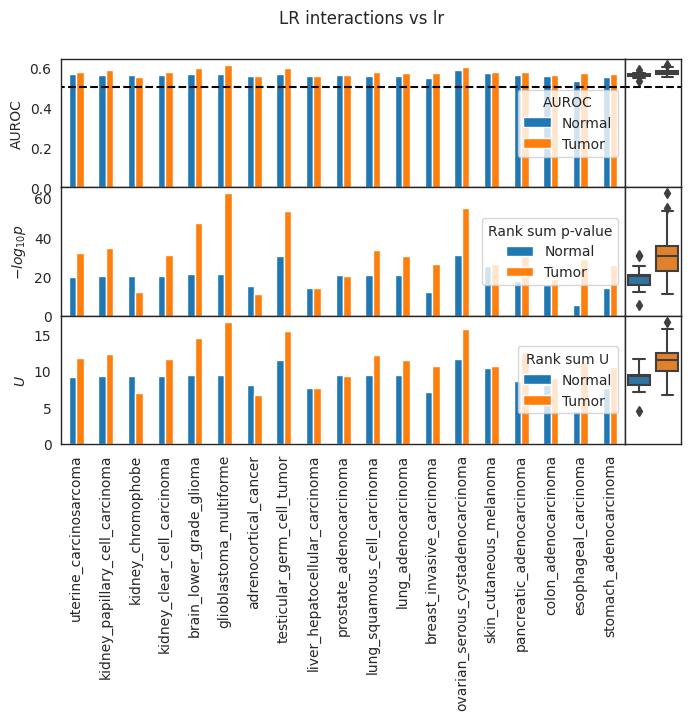

In [82]:
vs = "_vs_lr"

fig, ax = plt.subplots(3, 2, figsize=(8, 5), sharex='col', sharey='row', gridspec_kw={'width_ratios': [1, 0.1]})
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)
plt.rcParams['legend.title_fontsize'] = 'medium'

fig.suptitle("LR interactions" + vs.replace("_", " "))

# Data and parameters
rename_auc = {"roc_auc_normal"+vs: "Normal", "roc_auc_tumor"+vs: "Tumor"}
bar_colors_auc = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]]))

rename_ranksum_p = {"normal_ranksums_p"+vs: "Normal", "tumor_ranksums_p"+vs: "Tumor"}
bar_colors_ranksum_p = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_ranksum_p)[["Normal", "Tumor"]]))

rename_ranksum_U = {"normal_ranksums_U"+vs: "Normal", "tumor_ranksums_U"+vs: "Tumor"}
bar_colors_ranksum_U = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_ranksum_U)[["Normal", "Tumor"]]))

#rename_jaccard = {"jaccard_all_lr_pairs": "LR pairs (all)", "jaccard_same_module": "LR pairs (same module)"}
#bar_colors_jaccard = sns.color_palette("Set2", n_colors=len(comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]]))

# Create subplots using the function
create_subplot(ax[0, 0], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'bar', 'AUROC', 'AUROC', palette=bar_colors_auc)
create_subplot(ax[0, 1], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'boxplot', 'AUROC', palette=bar_colors_auc)
ax[0, 0].hlines(y=0.5, xmin=-1, xmax=len(comp_df), color="k", linestyle="dashed", label="random")
ax[0, 1].hlines(y=0.5, xmin=-1, xmax=2, color="k", linestyle="dashed", label="random")

create_subplot(ax[1, 0], -np.log10(comp_df.rename(columns=rename_ranksum_p)[["Normal", "Tumor"]]), 'bar', r'$-log_{10}p$', 'Rank sum p-value', palette=bar_colors_ranksum_p)
create_subplot(ax[1, 1], -np.log10(comp_df.rename(columns=rename_ranksum_p)[["Normal", "Tumor"]]), 'boxplot', r'$-log_{10}p$', palette=bar_colors_ranksum_p)

create_subplot(ax[2, 0], comp_df.rename(columns=rename_ranksum_U)[["Normal", "Tumor"]], 'bar', r'$U$', 'Rank sum U', palette=bar_colors_ranksum_U)
create_subplot(ax[2, 1], comp_df.rename(columns=rename_ranksum_U)[["Normal", "Tumor"]], 'boxplot', r'$U$', palette=bar_colors_ranksum_U)

#create_subplot(ax[3, 0], comp_df.rename(columns=rename_jaccard)[['LR pairs (all)', 'LR pairs (same module)']], 'bar', 'J', 'Jaccard similarity', xtick_labels=comp_df.index, palette=bar_colors_jaccard)
#create_subplot(ax[3, 1], comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]], 'boxplot', 'J', palette=bar_colors_jaccard)

ax[-1, 1].set_xticks([])

plt.show()


# LR interaction

In [7]:
import glob

def find_files(directory, filename):
    # Create a list to store the paths of matching files
    matching_files = []

    # Use os.walk to iterate through all subdirectories
    for root, dirs, files in os.walk(directory):
        # Use glob to find files with the specified filename in the current directory
        matching_files.extend(glob.glob(os.path.join(root, filename)))

    return matching_files

# Specify the parent directory and the filename to search for
parent_directory = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/"
filename_to_find = "LR_interactions.csv"

# Call the function to find matching files
lr_files = find_files(parent_directory, filename_to_find)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


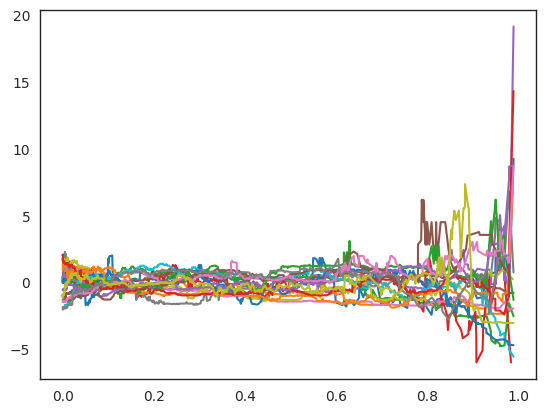

In [8]:
for i, path in enumerate(lr_files[::3]):
    print(i)
    path = path.split("LR_interactions.csv")[0]
    df = pd.read_csv(path + "LR_interactions.csv")
    tom = pd.read_csv(path + "tom.csv.gz", index_col=0)
    
    toms = []

    for index, row in df.iterrows():
        l = row['ligand']
        r = row['receptor']
        toms.append(tom.loc[l, r])

    df['TOM'] = toms
    
    ns = np.sort(df.frac_interactions.unique())
    toms = []

    for n in ns:
        toms.append(df[df.frac_interactions > n]["TOM"].median())

    plt.plot(ns, (toms-np.nanmean(toms))/np.nanstd(toms))
    #plt.vlines(x=0.75, ymin=min(toms), ymax=max(toms), color="k")
    
plt.show()

In [117]:
df.same_module.mean()

0.20389700765483645

In [118]:
df[df["frac_interactions"] > 0.75].same_module.mean()

0.19411764705882353

In [119]:
df.TOM.mean()

0.012987270164174197

In [120]:
df[df["frac_interactions"] > 0.75].TOM.mean()

0.005309597829290416

In [121]:
df.TOM.median()

0.0001767205987371

In [122]:
df[df["frac_interactions"] > 0.75].TOM.median()

0.00023644601356115

In [65]:
df = pd.read_csv("/home/lnemati/pathway_crosstalk/code/1_compare/results.csv")
df.index = df["Name"].values
df.head(3)

,Name,Tumor_n_modules,Normal_n_modules,Tumor_n_genes,Normal_n_genes,Tumor_total_gene_pairs,Normal_total_gene_pairs,Tumor_gene_pairs_same_module,Normal_gene_pairs_same_module,Tumor_total_LR_pairs,Normal_total_LR_pairs,Tumor_LR_pairs_same_module,Normal_LR_pairs_same_module,Tumor_LR_pairs_Z_score,Normal_LR_pairs_Z_score
uterine_carcinosarcoma,uterine_carcinosarcoma,101,66,14242,13646,101410161,93099835,5766400,7375479,1850,1625,253,106,14.838981,-2.088137
kidney_papillary_cell_carcinoma,kidney_papillary_cell_carcinoma,34,43,13760,14033,94661920,98455528,7499613,7693709,1586,1714,184,142,5.424649,0.725461
kidney_chromophobe,kidney_chromophobe,53,43,13474,14033,90767601,98455528,5651149,7693709,1522,1714,173,142,8.300088,0.725461


In [66]:
df.columns

Index(['Name', 'Tumor_n_modules', 'Normal_n_modules', 'Tumor_n_genes',
       'Normal_n_genes', 'Tumor_total_gene_pairs', 'Normal_total_gene_pairs',
       'Tumor_gene_pairs_same_module', 'Normal_gene_pairs_same_module',
       'Tumor_total_LR_pairs', 'Normal_total_LR_pairs',
       'Tumor_LR_pairs_same_module', 'Normal_LR_pairs_same_module',
       'Tumor_LR_pairs_Z_score', 'Normal_LR_pairs_Z_score'],
      dtype='object')

In [47]:
LR_pairs_n = pd.read_csv("/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/stomach/tumor/stomach_adenocarcinoma/LR_interactions.csv")
LR_pairs_t = pd.read_csv("/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/stomach/normal/LR_interactions.csv")

In [48]:
all_lr_pairs_n = set(LR_pairs_n["ligand"] + "-" + LR_pairs_n["receptor"])
all_lr_pairs_t = set(LR_pairs_t["ligand"] + "-" + LR_pairs_t["receptor"])

subset_n = LR_pairs_n.loc[LR_pairs_n["same_module"]]
subset_t = LR_pairs_t.loc[LR_pairs_t["same_module"]]

same_module_lr_pairs_n = set(subset_n["ligand"] + "-" + subset_n["receptor"])
same_module_lr_pairs_t = set(subset_t["ligand"] + "-" + subset_t["receptor"])

In [49]:
def jaccard_similarity(set1, set2):
    intersection_size = len(set1.intersection(set2))
    union_size = len(set1.union(set2))
    similarity = intersection_size / union_size
    return similarity

# Calculate Jaccard similarity
js_all = jaccard_similarity(all_lr_pairs_n, all_lr_pairs_t)
js_same_module = jaccard_similarity(same_module_lr_pairs_n, same_module_lr_pairs_t)


# Print the result
print("Jaccard Similarity:")
print(f"All LR pairs: {js_all}")
print(f"Same module: {js_same_module}")

Jaccard Similarity:
All LR pairs: 0.7102892366050261
Same module: 0.2412818096135721


In [36]:
from scipy.stats import ranksums

rng = np.random.default_rng()

sample1 = rng.uniform(-1, 1, int(1e8))

sample2 = rng.uniform(-0.99, 1.01, 2000) # a shifted distribution

In [39]:
ranksums(sample1, sample2, alternative='less')

RanksumsResult(statistic=-35.99798191271874, pvalue=4.498049667762534e-284)

In [ ]:
ranksums(sample1, sample2, alternative='greater')

In [26]:
col1

'Name'

In [72]:
metrics = [
    "Tumor_gene_pairs_same_module",
    "Normal_gene_pairs_same_module",
    "Tumor_LR_pairs_same_module",
    "Normal_LR_pairs_same_module",
    "Tumor_LR_pairs_Z_score",
    "Normal_LR_pairs_Z_score",
]

compare_to = [
    "Tumor_n_modules",
    "Normal_n_modules",
    "Tumor_n_genes",
    "Normal_n_genes", 
    "Tumor_total_LR_pairs",
    "Normal_total_LR_pairs",
]

In [91]:
df["Tumor_n_modules"].sort_values()

stomach_adenocarcinoma                15
testicular_germ_cell_tumor            18
prostate_adenocarcinoma               18
brain_lower_grade_glioma              22
colon_adenocarcinoma                  23
glioblastoma_multiforme               26
kidney_clear_cell_carcinoma           29
liver_hepatocellular_carcinoma        33
skin_cutaneous_melanoma               33
pancreatic_adenocarcinoma             33
kidney_papillary_cell_carcinoma       34
breast_invasive_carcinoma             39
adrenocortical_cancer                 46
lung_squamous_cell_carcinoma          49
kidney_chromophobe                    53
lung_adenocarcinoma                   54
esophageal_carcinoma                  63
ovarian_serous_cystadenocarcinoma     75
uterine_carcinosarcoma               101
Name: Tumor_n_modules, dtype: int64

In [94]:
WGCNA = PyWGCNA.readWGCNA("/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/uterus/tumor/uterine_carcinosarcoma/WGCNA_uterine_carcinosarcoma.p")

Reading WGCNA_uterine_carcinosarcoma WGCNA done!


In [95]:
WGCNA.power

5

In [92]:
df["Normal_n_modules"].sort_values()

testicular_germ_cell_tumor            6
esophageal_carcinoma                 10
stomach_adenocarcinoma               12
colon_adenocarcinoma                 12
brain_lower_grade_glioma             15
glioblastoma_multiforme              15
adrenocortical_cancer                25
liver_hepatocellular_carcinoma       25
breast_invasive_carcinoma            26
lung_adenocarcinoma                  34
lung_squamous_cell_carcinoma         34
prostate_adenocarcinoma              43
kidney_chromophobe                   43
kidney_papillary_cell_carcinoma      43
kidney_clear_cell_carcinoma          43
ovarian_serous_cystadenocarcinoma    49
pancreatic_adenocarcinoma            60
skin_cutaneous_melanoma              63
uterine_carcinosarcoma               66
Name: Normal_n_modules, dtype: int64

Tumor_gene_pairs_same_module Tumor_n_modules
!!! p-value < 0.05: 0.010349906625842863 !!!
R: -0.5729042111814793
R^2: 0.328219235189473


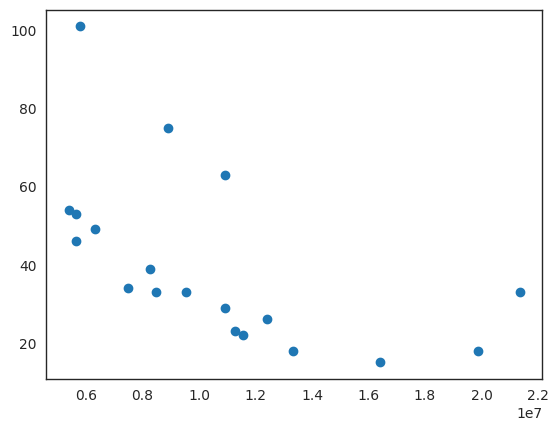

- - - - - - - - 

Normal_gene_pairs_same_module Normal_n_modules
!!! p-value < 0.05: 2.360686378370989e-06 !!!
R: -0.8599195774526
R^2: 0.7394616796862581


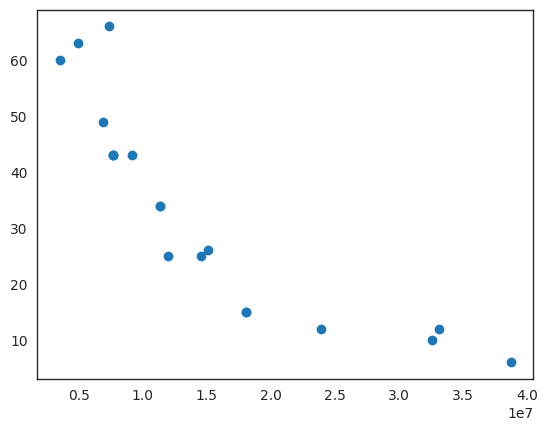

- - - - - - - - 

Normal_LR_pairs_same_module Normal_n_modules
!!! p-value < 0.05: 0.0002640810844065757 !!!
R: -0.7434727692186409
R^2: 0.5527517585696345


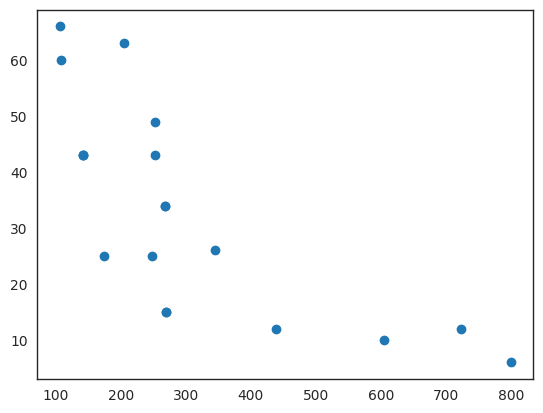

- - - - - - - - 



In [84]:
from scipy.stats import pearsonr


for col1 in metrics:
    for col2 in compare_to:
        if (("Tumor" in col1) & ("Tumor" in col2)) | (("Normal" in col1) & ("Normal" in col2)):
            res = pearsonr(df[col1], df[col2])
            if res.pvalue < 0.05:
                print(col1, col2)
                print(f"!!! p-value < 0.05: {res.pvalue} !!!")
                r = res.statistic
                print(f"R: {r}")
                print(f"R^2: {r**2}")
                plt.scatter(df[col1], df[col2])
                plt.show()
                print("- - - - - - - - ")
                print()



In [86]:
pearsonr(df["Normal_LR_pairs_same_module"], df["Normal_n_modules"])

PearsonRResult(statistic=-0.7434727692186409, pvalue=0.0002640810844065757)

In [87]:
pearsonr(df["Tumor_LR_pairs_same_module"], df["Tumor_n_modules"])

PearsonRResult(statistic=-0.2995424374572069, pvalue=0.2128063699524571)

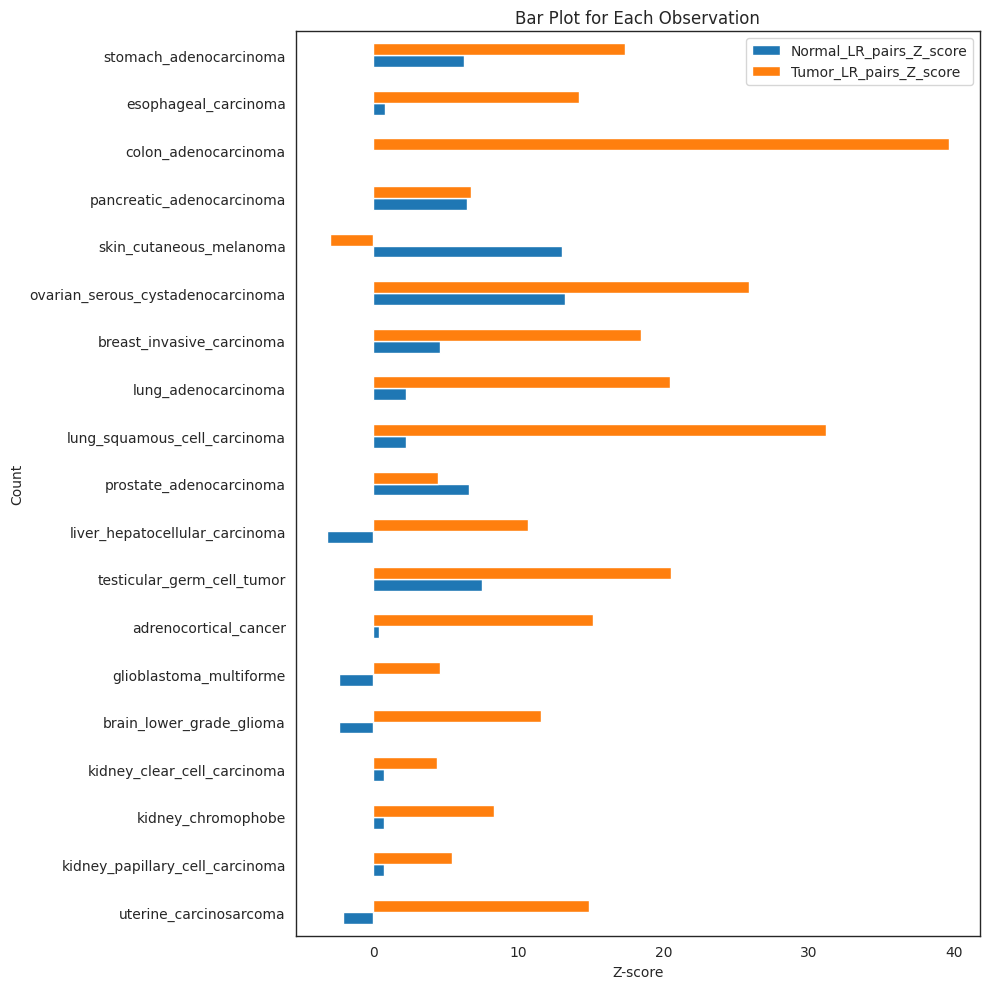

In [9]:
# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
df[["Normal_LR_pairs_Z_score", "Tumor_LR_pairs_Z_score"]].plot(kind='barh', stacked=False, ax=ax)

# Adding labels and title
plt.xlabel('Z-score')
plt.ylabel('Count')
plt.title('Bar Plot for Each Observation')
plt.tight_layout()

In [3]:
df["Tumor_same_module"] = -df["Tumor_same_module"]

In [23]:
df["Tumor_frac"] = df["Tumor_same_module"] / df["Tumor_total"]
df["Normal_frac"] = df["Normal_same_module"] / df["Normal_total"]

In [24]:
df["Difference"] = df["Normal"] + df["Tumor"]

KeyError: 'Normal'

In [ ]:
df.index = df["Name"].values

In [25]:
df["Sum"] = df["Normal_frac"] - df["Tumor_frac"]

In [26]:
df.head(3)

,Name,Tumor_same_module,Normal_same_module,Tumor_total,Normal_total,Tumor_frac,Normal_frac,Sum
uterine_carcinosarcoma,uterine_carcinosarcoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN
kidney_papillary_cell_carcinoma,kidney_papillary_cell_carcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN
kidney_chromophobe,kidney_chromophobe,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
df["RelativeDiff"] =  df["Normal_frac"] + df["Tumor_frac"] / df["Normal_frac"] - df["Tumor_frac"]

In [28]:
# Sort values from lowest to highest 
df.sort_values('Sum', inplace=True) 

ValueError: Axis limits cannot be NaN or Inf

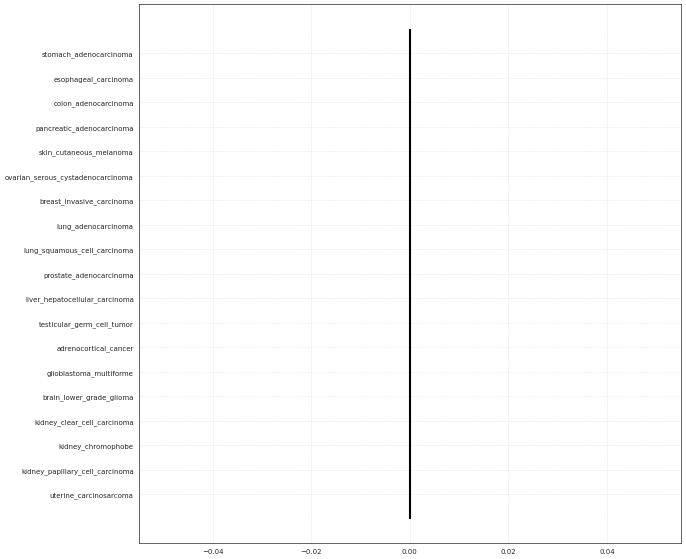

In [29]:
fig, ax = plt.subplots(figsize=(14, 14), dpi=50) 
  
lw = 35
fs = 25
bigfs = 30

# Plotting the horizontal lines 
plt.hlines(y=df.index, xmin=0, xmax=df.Normal_frac, color="#00728eff", linewidth=lw)
plt.hlines(y=df.index, xmin=0, xmax=df.Tumor_frac, color="#b72a3aff", linewidth=lw)
plt.vlines(x=0, ymin=-1, ymax=len(df), color="k", linewidth=3)

plt.grid(linestyle='--', alpha=0.5) 

width = 1.1 * np.max( [-df.Tumor_frac.min(), df.Normal_frac.max()] )

plt.xlim(-width, width)


plt.xticks(fontsize=fs) 
plt.yticks(fontsize=fs)
plt.xlabel("Fraction of LR pairs in same module", fontsize=fs)

plt.text(-width/2, len(df), "Tumor_frac", horizontalalignment='center', verticalalignment='center',fontsize=bigfs)
plt.text(+width/2, len(df), "Normal_frac", horizontalalignment='center', verticalalignment='center',fontsize=bigfs)

plt.tight_layout()

plt.savefig("/home/lnemati/barplot.png")

plt.show()

In [13]:
import liana as li

In [128]:
li.resource.select_resource("cellphonedb")

,ligand,receptor
13085,JAG2,NOTCH1
13086,DLL1,NOTCH1
13087,IGF1,IGF1R
13088,JAG1,NOTCH1
13089,WNT5A,FZD2
...,...,...
14303,WNT1,CD36
14304,OGN,HLA-DRB1
14305,CCL4L1,PGRMC2
14306,TNFSF9,KLRG2


In [4]:
# GNAZ

In [33]:
hcc = PyWGCNA.readWGCNA('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/tumor/liver_hepatocellular_carcinoma/wgcna_liver_hepatocellular_carcinoma.p')

Reading wgcna_liver_hepatocellular_carcinoma WGCNA done!


In [34]:
degr = pd.read_csv('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/tumor/liver_hepatocellular_carcinoma/degree_df.csv.gz', index_col=0)

In [35]:
module = hcc.datExpr.var.moduleLabels.loc['GNAZ']

In [36]:
genes = hcc.datExpr.var[hcc.datExpr.var.moduleLabels == module].index

In [37]:
df = degr.loc[genes].sort_values(by='intramodular_degree', ascending=False)
df['rank'] = range(0, len(df))

In [38]:
df.loc['GNAZ']

degree                    0.326945
intramodular_degree       0.103043
module                    0.000000
rank                   1307.000000
Name: GNAZ, dtype: float64

In [46]:
with open('/home/lnemati/scrnaseq_hcc/results/combined/wgcna/gnaz_module.txt', 'w') as outf:
    outf.write('\n'.join(str(i) for i in df.index))

# Explore WGCNA results

In [2]:
# Let's use Normal Pancreas VS Pancreatic Adenocarcinoma as an example
pancreas_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/"

path_normal = os.path.join(pancreas_dir, "normal/WGCNA_pancreas.p")
WGCNA_n = PyWGCNA.readWGCNA(path_normal)

path_tumor = os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/WGCNA_pancreatic_adenocarcinoma.p")
WGCNA_t = PyWGCNA.readWGCNA(path_tumor)

Reading WGCNA_pancreas WGCNA done!
Reading WGCNA_pancreatic_adenocarcinoma WGCNA done!


In [89]:
genes = WGCNA_n.datExpr.var[WGCNA_n.datExpr.var["moduleLabels"] == 2].index.tolist()

In [90]:
dc.run_ora(
    mat=genes,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True
)

NameError: name 'dc' is not defined

In [62]:
import gseapy as gp

In [134]:
genes = WGCNA_t.datExpr.var[WGCNA_t.datExpr.var.moduleLabels == 1].symbol

In [135]:
enr = gp.enrichr(
    gene_list=genes,
    gene_sets='Reactome_2022',
    organism="Human",
    #outdir=f"{self.outputPath}figures/{type}/{file_name}",
    cutoff=0.05,
)

enr = enr.results
enr = enr[enr['Adjusted P-value'] < 0.05]

In [5]:
liver_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/"

path_normal = os.path.join(liver_dir, "normal/WGCNA_liver.p")
WGCNA_n = PyWGCNA.readWGCNA(path_normal)

path_tumor = os.path.join(liver_dir, "tumor/liver_hepatocellular_carcinoma/WGCNA_liver_hepatocellular_carcinoma.p")
WGCNA_t = PyWGCNA.readWGCNA(path_tumor)

Reading WGCNA_liver WGCNA done!
Reading WGCNA_liver_hepatocellular_carcinoma WGCNA done!


Mean value of TOM:
All genes:    0.00034
LR pairs:    0.00064


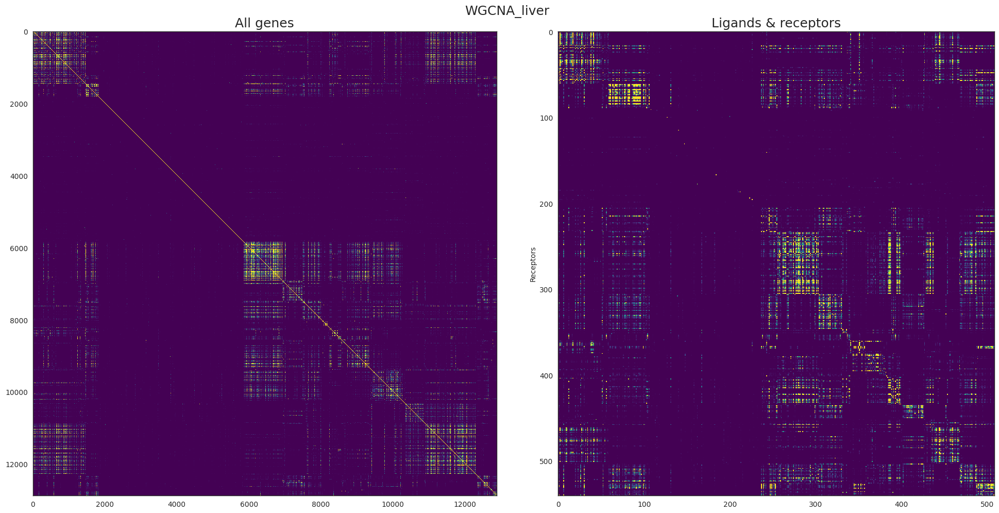

Mean value of TOM:
All genes:    0.00178
LR pairs:    0.00868


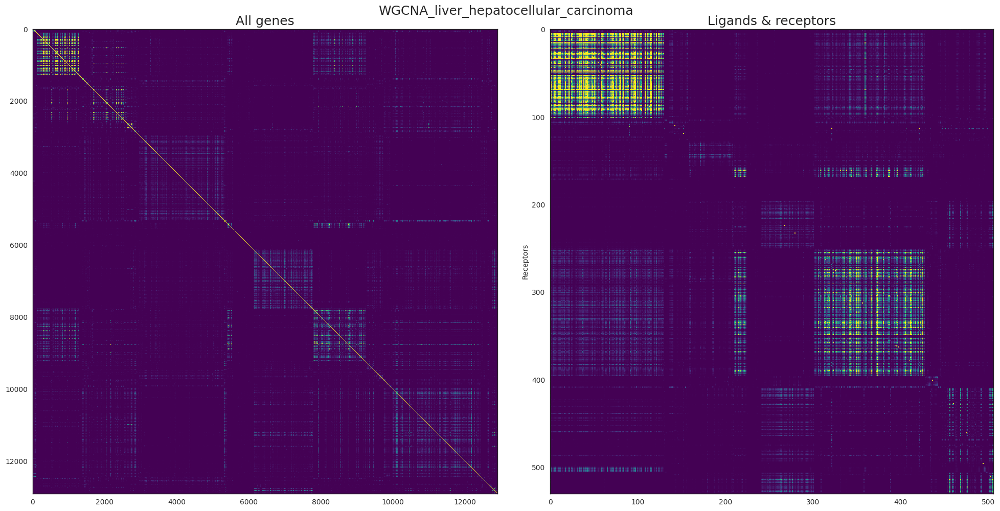

In [6]:
resource = pd.read_csv("/projects/bioinformatics/DB/CellCellCommunication/LianaResources/consensus.csv")
#resource = pd.read_csv("/projects/bioinformatics/DB/CellCellCommunication/LianaResources/cellphonedb.csv")
lr_genes = set(resource["ligand"]).union(resource["receptor"])

fs = 18
cmap='viridis'

for WGCNA in WGCNA_n, WGCNA_t:
    
    ordered = WGCNA.datExpr.var.sort_values(by="moduleLabels").index
    tom_all = WGCNA.TOM.loc[ordered, ordered]
    
    ligands_ordered = ordered[ordered.isin(resource["ligand"])]
    receptors_ordered = ordered[ordered.isin(resource["receptor"])]
    tom_lr = WGCNA.TOM.loc[ligands_ordered, receptors_ordered]
    
    print("Mean value of TOM:")
    mean_all = np.mean(tom_all.values[np.triu_indices(n=tom_all.shape[0], k=1)])
    mean_lr = np.mean(tom_lr.values[np.triu_indices(n=tom_lr.shape[0], k=1, m=tom_lr.shape[1])])

    print("All genes:    {:.5f}".format(mean_all))
    print("LR pairs:    {:.5f}".format(mean_lr))
    
    fig, ax = plt.subplots(1,2, figsize=(20,10))
    
    fig.suptitle(WGCNA.name, fontsize=fs)
    
    vmax = np.percentile(tom_lr, 99)
    vmin = 0
    cax = ax[0].imshow(tom_all, cmap=cmap, interpolation='none', vmin=vmin, vmax=vmax)
    ax[0].set_title("All genes", fontsize=fs)
    
    cax = ax[1].imshow(tom_lr, cmap=cmap, interpolation='none', vmin=vmin, vmax=vmax)
    ax[1].set_title("Ligands & receptors", fontsize=fs)
    ax[1].set_ylabel("Ligands")
    ax[1].set_ylabel("Receptors")
    
    plt.tight_layout()    
    plt.show()

In [ ]:
all_pairs.d

In [36]:
all_pairs.shape

(166745569, 2)

In [46]:
all_pairs = pd.DataFrame(
    WGCNA.TOM.where(
        np.tri(
            WGCNA.TOM.shape[0],
            dtype=bool,
            k=-1
        ),
        np.nan
    ).stack(dropna=True, sort=True), columns=["TOM"]
)

In [65]:
WGCNA.TOM.iloc[:5,:5]

,RAB4B,TIGAR,RNF44,RPL23A,ARL8B
RAB4B,1.000000e+00,0.000017,2.728838e-07,0.029141,0.000015
TIGAR,1.712677e-05,1.000000,1.206204e-04,0.000006,0.000012
RNF44,2.728838e-07,0.000121,1.000000e+00,0.000018,0.000064
RPL23A,2.914066e-02,0.000006,1.754604e-05,1.000000,0.000066
ARL8B,1.529344e-05,0.000012,6.381174e-05,0.000066,1.000000


In [72]:
all_ligands_and_receptors = set(resource["ligand"]).union(resource["receptor"])

In [76]:
all_pairs.index.isin(all_ligands_and_receptors)

0

In [81]:
valid_rows = resource[(resource['ligand'].isin(allgenes)) & (resource['receptor'].isin(allgenes))]



In [78]:
all_pairs[
    all_pairs.index.get_level_values(0).isin(all_ligands_and_receptors) |
    all_pairs.index.get_level_values(1).isin(all_ligands_and_receptors)
]

TOM
IL32   RAB4B      3.573207e-03
       TIGAR      6.693785e-05
       RNF44      1.635897e-06
       RPL23A     5.212802e-03
       ARL8B      3.686519e-06
...                        ...
PPP6R1 TPSAB1     4.515497e-06
       TNFRSF11A  2.566904e-04
       EPHB6      7.349381e-05
       GCGR       3.474937e-07
       TIMP1      6.082795e-04

[12436323 rows x 1 columns]

In [69]:
np.isin(all_pairs.index, resource["ligand"])

KeyboardInterrupt: 

In [68]:
all_pairs.index.isin(resource["ligand"])

array([False, False, False, ..., False, False, False])

In [ ]:
all_pairs.index

In [62]:
all_pairs.index.get_level_values(1)

Index(['RAB4B', 'RAB4B', 'TIGAR', 'RAB4B', 'TIGAR', 'RNF44', 'RAB4B', 'TIGAR',
       'RNF44', 'RPL23A',
       ...
       'CNDP2', 'ELAVL1', 'RBAK', 'ARHGAP21', 'DDX47', 'POMZP3', 'EIF5B',
       'KIF16B', 'CYP4F2', 'BATF3'],
      dtype='object', length=83366328)

In [7]:
# flatten TOM matrix
#all_pairs = pd.DataFrame(WGCNA.TOM.stack(dropna=True, sort=True), columns=["TOM"])
all_pairs = pd.DataFrame(WGCNA.TOM.stack(dropna=True, sort=True), columns=["TOM"])

allgenes = set(all_pairs.index.get_level_values(0))

all_pairs["LR Pair"] = False

# Identify rows where both ligand and receptor are present in allgenes
valid_rows = resource[(resource['ligand'].isin(allgenes)) & (resource['receptor'].isin(allgenes))]

# Set "LR Pair" to True for the valid rows using loc and the index
all_pairs.loc[list(zip(valid_rows['ligand'], valid_rows['receptor'])), "LR Pair"] = True

In [44]:
all_pairs.shape #old

(166745569, 2)

In [12]:
all_lr_combinations = all_pairs.loc[
    all_pairs.index.get_level_values(0).isin(resource["ligand"]) & \
    all_pairs.index.get_level_values(1).isin(resource["receptor"]) \
]

In [18]:
all_lr_combinations.shape

(268686, 2)

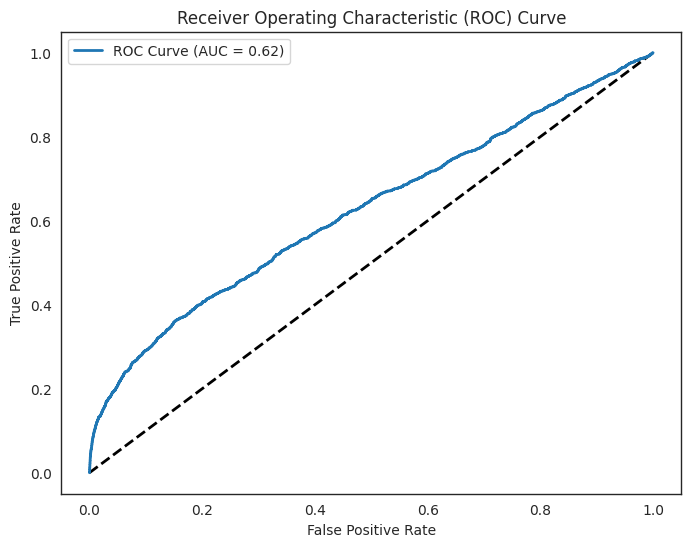

In [74]:
# Assuming df is your dataframe with columns "TOM" and "LR Pair"
# X is the feature (TOM) and y is the target variable (LR Pair)
X = all_pairs['TOM']
y = all_pairs['LR Pair']

# Calculate ROC curve for different thresholds
fpr, tpr, thresholds = roc_curve(y, X)

# Calculate AUC (Area Under the Curve)
roc_auc = roc_auc_score(y, X)

# Plot ROC curve and include AUC in the legend
plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], color='k', linestyle='--', lw=2)
plt.plot(fpr, tpr, color='C0', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [45]:
tom_all = tom_all.values
tom_all_flat = tom_all[np.triu_indices(tom_all.shape[0], k=1)]

tom_lr  = tom_lr.loc[tom_lr.index.isin(resource["ligand"]), tom_lr.columns.isin(resource["receptor"])]

AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [46]:
new_tom_lr = resource.copy()
new_tom_lr['tom_lr_values'] = np.nan

for index, row in new_tom_lr.iterrows():
    ligand = row['ligand']
    receptor = row['receptor']
    
    if (ligand in tom_lr.index) & (receptor in tom_lr.columns):

        # Access the corresponding value from tom_lr
        value = tom_lr.loc[ligand, receptor]

        # Assign the value to the 'tom_lr_values' column in new_tom_lr
        new_tom_lr.at[index, 'tom_lr_values'] = value
        


In [50]:
np.median(new_tom_lr.dropna()["tom_lr_values"])

0.0013369267686109748

In [51]:
np.median(tom_all_flat)

0.0005624204163595901

In [43]:
np.mean(tom_lr_flat)

nan

In [41]:
tom_lr_flat = new_tom_lr["tom_lr_values"].values

In [44]:
tom_lr_flat

array([0.00054969, 0.01410266, 0.00544349, ..., 0.03450438,        nan,
              nan])

In [204]:
sum(tom_lr_flat > 0.01)

443

In [13]:
import seaborn as sns

In [56]:
import matplotlib.pyplot as plt

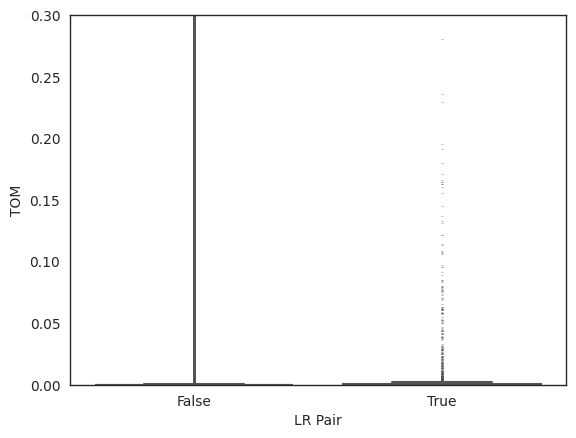

In [25]:
sns.boxplot(
    x='LR Pair',
    y='TOM',
    data=all_pairs,
    palette='muted',
    fliersize=0.1,
    #cut=0,
)

plt.ylim(0, 0.3)
plt.show()

In [31]:
import seaborn as sns

In [34]:
# Create separate DataFrames for tom_all and tom_lr
df_tom_all = pd.DataFrame({'Value': tom_all_flat, 'Matrix': 'tom_all'})
df_tom_lr = pd.DataFrame({'Value': tom_lr_flat, 'Matrix': 'tom_lr'})

# Concatenate the DataFrames vertically
data = pd.concat([df_tom_all, df_tom_lr], ignore_index=True)

# Create a violin plot using Seaborn
plt.figure(figsize=(10, 6))
sns.boxplot(
    x='Matrix',
    y='Value',
    data=data,
    palette='muted',
    #fliersize=0,
    #cut=0,
)

plt.ylim(0, 0.2)
plt.title('Topological Overlap Measure')
plt.show()

NameError: name 'tom_all_flat' is not defined

In [ ]:
# Exclude diagonal elements
np.fill_diagonal(tom_all, np.nan)
np.fill_diagonal(tom_lr, np.nan)

# Create separate DataFrames for tom_all and tom_lr
df_tom_all = pd.DataFrame(tom_all.flatten(), columns=['Value'])
df_tom_all['Matrix'] = 'tom_all'

df_tom_lr = pd.DataFrame(tom_lr.flatten(), columns=['Value'])
df_tom_lr['Matrix'] = 'tom_lr'

# Concatenate the DataFrames vertically
data = pd.concat([df_tom_all, df_tom_lr], ignore_index=True)

# Create a violin plot using Seaborn
plt.figure(figsize=(10, 6))
sns.violinplot(
    x='Matrix',
    y='Value',
    data=data,
    palette='muted',
    #fliersize=0,
    cut=0,
)
plt.title('Topological Overlap Measure')
plt.show()

In [34]:
toms = pd.DataFrame({
    "All genes": tom_all.values.flatten(),
})

toms["LR Pairs"] = np.nan
toms["LR Pairs"].iloc[:len(tom_lr.values.flatten())] = tom_lr.values.flatten()

In [ ]:
sns.violinplot(toms)

In [ ]:
sns.load_dataset("titanic").head()

In [79]:
import random

In [80]:
def generate_unique_random_pairs(k, N):
    if k > N * (N - 1) // 2:
        raise ValueError("Cannot generate more unique pairs than the total number of possible pairs.")

    pairs = set()

    while len(pairs) < k:
        pair = tuple(random.sample(range(N), 2))
        pairs.add(pair)

    return list(pairs)

def check_pairs(series, pairs):
    result = []

    for pair in pairs:
        index1, index2 = pair
        value1 = series.iloc[index1]
        value2 = series.iloc[index2]

        result.append(value1 == value2)

    return result

In [81]:
def calculate_observed_expected(WGCNA_object, k):
    N = len(WGCNA_object.datExpr.var)
    
    # Generate random pairs
    random_pairs = generate_unique_random_pairs(k, N)
    
    # Calculate observed values
    observed_result = check_pairs(WGCNA_object.datExpr.var.moduleColors, random_pairs)
    observed_result = pd.Series(observed_result)
    
    print("Observed:")
    print(observed_result.value_counts() / k)
    
    # Calculate expected values
    probs = WGCNA_object.datExpr.var.moduleColors.value_counts() / WGCNA_object.datExpr.var.shape[0]
    tot = 0
    for c1 in probs.index:
        tot += probs[c1] * (WGCNA_object.datExpr.var.moduleColors.value_counts()[c1] - 1) / (WGCNA_object.datExpr.var.shape[0] -1)
    
    print("Expected:")
    print(tot)

In [84]:
def expected_frac_same_module(WGCNA_object):
    N = len(WGCNA_object.datExpr.var)
    
    # Calculate expected values
    probs = WGCNA_object.datExpr.var.moduleColors.value_counts() / WGCNA_object.datExpr.var.shape[0]
    tot = 0
    for c1 in probs.index:
        tot += probs[c1] * (WGCNA_object.datExpr.var.moduleColors.value_counts()[c1] - 1) / (WGCNA_object.datExpr.var.shape[0] -1)
    
    return tot

In [97]:
cpdb_n = pd.read_csv(os.path.join(pancreas_dir, "normal/cellphonedb_interactions.csv"))
cpdb_t = pd.read_csv(os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/cellphonedb_interactions.csv"))

In [99]:
exp_n = expected_frac_same_module(WGCNA_normal)*cpdb_n.shape[0]
exp_t = expected_frac_same_module(WGCNA_tumor)*cpdb_t.shape[0]

In [102]:
exp_t

33.15260412032569

In [100]:
df.loc["pancreatic_adenocarcinoma"]

Name            pancreatic_adenocarcinoma
Tumor                                 -56
Normal                                 25
Difference                            -31
Sum                                    81
RelativeDiff                        78.76
Name: pancreatic_adenocarcinoma, dtype: object

In [82]:
# Example usage:
k = 1e6  # Number of unique pairs
calculate_observed_expected(WGCNA_normal, k)

Observed:
False    0.938841
True     0.061159
Name: count, dtype: float64
Expected:
0.061459809206494236


In [83]:
# Example usage:
k = 1e6  # Number of unique pairs
calculate_observed_expected(WGCNA_tumor, k)

Observed:
False    0.90364
True     0.09636
Name: count, dtype: float64
Expected:
0.0963738491869933


In [28]:
WGCNA_normal.datExpr.shape

(167, 13428)

In [30]:
WGCNA_tumor.datExpr.shape

(178, 14635)

In [19]:
WGCNA_normal.datExpr.var.top_50pct_variable.value_counts()

top_50pct_variable
True     7789
False    7625
Name: count, dtype: int64

In [9]:
WGCNA_tumor.datExpr.var

,ensembl,symbol,MAD,top_50pct_variable,top_50pct_variable_in_tissue,dynamicColors,moduleColors,moduleLabels
RAB4B,ENSG00000167578,RAB4B,1.0569,False,True,dimgrey,dimgrey,3
TIGAR,ENSG00000078237,TIGAR,1.3634,False,True,gainsboro,gainsboro,5
RNF44,ENSG00000146083,RNF44,0.5941,False,False,gainsboro,gainsboro,5
DNAH3,ENSG00000158486,DNAH3,3.0484,True,True,indianred,indianred,6
RPL23A,ENSG00000198242,RPL23A,0.4619,False,False,gainsboro,gainsboro,5
...,...,...,...,...,...,...,...,...
KIF16B,ENSG00000089177,KIF16B,0.8554,False,True,gainsboro,gainsboro,5
CYP4F2,ENSG00000186115,CYP4F2,1.5536,True,True,firebrick,firebrick,4
TENM1,ENSG00000009694,TENM1,0.9653,True,True,darkred,darkred,2
BATF3,ENSG00000123685,BATF3,1.5689,True,True,lightgrey,lightgrey,8


In [17]:
WGCNA_normal.datExpr.var.moduleColors.value_counts()

moduleColors
silver    7697
black      270
Name: count, dtype: int64

In [15]:
WGCNA_tumor.datExpr.var.moduleColors.value_counts()

moduleColors
darkgrey      2917
dimgrey       2152
gainsboro      976
black          568
white          518
salmon         404
lightcoral     221
firebrick      216
coral          190
silver         153
lightgrey      138
mistyrose      132
indianred      111
darkred         96
red             87
tomato          79
brown           62
darksalmon      56
Name: count, dtype: int64

In [29]:
comparison.jaccard_similarity.head(5)

,Pancreas:gainsboro,Pancreas:dimgrey,Pancreas:lightgrey,Pancreas:black,Pancreas:rosybrown,Pancreas:silver,Pancreatic Adenocarcinoma:coral,Pancreatic Adenocarcinoma:firebrick,Pancreatic Adenocarcinoma:darkgrey,Pancreatic Adenocarcinoma:lightcoral,Pancreatic Adenocarcinoma:orangered,Pancreatic Adenocarcinoma:maroon,Pancreatic Adenocarcinoma:sienna,Pancreatic Adenocarcinoma:darksalmon,Pancreatic Adenocarcinoma:tomato,Pancreatic Adenocarcinoma:lightsalmon,Pancreatic Adenocarcinoma:seashell,Pancreatic Adenocarcinoma:chocolate,Pancreatic Adenocarcinoma:black,Pancreatic Adenocarcinoma:red
Pancreas:gainsboro,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.007051,0.006301,0.123548,0.001266,0.000000,0.003268,0.003812,0.004902,0.003273,0.003571,0.012570,0.000000,0.000000
Pancreas:dimgrey,0.0,1.0,0.0,0.0,0.0,0.0,0.131135,0.427354,0.131437,0.090392,0.001656,0.037268,0.000000,0.007726,0.000000,0.000229,0.000000,0.000680,0.000381,0.000000
Pancreas:lightgrey,0.0,0.0,1.0,0.0,0.0,0.0,0.028143,0.140286,0.138881,0.087693,0.013782,0.017055,0.003217,0.020820,0.004508,0.004510,0.001732,0.008211,0.006883,0.001079
Pancreas:black,0.0,0.0,0.0,1.0,0.0,0.0,0.011834,0.021617,0.020751,0.019158,0.004762,0.017286,0.001502,0.004768,0.000000,0.001504,0.001629,0.002577,0.000000,0.000000
Pancreas:rosybrown,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000084,0.008937,0.003655,0.005831,0.000000,0.000000,0.036145,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [10]:
#LIVER
liver_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/Liver/"

path_normal = os.path.join(liver_dir, "normal/Liver/Liver.p")
WGCNA_normal = PyWGCNA.readWGCNA(path_normal)

path_tumor = os.path.join(liver_dir, "tumor/Liver Hepatocellular Carcinoma/Liver Hepatocellular Carcinoma.p")
WGCNA_tumor = PyWGCNA.readWGCNA(path_tumor)

Reading Liver WGCNA done!
Reading Liver Hepatocellular Carcinoma WGCNA done!


In [10]:
WGCNA_normal.datExpr.var.moduleColors.unique()

array(['lightgrey', 'darkgrey', 'black', 'gainsboro'], dtype=object)

In [17]:
WGCNA_tumor.datExpr.var

,ensembl,symbol,MAD,top_50pct_variable,top_50pct_variable_in_tissue,dynamicColors,moduleColors,moduleLabels
TIGAR,ENSG00000078237,TIGAR,0.755400,False,True,dimgrey,dimgrey,1
DNAH3,ENSG00000158486,DNAH3,3.459384,True,True,white,white,8
CALB2,ENSG00000172137,CALB2,1.898200,True,True,firebrick,firebrick,2
DACH1,ENSG00000276644,DACH1,1.385700,True,True,gainsboro,gainsboro,3
FMO2,ENSG00000094963,FMO2,1.434100,True,True,silver,silver,6
...,...,...,...,...,...,...,...,...
SLCO4C1,ENSG00000173930,SLCO4C1,2.439900,True,True,gainsboro,gainsboro,3
KIF16B,ENSG00000089177,KIF16B,0.617700,False,True,dimgrey,dimgrey,1
CYP4F2,ENSG00000186115,CYP4F2,0.974900,True,True,gainsboro,gainsboro,3
TENM1,ENSG00000009694,TENM1,2.494200,True,True,gainsboro,gainsboro,3


In [13]:
cpdb = pd.read_csv("/projects/bioinformatics/DB/decoupler/CellPhoneDB/CellPhoneDB.csv.gz")

In [16]:
cpdb

,genesymbol,integrin,peripheral,receptor,receptor_class,secreted,secreted_class,transmembrane
0,ESR1,False,True,True,receptor,False,NaN,False
1,RORB,False,False,True,receptor,False,NaN,False
2,ABCA1,False,False,False,NaN,False,NaN,True
3,NR1H3,False,False,True,receptor,False,NaN,False
4,NR3C1,False,False,True,receptor,False,NaN,False
...,...,...,...,...,...,...,...,...
1349,SLC32A1,False,False,False,NaN,False,NaN,False
1350,VSIR,False,False,True,receptor,False,NaN,True
1351,SLC18A1,False,False,False,NaN,False,NaN,False
1352,SLC18A2,False,False,False,NaN,False,NaN,False


In [3]:
import scanpy as sc

In [4]:
adata = sc.read_h5ad("/projects/bioinformatics/DB/Xena/TCGA_GTEX/TCGA_GTEX.h5ad")

In [5]:
rename = {
    "X_study": "study",
    "X_gender": "gender",
    "X_sample_type": "type",
    "X_primary_site": "tissue",
    "primary_disease_or_tissue": "condition"
}

adata.obs.rename(columns=rename, inplace=True)
adata.obs

,detailed_category,condition,tissue,type,gender,study
GTEX-1117F-0226-SM-5GZZ7,Adipose - Subcutaneous,Adipose - Subcutaneous,Adipose Tissue,Normal Tissue,Female,GTEX
GTEX-1117F-0426-SM-5EGHI,Muscle - Skeletal,Muscle - Skeletal,Muscle,Normal Tissue,Female,GTEX
GTEX-1117F-0526-SM-5EGHJ,Artery - Tibial,Artery - Tibial,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0626-SM-5N9CS,Artery - Coronary,Artery - Coronary,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0726-SM-5GIEN,Heart - Atrial Appendage,Heart - Atrial Appendage,Heart,Normal Tissue,Female,GTEX
...,...,...,...,...,...,...
TCGA-ZS-A9CG-01,Liver Hepatocellular Carcinoma,Liver Hepatocellular Carcinoma,Liver,Primary Tumor,Male,TCGA
TCGA-ZT-A8OM-01,Thymoma,Thymoma,Thymus,Primary Tumor,Female,TCGA
TCGA-ZU-A8S4-01,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Primary Tumor,Male,TCGA
TCGA-ZU-A8S4-11,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Solid Tissue Normal,Male,TCGA


In [12]:
adata[adata.obs['tissue'] == 'Cervix Uteri'].obs.condition.value_counts()

Cervix - Ectocervix    6
Cervix - Endocervix    4
Name: condition, dtype: int64

In [6]:
adata[adata.obs.isna().sum(axis=1) > 0, :].obs

,detailed_category,condition,tissue,type,gender,study
GTEX-YEC3-1426-101806-SM-5PNXX,Stomach,Stomach,NaN,Normal Tissue,Male,GTEX
GTEX-YEC3-2526-101809-SM-5CVLT,Esophagus - Mucosa,Esophagus - Mucosa,NaN,Normal Tissue,Male,GTEX
GTEX-YEC4-1026-101814-SM-5P9FX,Esophagus - Mucosa,Esophagus - Mucosa,NaN,Normal Tissue,Male,GTEX
GTEX-YFC4-0126-101855-SM-5CVLZ,Skin - Sun Exposed (Lower Leg),Skin - Sun Exposed (Lower Leg),NaN,Normal Tissue,Female,GTEX
TCGA-06-0675-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0678-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0680-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0681-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-AABW-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-07-0249-20,NaN,NaN,NaN,Control Analyte,NaN,TCGA


In [ ]:
add_tissues = {
    'Esophagus - Mucosa': 'Esophagus',
    'Stomach': 'Stomach',
    'Skin - Sun Exposed (Lower Leg)': 'Skin'
}

for k, v in add_tissues.items():
    adata.obs.loc[np.logical_and(adata.obs["tissue"].isna(), adata.obs["condition"] == k), "tissue"] = v
    print(f"Added tissue {v} to samples with condition {k}")

In [161]:
adata[adata.obs.isna().sum(axis=1) > 0, :].obs

,detailed_category,condition,tissue,type,gender,study
TCGA-06-0675-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0678-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0680-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0681-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-AABW-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-07-0249-20,NaN,NaN,NaN,Control Analyte,NaN,TCGA
TCGA-28-2510-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,NaN,TCGA
TCGA-2G-AAKO-01,Testicular Germ Cell Tumor,Testicular Germ Cell Tumor,Testis,Primary Tumor,NaN,TCGA
TCGA-2G-AAKO-05,Testicular Germ Cell Tumor,Testicular Germ Cell Tumor,Testis,Additional - New Primary,NaN,TCGA
TCGA-2G-AALF-01,Testicular Germ Cell Tumor,Testicular Germ Cell Tumor,Testis,Primary Tumor,NaN,TCGA


In [12]:
adata[adata.obs.detailed_category == 'Esophagus - Mucosa'].obs.tissue.value_counts

Stomach    174
NaN          1
Name: tissue, dtype: int64

Esophagus    271
Name: tissue, dtype: int64

In [4]:
adata

AnnData object with n_obs × n_vars = 18305 × 60498
    obs: 'detailed_category', 'primary_disease_or_tissue', 'X_primary_site', 'X_sample_type', 'X_gender', 'X_study'
    layers: 'TPM', 'raw_counts'

In [15]:
is_in_tcga = adata.obs["X_study"] == "TCGA"

In [ ]:
adata = adata[is_in_tcga]

In [ ]:
ad

In [18]:
adata[is_in_tcga].obs

,detailed_category,primary_disease_or_tissue,X_primary_site,X_sample_type,X_gender,X_study
TCGA-02-0047-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Male,TCGA
TCGA-02-0055-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Female,TCGA
TCGA-02-2483-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Male,TCGA
TCGA-02-2485-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Male,TCGA
TCGA-04-1331-01,Ovarian Serous Cystadenocarcinoma,Ovarian Serous Cystadenocarcinoma,Ovary,Primary Tumor,Female,TCGA
...,...,...,...,...,...,...
TCGA-ZS-A9CG-01,Liver Hepatocellular Carcinoma,Liver Hepatocellular Carcinoma,Liver,Primary Tumor,Male,TCGA
TCGA-ZT-A8OM-01,Thymoma,Thymoma,Thymus,Primary Tumor,Female,TCGA
TCGA-ZU-A8S4-01,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Primary Tumor,Male,TCGA
TCGA-ZU-A8S4-11,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Solid Tissue Normal,Male,TCGA


In [148]:
#tissue = 'blood'
path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/{tissue}/normal/{tissue}.h5ad'

#path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/eye/tumor/uveal_melanoma/uveal_melanoma.h5ad'
#path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/tumor/pancreatic_adenocarcinoma/pancreatic_adenocarcinoma.h5ad'
#path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/tumor/liver_hepatocellular_carcinoma/liver_hepatocellular_carcinoma.h5ad'



adata = sc.read_h5ad(path)
adata.shape

(548, 14069)

std: Found 7 outlier
mad: Found 99 outlier


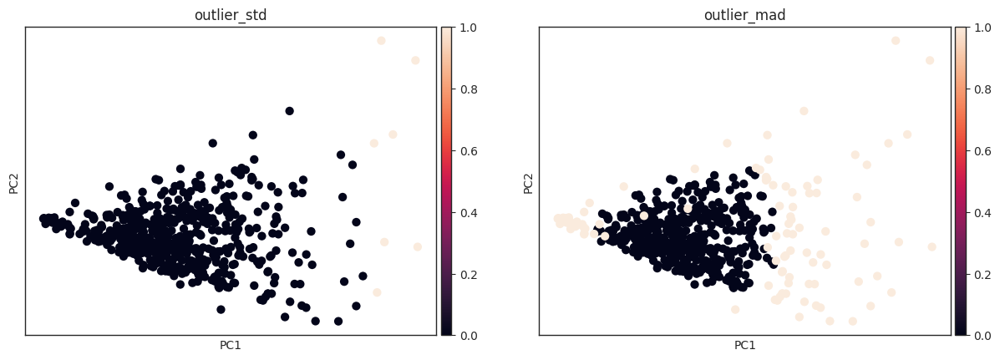

In [149]:
adata.X = adata.layers["deseq2_norm_counts"]

# Calculate PCA
sc.pp.pca(adata, n_comps=10, use_highly_variable=False) 

# Calculate centroid of the PCA using median
centroid = np.median(adata.obsm["X_pca"], axis=0)

# Calculate distance from centroid
adata.obs["pca_distance"] = np.linalg.norm(adata.obsm["X_pca"] - centroid, axis=1)

# Remove samples that are more than 5 standard deviations away from the median
std = np.std(adata.obs["pca_distance"])
mad = np.median(np.abs(adata.obs["pca_distance"] - np.median(adata.obs["pca_distance"])))
n = 5

print("std: Found {} outlier".format(len(adata.obs[adata.obs["pca_distance"] > n*std])))
adata.obs['outlier_std'] = np.where(adata.obs["pca_distance"] > n * std, 1, 0)
print("mad: Found {} outlier".format(len(adata.obs[adata.obs["pca_distance"] > n*mad])))
adata.obs['outlier_mad'] = np.where(adata.obs["pca_distance"] > n * mad, 1, 0)

#adata = adata[adata.obs["pca_distance"] <= 3 * mad]

sc.pl.pca(adata, color=['outlier_std', 'outlier_mad'])

# Sankey

In [127]:
pancreas_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas"

nlr = pd.read_csv(os.path.join(pancreas_dir, "normal/LR_interactions.csv"))
tlr = pd.read_csv(os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/LR_interactions.csv"))

module_similarity = pd.read_csv(os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/module_similarity.csv"), index_col=0)

In [128]:
liver_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver"

nlr = pd.read_csv(os.path.join(liver_dir, "normal/LR_interactions.csv"))
tlr = pd.read_csv(os.path.join(liver_dir, "tumor/liver_hepatocellular_carcinoma/LR_interactions.csv"))

module_similarity = pd.read_csv(os.path.join(liver_dir, "tumor/liver_hepatocellular_carcinoma/module_similarity.csv"), index_col=0)

In [132]:
nlr = nlr[(nlr.ligand + '-' + nlr.receptor).isin(tlr.ligand + '-' + tlr.receptor)]

In [133]:
tlr = tlr[(tlr.ligand + '-' + tlr.receptor).isin(nlr.ligand + '-' + nlr.receptor)]

In [134]:
same_module = nlr["same_module"]
nlr["consensus_module"] = "_different"
nlr.loc[same_module, "consensus_module"] = nlr.loc[same_module, "L_module"]

same_module = tlr["same_module"]
tlr["consensus_module"] = "_different"
tlr.loc[same_module, "consensus_module"] = tlr.loc[same_module, "L_module"]

In [136]:
nlr

,ligand,receptor,type,same_module,L_module,R_module,TOM,adjacency,consensus_module
0,LGALS9,PTPRC,ligand-receptor,False,1,5,1.378712e-03,1.478635e-05,_different
1,LGALS9,MET,ligand-receptor,False,1,3,1.954073e-15,0.000000e+00,_different
2,LGALS9,CD44,ligand-receptor,False,1,2,6.256026e-03,3.015149e-03,_different
3,LGALS9,LRP1,ligand-receptor,True,1,1,8.903721e-07,2.846861e-14,1
4,LGALS9,CD47,ligand-receptor,False,1,3,1.647149e-03,6.757767e-04,_different
...,...,...,...,...,...,...,...,...,...
1560,AKR1B1,PTGER4,enzyme-receptor,False,1,4,3.904451e-05,7.460441e-10,_different
1561,PTGIS,PTGER4,enzyme-receptor,False,2,4,5.756701e-06,1.770975e-11,_different
1568,PTGIS,PTGIR,enzyme-receptor,False,2,0,3.663529e-03,1.482083e-03,_different
1569,HPGD,TBXA2R,enzyme-receptor,False,6,0,8.638159e-10,0.000000e+00,_different


In [137]:
consensus_df = pd.merge(
    nlr,
    tlr,
    on=["ligand", "receptor"],
    suffixes=("_normal", "_tumor")
)[["ligand", "receptor", "consensus_module_normal", "consensus_module_tumor"]]

consensus_df.head()

#consensus_df = consensus_df[consensus_df["consensus_module_normal"] != "_different"]
#consensus_df = consensus_df[consensus_df["consensus_module_tumor"] != "_different"]

,ligand,receptor,consensus_module_normal,consensus_module_tumor
0,LGALS9,PTPRC,_different,0
1,LGALS9,MET,_different,_different
2,LGALS9,CD44,_different,0
3,LGALS9,LRP1,1,_different
4,LGALS9,CD47,_different,0


In [69]:
module_changes = pd.DataFrame(
    0,
    index=consensus_df["consensus_module_normal"].value_counts().index,
    columns=consensus_df["consensus_module_tumor"].value_counts().index,
)

for normal_module in consensus_df["consensus_module_normal"].unique():
    for tumor_module in consensus_df["consensus_module_tumor"].unique():
        
        module_changes.loc[normal_module, tumor_module] = sum(
            (consensus_df["consensus_module_normal"] == normal_module) & (consensus_df["consensus_module_tumor"] == tumor_module)
        )
        
module_changes = module_changes.fillna(0)

module_changes.index = "N" + module_changes.index.astype(str)# + ": (" + module_changes.sum(axis=1).astype(str) + " pairs)"
module_changes.columns = "T" + module_changes.columns.astype(str)# + ": (" + module_changes.sum(axis=0).astype(str) + " pairs)"

In [70]:
#module_similarity.loc["N_different"] = 1
#module_similarity["T_different"] = 0

In [71]:
labels = list(module_changes.index) + list(module_changes.columns)
source = []
target = []
value = []
similarity = []

for norm, row in module_changes.iterrows():
    for tum, val in row.iteritems():
        if val > 0:
            source.append(labels.index(norm))
            target.append(labels.index(tum))
            value.append(val)
            if (norm in module_similarity.index) & (tum in module_similarity.columns):
                similarity.append(module_similarity.loc[norm, tum])
            else:
                similarity.append(np.nan)

In [72]:
def interpolate_color(color1, color2, value, opacity):
    """
    Interpolate between two RGBA colors based on a given value.

    Parameters:
    - color1: Tuple representing the RGBA values of the first color.
    - color2: Tuple representing the RGBA values of the second color.
    - value: Interpolation value between 0 and 1.
    - fixed_opacity: Fixed opacity value between 0 and 1.

    Returns:
    - Interpolated RGBA tuple.
    """
    r = int(color1[0] + (color2[0] - color1[0]) * value)
    g = int(color1[1] + (color2[1] - color1[1]) * value)
    b = int(color1[2] + (color2[2] - color1[2]) * value)
    a = opacity
    return f"rgba({r},{g},{b},{a})"

# Example usage:
opacity = 0.5  # Set the fixed opacity value
t_color = (255, 0, 0) + (opacity,)  # Red
n_color = (0, 0, 255) + (opacity,)  # Blue
nan_color = (100, 100, 100) + (opacity,) 

colors = []

for norm, row in module_changes.iterrows():
    for tum, val in row.iteritems():
        if val > 0:
            if (norm in module_similarity.index) & (tum in module_similarity.columns):
                r, g, b, a = nan_color
                colors.append(f"rgba({r},{g},{b},{a})")
            else:
                if (norm == "N_different") & (tum == "T_different"):
                    r, g, b, a = nan_color
                    colors.append(f"rgba({r},{g},{b},{a})")
                elif (norm == "N_different"):
                    r, g, b, a = t_color
                    colors.append(f"rgba({r},{g},{b},{a})")
                elif (tum == "T_different"):
                    r, g, b, a = n_color
                    colors.append(f"rgba({r},{g},{b},{a})")

In [73]:
import plotly.graph_objects as go

In [74]:
r, g, b, a = t_color
tc = f"rgba({r},{g},{b},{a})"

r, g, b, a = n_color
nc = f"rgba({r},{g},{b},{a})"

color = [nc] * module_changes.shape[0] + [tc] * module_changes.shape[1]

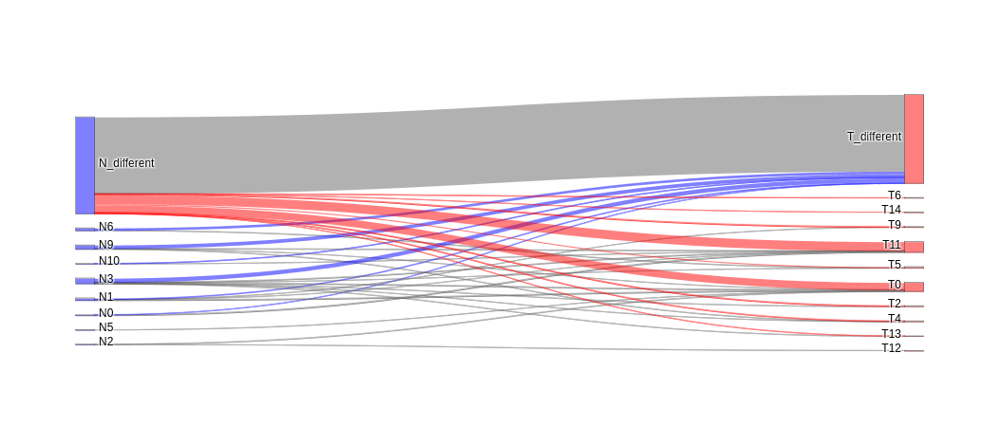

In [75]:
INVERT = True

if INVERT:
    source = source[::-1]
    target = target[::-1]
    value =  value[::-1]
    colors =  colors[::-1]

fig = go.Figure(
    go.Sankey(
        arrangement='snap',
        node = dict(
            pad = 15,
            thickness = 20,
            #line = dict(color = "black", width = 0.5),
            label = labels,
            color = color,
            align="right",
        ),
        link = dict(
            source = source,
            target = target,
            value =  value,
            color =  colors
        )
    )
)

#fig.update_layout(title_text="$log_{10}(1 + N_{pairs})$", font_size=10)
fig.show()

In [83]:
module_changes

,T_different,T11,T0,T5,T4,T9,T2,T6,T13,T14,T12
N_different,892,105,86,13,6,9,8,4,2,1,0
N3,48,6,6,1,1,0,2,0,2,0,0
N9,42,4,1,0,3,0,0,0,0,0,0
N6,30,0,0,3,0,0,0,0,0,0,0
N1,18,1,9,0,0,1,0,0,0,0,0
N0,1,9,0,0,0,0,0,0,0,0,0
N10,4,1,0,0,0,0,0,0,0,0,0
N2,0,0,4,0,0,0,0,0,0,0,1
N5,0,0,1,0,0,0,0,0,0,0,0


In [15]:
import gseapy as gp

path = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/adrenal_gland/tumor/adrenocortical_cancer/wgcna_adrenocortical_cancer.p"
WGCNA = PyWGCNA.readWGCNA(path)

Reading wgcna_adrenocortical_cancer WGCNA done!


In [16]:
all_genes = WGCNA.datExpr.var.index.tolist()

In [17]:
WGCNA.datExpr.var['moduleLabels'].value_counts()

0     2416
8     1187
18    1124
9      940
10     926
19     906
17     876
6      840
7      747
12     611
1      550
15     429
14     252
4      233
5      232
13     213
16     162
11     160
3      138
2        3
Name: moduleLabels, dtype: int64

In [11]:
reactome = '/home/lnemati/resources/reactome/ReactomeLowestLevelPathways.gmt'

for module in WGCNA.datExpr.var["moduleLabels"].unique():    
    module_genes = WGCNA.datExpr.var[WGCNA.datExpr.var["moduleLabels"] == module].index.tolist()
    enr = gp.enrichr(
        gene_list=module_genes,                              
        #gene_sets="Reactome_2022",                          
        gene_sets=reactome,                                  
        background=all_genes,                                
        outdir=None,
        )
    enr = enr.results                                        
    # Only keep significant enrichments                      
    #enr = enr[enr["Adjusted P-value"] < 0.05]                
    ## Add module column and concatenate                      
    #enr["module"] = module                                   
    #enrichment = pd.concat([enrichment, enr])

ValueError: No objects to concatenate